## Modules

In [1]:
# modules - probably too many
import numpy as np
import pandas as pd
import pickle
import matplotlib
import scipy
from sklearn.preprocessing import MinMaxScaler
from sklearn import metrics
from sklearn.metrics import pairwise_distances
from sklearn import linear_model
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_validate
from sklearn.model_selection import train_test_split
from sklearn.tree import export_text
from sklearn import neighbors
from matplotlib import pyplot as plt
from matplotlib import cm as cm
import matplotlib.colors as colors
from scipy import stats
pd.options.mode.chained_assignment = None  # default='warn'
import math
import seaborn as sns
import multiprocessing
import numpy.matlib as npm
import geeadd
import ee
import mlLocal
from importlib import reload

In [2]:
#code the input feature domain by using a linear hash for each row of the input data frame
#the hash algorithm converts each input row into an integer from 0 to 9 by applying the provided scale and offset and then rounding
#is then produces a hash entry for each row by packing the integers consequitively to form a uint64 code
#this implies a limit of at most 18 columns for the input data frame
#returns a list corresonding to hash table of unique coded input rows
def makeDomain(df,domainIndex,domainScaling,domainOffset):
    df = np.array(df) 
    if df.shape[1] < 19 :
        domainIndex = np.array(domainIndex)
        domainScaling = np.array(domainScaling)
        domainOffset = np.array(domainOffset)
    else:
        raise ValueError("More than 18 dimensions in domain")
    return np.uint64(np.unique(np.sum(np.clip(np.around(df* domainScaling + domainOffset,0),0,9) * np.power(10,np.cumsum(domainIndex)-domainIndex[0]),1),0)).tolist()
          

In [3]:
def trainClassifier(dataDict,regressorsNames,regressorsGEENames, response, domainScaling,domainOffset,samplingFeatures=None,minSubSamples=2000,minSatSamples=-1,maxSamples=10000,percentilePairwiseDist=99,maxleafnodesParent= 1, minSamplesLeafParent=100, maxleafnodesChild= 999, minSamplesLeafChild=10,maxFeatures="auto",nTrees = 100):
    
    
    # make generic names for regressors for use in GEE
    regressors = []
    for item in np.arange(1,len(regressorsNames)+1,1):
        regressors.append('x' + str(item))

    # Calibrate hierarchal randforest preeidctors for each biome
    for biome in dataDict.keys():
        print('biome:',biome)

        if ( biome <10):
            # subset only the regressors and response 
            dfBiome = dataDict[biome]['DF'][sum([regressorsNames,response],[])].astype('int')

            
            # resample the data for calibrating parent tree
            if ( samplingFeatures != None ) :
                dfParent = resampleDF(dfBiome ,regressorsNames,samplingFeatures,minSubSamples=minSubSamples,minSatSamples=minSatSamples,maxSamples=maxSamples,percentilePairwiseDist=percentilePairwiseDist)
                print('subsampled',dfParent.shape)

                dfParent = resampleDF(dfParent,regressorsName,features,minSubSamples,minSubSamples=minSubSamples,minSatSamples=minSatSamples,maxSamples=maxSamples,percentilePairwiseDist=50)
            else :
                dfParent = dfBiome
                
            dfBiome.columns = sum([regressors,response],[])
            dfParent.columns = sum([regressors,response],[])
            print(dfBiome.shape)
            print(dfParent.shape)
             # populate a parent RF dictionary that holds a single tree RF used to partition data into child RFs
            parentRFDict = {}
            parentRFDict.update({'regressors': regressors})
            parentRFDict.update({'regressorsGEE': regressorsGEENames})
            parentRFDict.update({'response': response})
            parentRFDict.update({'domain':makeDomain(dfBiome[regressors],domainIndex,domainScaling,domainOffset)})
            parentRFDict.update({'RF': RandomForestRegressor(n_estimators=1,min_samples_leaf=minSamplesLeafParent,min_samples_split=int(dfParent.shape[0]*0.1),bootstrap=False,random_state=0,verbose=0,max_depth=10,max_leaf_nodes=maxleafnodesParent,max_features=maxFeatures,n_jobs=40) \
                                                                                                         .fit(dfParent[regressors], np.array(dfParent[response]).ravel())})       
            
            # label input data using the prediction from the parent RF as this will be unique
            dfBiome['estimate']=np.around(np.array(parentRFDict['RF'].predict(dfBiome[regressors])),decimals=3)

            # populate dictionary of children RFs, each childRF is itself a dictionary similar to the parentRF but now using more than one tree
            # each child is labelled using the prediction value from the parentRF corresponding to its partition
            childrenRFDict = {}
            print('number children:',np.unique(np.around(np.array(parentRFDict['RF'].predict(dfBiome[regressors])),decimals=3)).size)
            for partition in np.unique(np.around(np.array(parentRFDict['RF'].predict(dfBiome[regressors])),decimals=3)):
                dfpartitionBiome = dfBiome.loc[dfBiome['estimate'] == partition]
                childRFDict = {}
                childRFDict.update({'size': dfpartitionBiome[response].shape[0]})
                childRFDict.update({'regressors': regressors})
                childRFDict.update({'regressorsGEE': regressorsGEENames})
                childRFDict.update({'response': response})
                childRFDict.update({'domain':makeDomain(dfpartitionBiome[regressors],domainIndex,domainScaling,domainOffset)})
                childRFDict.update({'RF': RandomForestRegressor(n_estimators=nTrees,min_samples_leaf=minSamplesLeafChild,bootstrap=True,random_state=0,verbose=0,max_depth=9,max_leaf_nodes=maxleafnodesChild,max_features=maxFeatures,n_jobs=40) \
                                         .fit(dfpartitionBiome[regressors], np.array(dfpartitionBiome[response]).ravel())})             
                childrenRFDict.update({partition: childRFDict})

            # assign the childrenRFDict to the parent
            parentRFDict.update({'childrenRFDict':childrenRFDict })      

            #assign the parentRF dict to the calibration data dictionary for trhis biome
            dataDict[biome].update({method+response[0]+'parentRFDict':parentRFDict})   
    return dataDict

In [4]:
# apply algorithm to data 
def predictClassifier(dataDict,methodDict, method, regressorsNames, response):
    # make generic names for regressors for use in GEE
    regressors = []
    for item in np.arange(1,len(regressorsNames)+1,1):
        regressors.append('x' + str(item))

    # Calibrate hierarchal randforest preeidctors for each biome
    for biome in dataDict.keys():
        print('biome:',biome)

        if ( biome <9):
            # subset only the regressors 
            dfBiome = dataDict[biome]['DF'][sum([regressorsNames],[])].astype('int')
            dfBiome.columns = regressors

            #apply the parent classifier
            parentRF = methodDict[biome][method+response[0]+'parentRFDict']['RF']
            dfBiome['childNames'] =  np.around(parentRF.predict(dfBiome),decimals=3)
            dataDict[biome]['DF'][method + response[0]+'childNames'] =dfBiome['childNames']

            for partition in np.unique(dfBiome['childNames'] ):
                dfBiome.loc[dfBiome['childNames']==partition,method + response[0]] = methodDict[biome][method+response[0]+'parentRFDict']['childrenRFDict'][partition]['RF'].predict(dfBiome.loc[dfBiome['childNames']==partition][regressors])  
            dataDict[biome]['DF'][method + response[0]] = dfBiome[method + response[0]]
           
    return dataDict

In [5]:
# construct hierarchal random forests for FTL method
def hierarchicalRF(dataDictParent,dataDictChild,regressorsNames,regressorsGEENames, response, domainScaling,domainOffset, maxDepthParent=20, maxDepthChild=20, minSamplesSplit=11,maxleafnodesParent= 100, minSamplesLeafParent=10, maxleafnodesChild= 999, minSamplesLeafChild=10,maxFeatures="auto",nTrees = 100):
    
    
    # make generic names for regressors for use in GEE
    regressors = []
    for item in np.arange(1,len(regressorsNames)+1,1):
        regressors.append('x' + str(item))

    # Calibrate hierarchal randforest preeidctors for each biome
    for biome in dataDictParent.keys():
        print('biome:',biome)

        # subset only the regressors and response 
        dfBiome = dataDictChild[biome]['DF'][sum([regressorsNames,response],[])].astype('int')   
        dfParent = dataDictParent[biome]['DF'][sum([regressorsNames,response],[])].astype('int')


        dfBiome.columns = sum([regressors,response],[])
        dfParent.columns = sum([regressors,response],[])
        print('Total size ',dfBiome.shape)
        print('Parent size ',dfParent.shape)
         # populate a parent RF dictionary that holds a single tree RF used to partition data into child RFs
        parentRFDict = {}
        parentRFDict.update({'regressors': regressors})
        parentRFDict.update({'regressorsGEE': regressorsGEENames})
        parentRFDict.update({'response': response})
        parentRFDict.update({'domain':makeDomain(dfBiome[regressors],domainIndex,domainScaling,domainOffset)})
        parentRFDict.update({'RF': RandomForestRegressor(n_estimators=1,min_samples_leaf=minSamplesLeafParent,min_samples_split=minSamplesSplit,bootstrap=False,random_state=0,verbose=0,max_depth=maxDepthParent,max_leaf_nodes=maxleafnodesParent,max_features=maxFeatures,n_jobs=40) \
                                                                                                         .fit(dfParent[regressors], np.array(dfParent[response]).ravel())})         
        # label input data using the prediction from the parent RF as this will be unique
        dfBiome['estimate']=np.around(np.array(parentRFDict['RF'].predict(dfBiome[regressors])),decimals=3)

        # populate dictionary of children RFs, each childRF is itself a dictionary similar to the parentRF but now using more than one tree
        # each child is labelled using the prediction value from the parentRF corresponding to its partition
        childrenRFDict = {}
        print('number children:',np.unique(np.around(np.array(parentRFDict['RF'].predict(dfBiome[regressors])),decimals=3)).size)
        for partition in np.unique(np.around(np.array(parentRFDict['RF'].predict(dfBiome[regressors])),decimals=3)):
            dfpartitionBiome = dfBiome.loc[dfBiome['estimate'] == partition]
            childRFDict = {}
            childRFDict.update({'size': dfpartitionBiome[response].shape[0]})
            childRFDict.update({'regressors': regressors})
            childRFDict.update({'regressorsGEE': regressorsGEENames})
            childRFDict.update({'response': response})
            childRFDict.update({'domain':makeDomain(dfpartitionBiome[regressors],domainIndex,domainScaling,domainOffset)})
            childRFDict.update({'RF': RandomForestRegressor(n_estimators=nTrees,min_samples_leaf=minSamplesLeafChild,bootstrap=True,random_state=0,verbose=0,max_depth=maxDepthChild,max_leaf_nodes=maxleafnodesChild,max_features=maxFeatures,n_jobs=40) \
                                     .fit(dfpartitionBiome[regressors], np.array(dfpartitionBiome[response]).ravel())})             
            childrenRFDict.update({partition: childRFDict})

        # assign the childrenRFDict to the parent
        parentRFDict.update({'childrenRFDict':childrenRFDict })      

        #assign the parentRF dict to the calibration data dictionary for trhis biome
        dataDictParent[biome].update({method+response[0]+'parentRFDict':parentRFDict})   
    return dataDictParent

In [6]:
# histogram plot of values and density for LAI and fAPAR for a biome and save to file

def histplotKDE(biome,outputFileName=None) :
    sns.set_context("paper")
    df1 = calbiomeDictLAI[biome]['DF'][['LAI','kde']].sample(np.min([1000,calbiomeDictLAI[biome]['DF'].shape[0]])).divide([10.,1.])
    df2 = valbiomeDictLAI[biome]['DF'][['LAI','kde']].sample(np.min([1000,valbiomeDictLAI[biome]['DF'].shape[0]])).divide([10.,1.])
    df3 = calbiomeDictFAPAR[biome]['DF'][['FAPAR','kde']].sample(np.min([1000,calbiomeDictFAPAR[biome]['DF'].shape[0]])).divide([10.,1.])
    df4 = valbiomeDictFAPAR[biome]['DF'][['FAPAR','kde']].sample(np.min([1000,valbiomeDictFAPAR[biome]['DF'].shape[0]])).divide([10.,1.])

    fig, axs = plt.subplots(ncols=2,nrows=2 , figsize=(7, 4))
    fig.subplots_adjust(hspace=0.5, left=0.07, right=0.93)
    ax = axs[0,0]
    hb = sns.histplot(df1,x='LAI',ax=ax, fill=False, element="step",stat='probability')
    hb = sns.histplot(df2,x='LAI',ax=ax, fill=False, element="step",stat='probability')
    ax = axs[0,1]
    hb = sns.histplot(df1,x='kde',ax=ax, fill=False,binwidth=0.1, element="step",stat='probability')
    hb = sns.histplot(df2,x='kde',ax=ax, fill=False,binwidth=0.1, element="step",stat='probability')
    ax = axs[1,0]
    hb = sns.histplot(df3,x='FAPAR',ax=ax, fill=False, element="step",stat='probability')
    hb = sns.histplot(df4,x='FAPAR',ax=ax, fill=False, element="step",stat='probability')
    ax = axs[1,1]
    hb = sns.histplot(df3,x='kde',ax=ax, fill=False,binwidth=0.1, element="step",stat='probability')
    hb = sns.histplot(df4,x='kde',ax=ax, fill=False,binwidth=0.1, element="step",stat='probability')
    plt.show()
    if (outputFileName != None):
        fig.savefig(outputFileName, bbox_inches='tight') 
    return

In [7]:
# does pair plots of densities for each method for a biome
def pairplotKDE(biome,outputFileName=None,nsam=10000):
    df1 = calbiomeDictLAI[biome]['DF'][['red','NIR','cosSZA','cosVZA','cosSA','LAI','FAPAR','kde']].sample(np.min([nsam,calbiomeDictLAI[biome]['DF'].shape[0]])).divide([10000.,10000.,10000.,10000.,10000.,10,100,1.])
    df2 = calbiomeDictLAIFTL[biome]['DF'][['red','NIR','cosSZA','cosVZA','cosSA','LAI','FAPAR','kde']].sample(np.min([nsam,calbiomeDictLAIFTL[biome]['DF'].shape[0]])).divide([10000.,10000.,10000.,10000.,10000.,10,100,1.])
    df3 = calbiomeDictLAIKANG[biome]['DF'][['red','NIR','cosSZA','cosVZA','cosSA','LAI','FAPAR','kde']].sample(np.min([nsam,calbiomeDictLAIKANG[biome]['DF'].shape[0]])).divide([10000.,10000.,10000.,10000.,10000.,10,100,1.])
    # df4 = calbiomeDictLAIFTLX2[biome]['DF'][['red','NIR','cosSZA','cosVZA','cosSA','LAI','FAPAR','kde']].sample(np.min([1000,calbiomeDictLAIFTLX2[biome]['DF'].shape[0]])).divide([10000.,10000.,10000.,10000.,10000.,10,100,1.])
 
    
    fig, axs = plt.subplots(ncols=3,nrows=3 , figsize=(12, 12),sharey='row',sharex= 'row')
    fig.tight_layout(w_pad=1.25,h_pad=1)
    
    # fig.subplots_adjust(hspace=0.2, left=0.07, right=0.93)
    ax =  axs[0,0]
    df =df1
    df['kde'] = df['kde'].divide(df['kde'].quantile(0.1))
    hb = sns.scatterplot(x=df['LAI'],y=df['FAPAR'],hue=df['kde'].divide(1),hue_norm=(df['kde'].quantile(0.1),df['kde'].quantile(0.9)),ax=ax)
    axs[0,0].text(0.05, 0.975, 'a. NAIVE', transform=axs[0,0].transAxes, fontsize=10,verticalalignment='top',color='k')
    hb.legend(loc='lower right', title='Relative Density')
    axs[0,0].set_box_aspect(1)
    ax = axs[0,1]
    df = df2
    df['kde'] = df['kde'].divide(df1['kde'].quantile(0.1))
    hb = sns.scatterplot(x=df['LAI'],y=df['FAPAR'],hue=df['kde'].divide(1),hue_norm=(df['kde'].quantile(0.1),df['kde'].quantile(0.9)),ax=ax)
    axs[0,1].text(0.05, 0.975, 'b. FTL', transform=axs[0,1].transAxes, fontsize=10,verticalalignment='top',color='k')
    hb.legend(loc='lower right', title='Relative Density')
    axs[0,1].set_box_aspect(1)
    ax = axs[0,2]
    df = df3
    df['kde'] = df['kde'].divide(df['kde'].quantile(0.1))
    hb = sns.scatterplot(x=df['LAI'],y=df['FAPAR'],hue=df['kde'].divide(1),hue_norm=(df['kde'].quantile(0.1),df['kde'].quantile(0.9)),ax=ax)
    axs[0,2].text(0.05, 0.975, 'c. K2021', transform=axs[0,2].transAxes, fontsize=10,verticalalignment='top',color='k')
    hb.legend(loc='lower right', title='Relative Density')
    axs[0,2].set_box_aspect(1)
    ax = axs[1,0]
    df = df1
    df['kde'] = df['kde'].divide(df['kde'].quantile(0.1))
    hb = sns.scatterplot(x=df['red'],y=df['NIR'],hue=df['kde'].divide(1),hue_norm=(df['kde'].quantile(0.1),df['kde'].quantile(0.9)),ax=ax)
    axs[1,0].text(0.05, 0.975, 'd. NAIVE', transform=axs[1,0].transAxes, fontsize=10,verticalalignment='top',color='k')
    hb.legend(loc='lower right', title='Relative Density')
    axs[1,0].set_box_aspect(1)
    ax = axs[1,1]
    df = df2
    df['kde'] = df['kde'].divide(df1['kde'].quantile(0.1))
    hb = sns.scatterplot(x=df['red'],y=df['NIR'],hue=df['kde'].divide(1),hue_norm=(df['kde'].quantile(0.1),df['kde'].quantile(0.9)),ax=ax)
    axs[1,1].text(0.05, 0.975, 'e. FTL', transform=axs[1,1].transAxes, fontsize=10,verticalalignment='top',color='k')
    hb.legend(loc='lower right', title='Relative Density')
    axs[1,1].set_box_aspect(1)
    ax = axs[1,2]
    df = df3
    df['kde'] = df['kde'].divide(df['kde'].quantile(0.1))
    hb = sns.scatterplot(x=df['red'],y=df['NIR'],hue=df['kde'].divide(1),hue_norm=(df['kde'].quantile(0.1),df['kde'].quantile(0.9)),ax=ax)
    axs[1,2].text(0.05, 0.975, 'f. K2021', transform=axs[1,2].transAxes, fontsize=10,verticalalignment='top',color='k')
    hb.legend(loc='lower right', title='Relative Density')
    axs[1,2].set_box_aspect(1)
    ax = axs[2,0]
    df = df1
    df['kde'] = df['kde'].divide(df['kde'].quantile(0.1))
    hb = sns.scatterplot(x=df['cosSZA'],y=df['cosSA'],hue=df['kde'].divide(1),hue_norm=(df['kde'].quantile(0.1),df['kde'].quantile(0.9)),ax=ax)
    axs[2,0].text(0.05, 0.975, 'g. NAIVE', transform=axs[2,0].transAxes, fontsize=10,verticalalignment='top',color='k')
    hb.legend(loc='lower right', title='Relative Density')
    axs[2,0].set_box_aspect(1)
    ax = axs[2,1]
    df = df2
    df['kde'] = df['kde'].divide(df1['kde'].quantile(0.1))
    hb = sns.scatterplot(x=df['cosSZA'],y=df['cosSA'],hue=df['kde'].divide(1),hue_norm=(df['kde'].quantile(0.1),df['kde'].quantile(0.9)),ax=ax)
    axs[2,1].text(0.05, 0.975, 'h. FTL', transform=axs[2,1].transAxes, fontsize=10,verticalalignment='top',color='k')
    hb.legend(loc='lower right', title='Relative Density')
    axs[2,1].set_box_aspect(1)
    ax = axs[2,2]
    df = df3
    df['kde'] = df['kde'].divide(df['kde'].quantile(0.1))
    hb = sns.scatterplot(x=df['cosSZA'],y=df['cosSA'],hue=df['kde'].divide(1),hue_norm=(df['kde'].quantile(0.1),df['kde'].quantile(0.9)),ax=ax)
    axs[2,2].text(0.05, 0.975, 'i. K2021', transform=axs[2,2].transAxes, fontsize=10,verticalalignment='top',color='k')
    hb.legend(loc='lower right', title='Relative Density')
    axs[2,2].set_box_aspect(1)

 
    if ( outputFileName != None ) :
        fig.savefig(outputFileName, bbox_inches='tight') 
    return

In [8]:
# get minimum pairwise distances between rows in data frame
def getMinPairwiseDist(df,maxSamples, metricDist):
    
    df = df.drop_duplicates()
    nsam = min(maxSamples,df.shape[0])
    di = pairwise_distances(df.sample(nsam),n_jobs=-1,metric=metricDist)

    return np.amin(di+np.diag(np.ones(di.shape[0])+100),axis=1)



# does a very fast kernel density estimator of local sample density
def parrallel_score_samples(kde, samples, thread_count=int(0.875 * multiprocessing.cpu_count())):
    with multiprocessing.Pool(thread_count) as p:
        return np.concatenate(p.map(kde.score_samples, np.array_split(samples, thread_count)))
    
#provides kde estimate for each sample using bandwidth proportionat  to  spacing defined by percentilePairwiseDist
def estimateKDE(df,featureColumns,maxSamples, percentilePairwiseDist=99,metricDist='euclidean',randSeed=1):
    scaledFeatures = pd.DataFrame(MinMaxScaler().fit_transform(df[featureColumns]))
    maxPairwiseDistance =np.percentile(getMinPairwiseDist(scaledFeatures,maxSamples,metricDist),percentilePairwiseDist)
    rawFreaturesKDE2 = neighbors.KernelDensity(bandwidth=maxPairwiseDistance,kernel='gaussian',atol = 1e-8,rtol=1e-6).fit(scaledFeatures)
    if ( scaledFeatures.shape[0] < 100 ):
        return np.exp(rawFreaturesKDE2.score_samples(scaledFeatures))
    else:
        return np.exp(parrallel_score_samples(rawFreaturesKDE2, scaledFeatures))



#downsample to uniform distribution given a kde estimate
def subsampleUniformKDE(df,kdeColumn,percentileKDE):
    uniformKDE = np.percentile(df[kdeColumn],percentileKDE)
    return df.loc[df[kdeColumn] < (uniformKDE/np.random.uniform(low=0.0, high=1.0, size=df.shape[0]))]

#subsamples df based on uniform Sobol sampling of featurecolumns with spacing defined by percentilePairwiseDist
def subsampleUniform(df,featureColumns,maxSamples,minSamples=0,minSamplesFrac=0,percentilePairwiseDist=99,overSample=1,jitterSize=None,method='Halton',metricDist='euclidean',randSeed=1):
    dfSamples = pd.DataFrame()
    minSamples = np.minimum(minSamples,df.shape[0]*minSamplesFrac)
    # print(minSamples)
    while dfSamples.shape[0] < minSamples :
        dfNewSamples =  uniformSampler(df,featureColumns,maxSamples,metricDist,randSeed,np.percentile(getMinPairwiseDist(pd.DataFrame(MinMaxScaler().fit_transform(df[featureColumns].drop_duplicates()),columns=featureColumns),min(10000,maxSamples),metricDist),percentilePairwiseDist)/overSample,jitterSize,method,exact=True)
        dfSamples = pd.concat([dfSamples,dfNewSamples]).drop_duplicates()
        df.drop(dfNewSamples.index)
        randSeed = randSeed + 1
        # print(dfSamples.shape[0])
    return dfSamples.sample(np.minimum(maxSamples,dfSamples.shape[0]))

In [9]:
# resample all dataframes corresponding to biome data provided in a dictionary 
def resampleDict(dictBiome,regressors,features,satFlag=-1,minSubSamples=100,maxSamples=10000,percentileKDE=1) :
    biomeDict = {}
    for biome in dictBiome.keys():

        #extract the data for this biome for the selected sat Flag
        dfBiome = dictBiome[biome]['DF']
        if ( satFlag > 0 ):
            dfBiome = dfBiome.loc[dfBiome['LUT_satFlag']==satFlag]
        biomeDict.update({biome: {'DF': dictBiome[biome]['DF']}})
        biomeShape = dfBiome.shape[0]
        
        #uniform sampling
        if (dfBiome.shape[0]>0):
            print('Biome',biome,' with ',dfBiome.shape[0],'samples.')
            dfBiome['kde'] = estimateKDE(dfBiome,features,maxSamples, percentilePairwiseDist=99,metricDist='manhattan',randSeed=1)
            dfBiome = subsampleUniformKDE(dfBiome,'kde',percentileKDE)

            if (dfBiome.shape[0]>=minSubSamples):
                #resestimate density after subsampling, use pairwise distance of 99 percential to ensure window for kde is big enough
                dfBiome['kde'] = estimateKDE(dfBiome,regressors,maxSamples, percentilePairwiseDist=99,metricDist='manhattan',randSeed=1)
                biomeDict.update({biome: {'DF':  dfBiome}})
                print('Biome ',biome,' using only ', dfBiome.shape[0], 'of ',biomeShape,' samples.')
            else :
                print('Biome ',biome,' using all ', dfBiome.shape[0] ,' samples')
        else:
            print('Biome ',biome,' has no samples')

    return biomeDict

In [10]:
# resample dataframes corresponding to biome 
# resampling is uniform but then balancing of saturated and unsaturated samples is performed if minSamples>0
def resampleDF(dfBiome,regressors,features,minSubSamples=100,minSatSamples=-1,maxSamples=10000,percentilePairwiseDist=99) :
        
        #uniform sampling
        dfBiome['kde'] = estimateKDE(dfBiome,features,maxSamples, percentilePairwiseDist,metricDist='manhattan',randSeed=1)
        dfBiomeSub = subsampleUniformKDE(dfBiome,'kde',1)
        
        if (dfBiomeSub.shape[0]>=minSubSamples):
            #resestimate density after subsampling, use pairwise distance of 99 percential to ensure window for kde is big enough
            dfBiomeSub['kde'] = estimateKDE(dfBiomeSub,regressors,maxSamples, percentilePairwiseDist=99,metricDist='manhattan',randSeed=1)

            #separate into unsat and sat 
            dfBiomeSubSat = pd.DataFrame()
            dfBiomeSubUnSat = pd.DataFrame()
            dfBiomeSubSat = dfBiome.loc[dfBiome['LUT_satFlag']==1]
            dfBiomeSubUnSat = dfBiome.loc[dfBiome['LUT_satFlag']==0]

            # balance sat and unsat samples if there are at least 10000
            numMinSamples = np.minimum(dfBiomeSubSat.shape[0],dfBiomeSubUnSat.shape[0])
            if (minSatSamples>=0) & (numMinSamples>minSatSamples) & ((2*minSubSamples)>minSubSamples):
                return pd.concat([ dfBiomeSubSat.sample(numMinSamples),dfBiomeSubUnSat.sample(numMinSamples) ])               
            else :
                return dfBiomeSub
        else :
            return dfBiome

In [11]:
# parse a sckitlearn decision tree into a R text tree suitable for use in GEE
# for compactness ancillary items like node sample size and residuals are forced to = 1
# this is a blind guess by Richard but seems to work
def make_tree(rf,regressors,decimals):
    
    # first get the output in sckitlearn text format in a dataframe
    r = export_text(rf,feature_names=regressors,show_weights=True,decimals=decimals)
    r = r.splitlines()
    rdf = pd.DataFrame(r,columns = ['rule'])

    #identify rules and not leaf values
    isrule = ~rdf['rule'].str.contains('value')
    rulesdf = rdf.loc[isrule]

    #determine level in tree and the associated starting based node number
    rdf['level'] = rdf['rule'].str.count(r'(\|)').values.tolist()
    rdf.loc[isrule,'base'] = ((rdf.level).mul(0).add(2)).pow(rdf.level)

    # get the actual tested condition
    rdf.loc[isrule,'condition'] =  rdf.loc[isrule,'rule'].str.extract(r'(x.+)').values.tolist()
    
    # identify leaf nodes and fill in the response value
    rdf.loc[~isrule,'leaf'] = '*'
    rdf['leaf'] = rdf['leaf'].fillna(method='bfill',limit=1)
    rdf.loc[~isrule,'response'] = rdf.loc[~isrule,'rule'].str.extract(r'([+-]?([0-9]*[.])?[0-9]+)')[0].values.tolist()
    rdf['response'] = rdf['response'].fillna(method='bfill')

    #discard non rules
    rdf.loc[rdf['leaf'].isna(),'leaf'] = ' '
    rdf = rdf.dropna()

    #dtermine if this is a left or right branch
    rdf['branch'] = rdf['rule'].str.contains(r'(?:\>)').astype('int')
    rdf['node'] = rdf.base + rdf.branch
    rdf.loc[rdf.level==1,'node']=rdf.loc[rdf.level==1,'branch'] + 2
    rdfindex = rdf.index

    #asign a node number, this is non trivial and critical for use later
    #read https://www.r-bloggers.com/2022/10/understanding-leaf-node-numbers-when-using-rpart-and-rpart-rules/
    for row in range(2,rdf.shape[0]):
        # find the nearest row above
        df = rdf[0:row]
        if ( (rdf[row:row+1].level.values)[0] > 1 ):
            parentdf = df.loc[df.level == (rdf[row:row+1].level.values-1)[0]].iloc[-1]
            rdf.at[rdfindex[row],'parentbase'] = parentdf.base  
            rdf.at[rdfindex[row],'parentnode'] = parentdf.node  
            rdf.at[rdfindex[row],'node'] = rdf.iloc[row].node + 2 * (  parentdf.node - parentdf.base ) 
            
    # glue together each rule in a big string, add the root node and return as a list
    rdf['phrase'] = rdf.apply(lambda x:  ' ' *(2 * x.level) + str(int(x.node)) + ') ' + x.condition + ' 0 0 ' + str(x.response) + ' ' +x.leaf + '\n', axis=1)
    return ( '1) root 1 1 1 (1)\n'+''.join(rdf['phrase'].values.tolist()))

In [12]:
def plotMaps(sampleDict,mapTitle) :
    fig, axes = plt.subplots(2, 4, figsize=(16,6), sharey=True)
    cmap=cm.get_cmap('viridis')
    im=cm.ScalarMappable()
    axes[0][0].hexbin(sampleDict[1]['DF']['Lon'], sampleDict[1]['DF']['Lat'], gridsize=(50),cmap=cmap, extent=(-180,180,-90,90))
    axes[0][1].hexbin(sampleDict[2]['DF']['Lon'], sampleDict[2]['DF']['Lat'], gridsize=(50),cmap=cmap, extent=(-180,180,-90,90))
    axes[0][2].hexbin(sampleDict[3]['DF']['Lon'], sampleDict[3]['DF']['Lat'], gridsize=(50),cmap=cmap, extent=(-180,180,-90,90))
    axes[0][3].hexbin(sampleDict[4]['DF']['Lon'], sampleDict[4]['DF']['Lat'], gridsize=(50),cmap=cmap, extent=(-180,180,-90,90))

    axes[1][0].hexbin(sampleDict[5]['DF']['Lon'], sampleDict[5]['DF']['Lat'], gridsize=(50),cmap=cmap, extent=(-180,180,-90,90))
    axes[1][1].hexbin(sampleDict[6]['DF']['Lon'], sampleDict[6]['DF']['Lat'], gridsize=(50),cmap=cmap, extent=(-180,180,-90,90))
    axes[1][2].hexbin(sampleDict[7]['DF']['Lon'], sampleDict[7]['DF']['Lat'], gridsize=(50),cmap=cmap, extent=(-180,180,-90,90))
    hb = axes[1][3].hexbin(sampleDict[8]['DF']['Lon'], sampleDict[8]['DF']['Lat'], gridsize=(50),cmap=cmap, extent=(-180,180,-90,90))

    fig.suptitle(mapTitle)

    # Title biomes
    axes[0][0].set_title('Biome 1', size=10)
    axes[0][1].set_title('Biome 2', size=10)
    axes[0][2].set_title('Biome 3', size=10)
    axes[0][3].set_title('Biome 4', size=10)

    axes[1][0].set_title('Biome 5', size=10)
    axes[1][1].set_title('Biome 6', size=10)
    axes[1][2].set_title('Biome 7', size=10)
    axes[1][3].set_title('Biome 8', size=10)

    fig.tight_layout()

    #Add colorbar
    cb = fig.colorbar(hb, ax=axes)
    cb.set_label('#samples')

    plt.show()
    return

In [13]:
# trims match ups based on view zenith angle and then reflectance
def trimMatchUps(df,zenithThresh):

    
    #trim based on thresholds
    df = df[(df.NIRMODIS >= 200 ) & (df.redMODIS>=200 ) & (df.green > 0 ) & (df.red >100) & (df.NIR > 0 ) & (df.SWIR1 > 0 )& (df.green < 5000) & (df.red < 5000) &  (df.SWIR1 < 5000)  & (df.M_sensor_zenith<zenithThresh)]

    #trim based on bivariate histograms
    return trimDFNumSample(trimDFNumSample(df,'redMODIS','red',[5,95],100000),'NIRMODIS','NIR',[5,95],100000)


In [14]:
# trims a dataframe of outliers of the conditional distribution of y given x using fixed sample sizes
def trimDFNumSample(df,x,y,percentiles,numsamples):
    # sort DF by the x value to speed up subsetting
    dropList = []
    df = df.sort_values(by=x)
    N = df.shape[0]
    print(N)
    for i in range(0,N,np.floor(numsamples).astype(int)):
        # find location of value nearest to current bin
        Sample = df[i:np.minimum(i+numsamples,N)]
        dropList.append(Sample.loc[(Sample[y]<=np.percentile(Sample[y],percentiles[0])) | (Sample[y]>=np.percentile(Sample[y],percentiles[1]))].index.tolist()) 
    print(len(sum(dropList,[])))
    return df.drop(sum(dropList,[]))

In [15]:
# trims a dataframe of outliers of the conditional distribution of y given x using fixed bin widths
def trimDF(df,x,y,percentiles,bins,binwidth):
    df = df.sort_values(by=x).reset_index()
    for i in range (len(bins)-1):
        data = df.loc[abs(df[x]-bins[i])<binwidth[i]]
        if not data.empty:
            df = df.drop(data.loc[(data[y]<np.percentile(data[y], percentiles[0]))].index.values)
            df = df.drop(data.loc[(data[y]>np.percentile(data[y], percentiles[1]))].index.values)
    return df

In [16]:
# makes additional regressors for an input calibration database data frame
def makeFeatures(df):

    df['cosSZA'] = 10000 *  np.cos(np.radians(df.loc[:,'SolarZenith']))
    df['cosVZA'] = 10000 * np.cos(np.radians(df.loc[:,'SensorZenith']))
    df['cosSA'] = 10000 * (np.cos(np.radians(df.loc[:,'SolarZenith'])) * np.cos(np.radians(df.loc[:,'SensorZenith'])) + \
                        np.sin(np.radians(df.loc[:,'SolarZenith'])) * np.sin(np.radians(df.loc[:,'SensorZenith'])) * \
                        np.cos(np.radians(df.loc[:,'SolarAzimuth']) - np.radians(df.loc[:,'SensorAzimuth'])))
    df['NDVI'] = np.clip(((df.loc[:,"NIR"])-(df.loc[:,"red"]))/np.maximum(((df.loc[:,"NIR"])+(df.loc[:,"red"])),.0001),0,+1)
    df['NDWI'] = np.clip(((df.loc[:,"SWIR1"])-(df.loc[:,"red"]))/np.maximum(((df.loc[:,"SWIR1"])+(df.loc[:,"red"])),.0001),0,+1)
    
    return df

## Databases

### Samples for all biomes

https://drive.google.com/drive/folders/1jVKwxWPlH7nYnpL1yJAUD2jFkXV3A1kf?usp=share_link

In [ ]:
# Global sample using Richard sampling code
dfALL = pd.read_pickle('c:/users/rfernand/modisLandsat/code/MODISLANDSATall.pkl')

# Sample based on trimming for NAIVE (also used as a basis for FTL)
dfALLtrim = pd.read_pickle('c:/users/rfernand/modisLandsat/code/MODISLANDSATalltrim.pkl')

# Sample based on trimming for K2021
dfALLtrimKANG = pd.read_pickle('c:/users/rfernand/modisLandsat/code/MODISLANDSATalltrimKANG.pkl')




### Biome specific samples ready for use in RF predictors or for validation

https://drive.google.com/drive/folders/1jVKwxWPlH7nYnpL1yJAUD2jFkXV3A1kf?usp=share_link

In [ ]:
# Validation data for LAI and FAPAR
valbiomeDictLAI = pd.read_pickle('c:/users/rfernand/modisLandsat/code/valbiomeDictLAI.pkl')
valbiomeDictFAPAR = pd.read_pickle('c:/users/rfernand/modisLandsat/code/valbiomeDictFAPAR.pkl')

# Calibration data for LAI and FAPAR
calbiomeDictLAI = pd.read_pickle('c:/users/rfernand/modisLandsat/code/calbiomeDictLAI.pkl')
calbiomeDictFAPAR = pd.read_pickle('c:/users/rfernand/modisLandsat/code/calbiomeDictFAPAR.pkl')

# Kang's calibration data for LAI and FAPAR
calbiomeDictLAIKANG = pd.read_pickle('c:/users/rfernand/modisLandsat/code/calbiomeDictLAIKANGv2.pkl')
calbiomeDictFAPARKANG = pd.read_pickle('c:/users/rfernand/modisLandsat/code/calbiomeDictFAPARKANGv2.pkl')

# FTL  calibration data for LAI and FAPAR
calbiomeDictLAIFTL= pd.read_pickle('c:/users/rfernand/modisLandsat/code/calbiomeDictLAIFTL.pkl')
calbiomeDictFAPARFTL = pd.read_pickle('c:/users/rfernand/modisLandsat/code/calbiomeDictFAPARFTL.pkl')

# https://drive.google.com/drive/folders/1jVKwxWPlH7nYnpL1yJAUD2jFkXV3A1kf?usp=share_link

## Figures for Paper

### Figure 1.  Spatial density of (a) all calibration samples, (b) calibration samples after trimming for K2021 and, (c)  calibration samples after trimming for NAIVE.

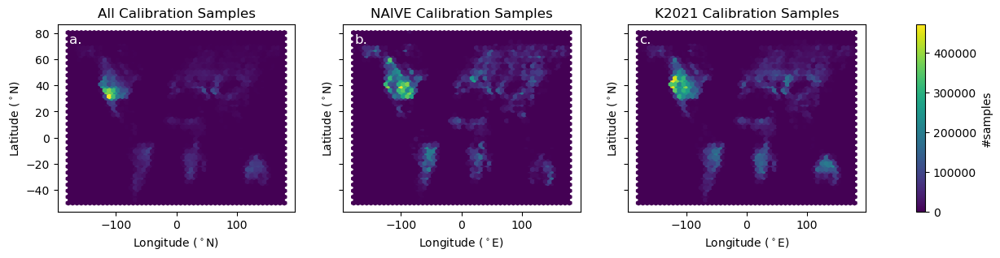

In [19]:
# RF - can you make this a bit more square and fix colorbar position
fig, ax = plt.subplots(ncols=3, nrows=1, figsize=(16,3), sharex=True, sharey=True)
cmap=cm.get_cmap('viridis')
hb = ax[0].hexbin(dfALL['Lon'],dfALL['Lat'], gridsize=(50),cmap=cmap)
hb = ax[1].hexbin(dfALLtrim['Lon'],dfALLtrim['Lat'], gridsize=(50),cmap=cmap)
hb = ax[2].hexbin(dfALLtrimKANG['Lon'], dfALLtrimKANG['Lat'], gridsize=(50),cmap=cmap)
ax[0].set_title("All Calibration Samples")
ax[0].set_ylabel("Latitude ($^\circ$N)")
ax[0].set_xlabel("Longitude ($^\circ$N)")
ax[0].text(0.05, 0.95, 'a.', transform=ax[0].transAxes, fontsize=12,verticalalignment='top',color='w')

ax[1].set_title("NAIVE Calibration Samples")
ax[1].set_ylabel("Latitude ($^\circ$N)")
ax[1].set_xlabel("Longitude ($^\circ$E)")
ax[1].text(0.05, 0.95, 'b.', transform=ax[1].transAxes, fontsize=12,verticalalignment='top',color='w')

ax[2].set_title("K2021 Calibration Samples")
ax[2].set_ylabel("Latitude ($^\circ$N)")
ax[2].set_xlabel("Longitude ($^\circ$E)")
ax[2].text(0.05, 0.95, 'c.', transform=ax[2].transAxes, fontsize=12,verticalalignment='top',color='w')

cb = fig.colorbar(hb, ax=ax)
cb.set_label('#samles')
cb.set_label('#samples')
plt.savefig('Figure1.png', bbox_inches='tight')
plt.show()

Figure 1.  Spatial density of (a) all calibration samples, (b) calibration samples after trimming for K2021 and, (c)  calibration samples after trimming for NAIVE.

### Figure 2.  Total size of the calibration databases for each method for each biome.  Also idnciated are the number of saturated samples in each database.  (Bar chart , y axis #samples, x-axis biome, each biome has 3 bars corresponding to each of NAIVE, K2021 and FTL and also indicates #saturated samples as a sub-bar.Figure 2.  Total size of the calibration databases for each method for each biome.  Also idnciated are the number of saturated samples in each database.  (Bar chart , y axis #samples, x-axis biome, each biome has 3 bars corresponding to each of NAIVE, K2021 and FTL and also indicates #saturated samples as a sub-bar.

### Figure 3.  Density contour plots of MODIS vs OLI red for NIR brf based on 10,000 rando sub-samples of (a,d) all samples, (c,e) K2021 trimmed samples and (e,f) NAIVE trimmed samples.  Dashed black line is 1:1 line.  Blue line is ordinary least squares regression fit.  Contours correspond to equal probability intervals.

In [ ]:
# kde plots of OLI vs MODIS bands for all and trimmed databases
# RF - add legend with 1:1 line, linear fit, SatFlag=0, SatFlag=1
# RF - why does sat flag = 1 hue have fewer contours?
fig, ax = plt.subplots(nrows=2,ncols=3, figsize=(12,6))
fig.tight_layout(w_pad=3,h_pad=3)

deciles = [0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0]
df = dfALL.sample(10000) / 10000
g = sns.kdeplot(ax=ax[0,0],data=df, x="red", y="redMODIS", hue='LUT_satFlag',palette="muted",levels=deciles,legend=False)
ax[0,0].set(xlabel='red OLI', ylabel='red MODIS')
r = LinearRegression().fit(np.array(df['red']).reshape(-1, 1) ,df['redMODIS'])
rscore=r.score(np.array(df['red']).reshape(-1, 1) ,df['redMODIS'])
slope = r.coef_[0]
offset = r.intercept_
textstr = '\n'.join((
    'a.',
    r'$r^2=%.2f$' % (rscore, ),
    r'$slope=%.2f$' % (slope, ),
    r'$offset=%.2f$' % (offset, )))
ax[0,0].set_xlim(0,0.5)
ax[0,0].set_ylim(0,0.5)
ax[0,0].set_box_aspect(1)
ax[0,0].plot([0,0.5],[offset,0.5*slope+offset],'b')
ax[0,0].plot([0,0.5],[0,0.5],':k')
ax[0,0].text(0.05, 0.975, textstr, transform=ax[0,0].transAxes, fontsize=10,verticalalignment='top',color='k')

g = sns.kdeplot(ax=ax[1,0],data=df, x="NIR", y="NIRMODIS", hue='LUT_satFlag',palette="muted",levels=deciles,legend=False)
ax[1,0].set(xlabel='NIR OLI', ylabel='NIR MODIS')
r = LinearRegression().fit(np.array(df['NIR']).reshape(-1, 1) ,df['NIRMODIS'])
rscore=r.score(np.array(df['NIR']).reshape(-1, 1) ,df['NIRMODIS'])
slope = r.coef_[0]
offset = r.intercept_
textstr = '\n'.join((
    'd.',
    r'$r^2=%.2f$' % (rscore, ),
    r'$slope=%.2f$' % (slope, ),
    r'$offset=%.2f$' % (offset, )))
ax[1,0].set_xlim(0,0.5)
ax[1,0].set_ylim(0,0.5)
ax[1,0].set_box_aspect(1)
ax[1,0].plot([0,0.5],[offset,0.5*slope+offset],'b')
ax[1,0].plot([0,0.5],[0,0.5],':k')
ax[1,0].text(0.05, 0.975, textstr, transform=ax[1,0].transAxes, fontsize=10,verticalalignment='top',color='k')


df = dfALLtrimKANG.sample(10000) / 10000
g = sns.kdeplot(ax=ax[0,1],data=df, x="red", y="redMODIS", hue='LUT_satFlag',palette="muted",levels=deciles,legend=False)
ax[0,1].set(xlabel='red OLI', ylabel='red MODIS')
r = LinearRegression().fit(np.array(df['red']).reshape(-1, 1) ,df['redMODIS'])
rscore=r.score(np.array(df['red']).reshape(-1, 1) ,df['redMODIS'])
slope = r.coef_[0]
offset = r.intercept_
textstr = '\n'.join((
    'b.',
    r'$r^2=%.2f$' % (rscore, ),
    r'$slope=%.2f$' % (slope, ),
    r'$offset=%.2f$' % (offset, )))
ax[0,1].set_xlim(0,0.5)
ax[0,1].set_ylim(0,0.5)
ax[0,1].set_box_aspect(1)
ax[0,1].plot([0,0.5],[offset,0.5*slope+offset],'b')
ax[0,1].plot([0,0.5],[0,0.5],':k')
ax[0,1].text(0.05, 0.975, textstr, transform=ax[0,1].transAxes, fontsize=10,verticalalignment='top',color='k')

g = sns.kdeplot(ax=ax[1,1],data=df, x="NIR", y="NIRMODIS", hue='LUT_satFlag',palette="muted",levels=deciles,legend=False)
ax[1,1].set(xlabel='NIR OLI', ylabel='NIR MODIS')
r = LinearRegression().fit(np.array(df['NIR']).reshape(-1, 1) ,df['NIRMODIS'])
rscore=r.score(np.array(df['NIR']).reshape(-1, 1) ,df['NIRMODIS'])
slope = r.coef_[0]
offset = r.intercept_
textstr = '\n'.join((
    'e.',
    r'$r^2=%.2f$' % (rscore, ),
    r'$slope=%.2f$' % (slope, ),
    r'$offset=%.2f$' % (offset, )))
ax[1,1].set_xlim(0,0.5)
ax[1,1].set_ylim(0,0.5)
ax[1,1].set_box_aspect(1)
ax[1,1].plot([0,0.5],[offset,0.5*slope+offset],'b')
ax[1,1].plot([0,0.5],[0,0.5],':k')
ax[1,1].text(0.05, 0.975, textstr, transform=ax[1,1].transAxes, fontsize=10,verticalalignment='top',color='k')



df = dfALLtrim.sample(10000) / 10000
g = sns.kdeplot(ax=ax[0,2],data=df, x="red", y="redMODIS", hue='LUT_satFlag',palette="muted",levels=deciles,legend=False)
ax[0,2].set(xlabel='red OLI', ylabel='red MODIS')
r = LinearRegression().fit(np.array(df['red']).reshape(-1, 1) ,df['redMODIS'])
rscore=r.score(np.array(df['red']).reshape(-1, 1) ,df['redMODIS'])
slope = r.coef_[0]
offset = r.intercept_
textstr = '\n'.join((
    'c.',
    r'$r^2=%.2f$' % (rscore, ),
    r'$slope=%.2f$' % (slope, ),
    r'$offset=%.2f$' % (offset, )))
ax[0,2].set_xlim(0,0.5)
ax[0,2].set_ylim(0,0.5)
ax[0,2].set_box_aspect(1)
ax[0,2].plot([0,0.5],[offset,0.5*slope+offset],'b')
ax[0,2].plot([0,0.5],[0,0.5],':k')
ax[0,2].text(0.05, 0.975, textstr, transform=ax[0,2].transAxes, fontsize=10,verticalalignment='top',color='k')

g = sns.kdeplot(ax=ax[1,2],data=df, x="NIR", y="NIRMODIS", hue='LUT_satFlag',palette="muted",levels=deciles,legend=False)
ax[1,2].set(xlabel='NIR OLI', ylabel='NIR MODIS')
r = LinearRegression().fit(np.array(df['NIR']).reshape(-1, 1) ,df['NIRMODIS'])
rscore=r.score(np.array(df['NIR']).reshape(-1, 1) ,df['NIRMODIS'])
slope = r.coef_[0]
offset = r.intercept_
textstr = '\n'.join((
    'f.',
    r'$r^2=%.2f$' % (rscore, ),
    r'$slope=%.2f$' % (slope, ),
    r'$offset=%.2f$' % (offset, )))
ax[1,2].set_xlim(0,0.5)
ax[1,2].set_ylim(0,0.5)
ax[1,2].set_box_aspect(1)
ax[1,2].plot([0,0.5],[offset,0.5*slope+offset],'b')
ax[1,2].plot([0,0.5],[0,0.5],':k')
ax[1,2].text(0.05, 0.975, textstr, transform=ax[1,2].transAxes, fontsize=10,verticalalignment='top',color='k')

plt.savefig('Figure2.png', bbox_inches='tight')


plt.show()

Figure 3.  Density contour plots of MODIS vs OLI red for NIR brf based on 10,000 rando sub-samples of (a,d) all samples, (c,e) K2021 trimmed samples and (e,f) NAIVE trimmed samples.  Dashed black line is 1:1 line.  Blue line is ordinary least squares regression fit.  Contours correspond to equal probability intervals.

### Figure 4.  Scatter plots of (a,b,c,) response variables and (d,e,f) selected regressor variables for each method (columns).  Local rensidy in regressor feature space relative to median local density indciated by hue.

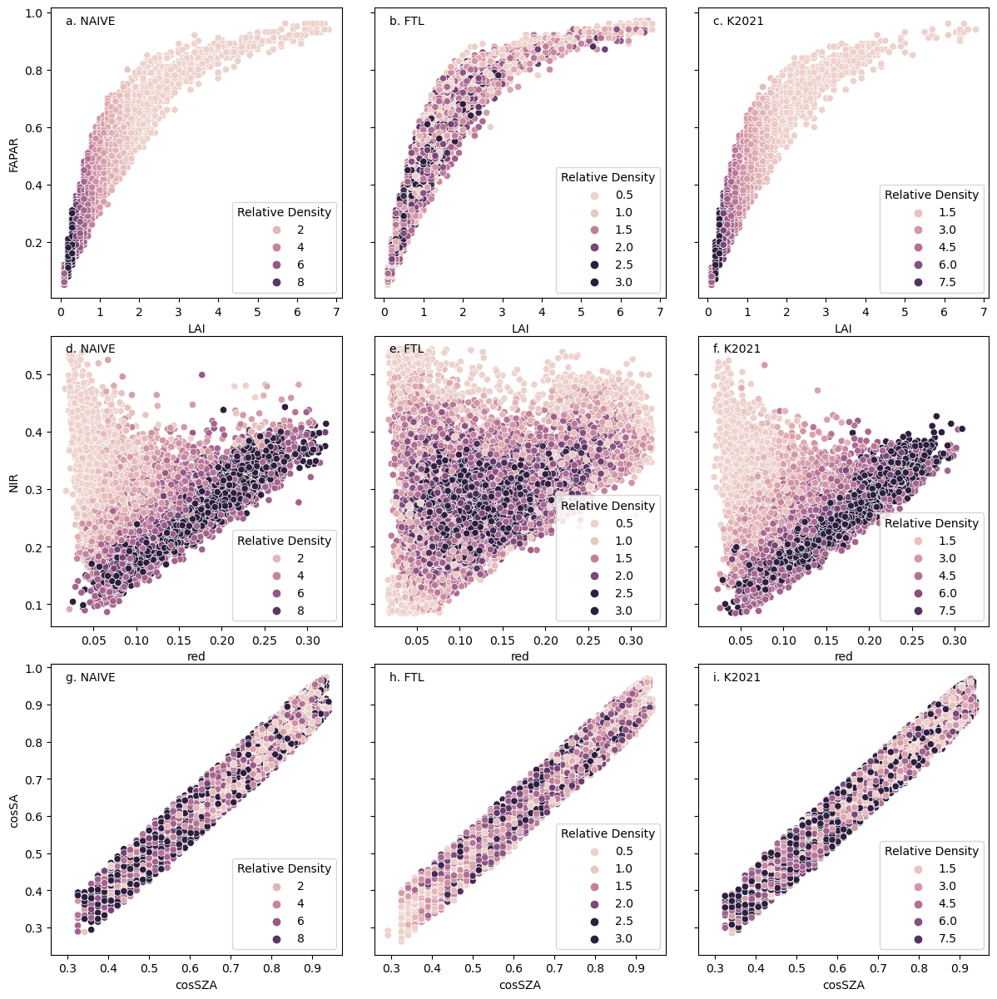

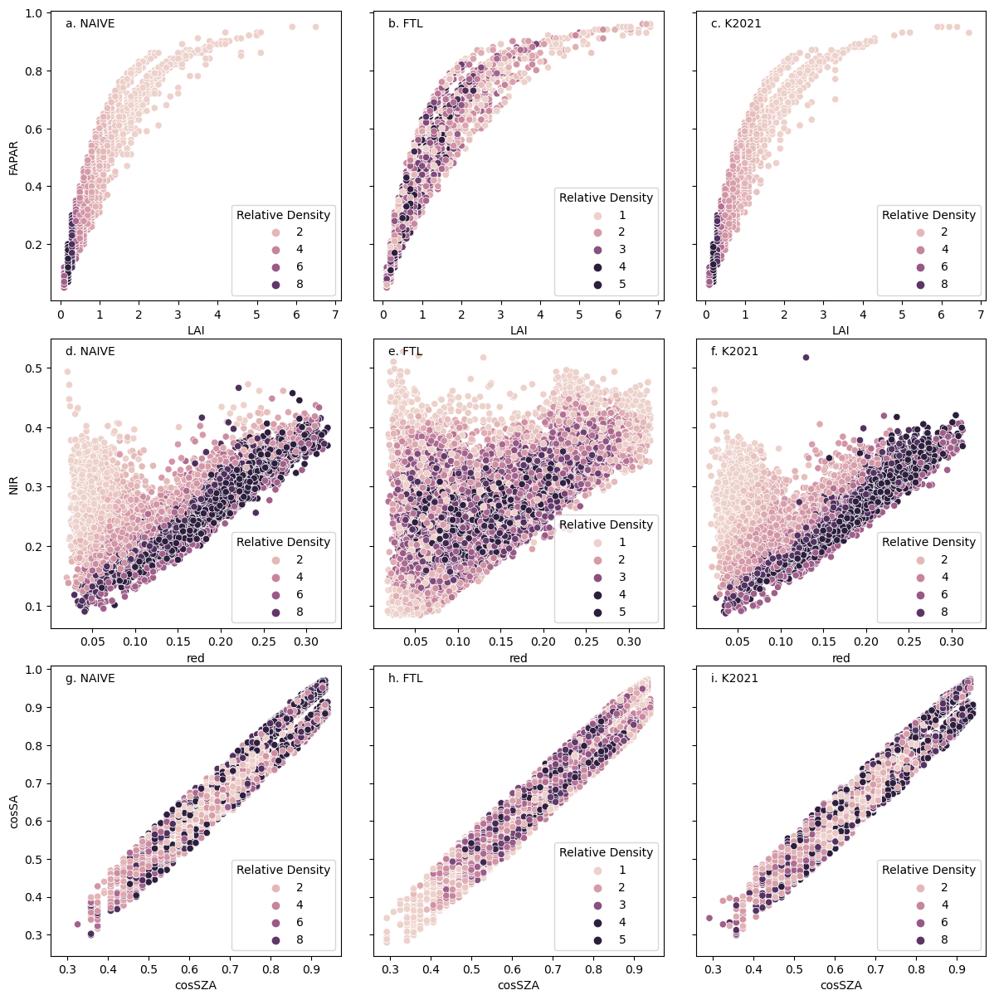

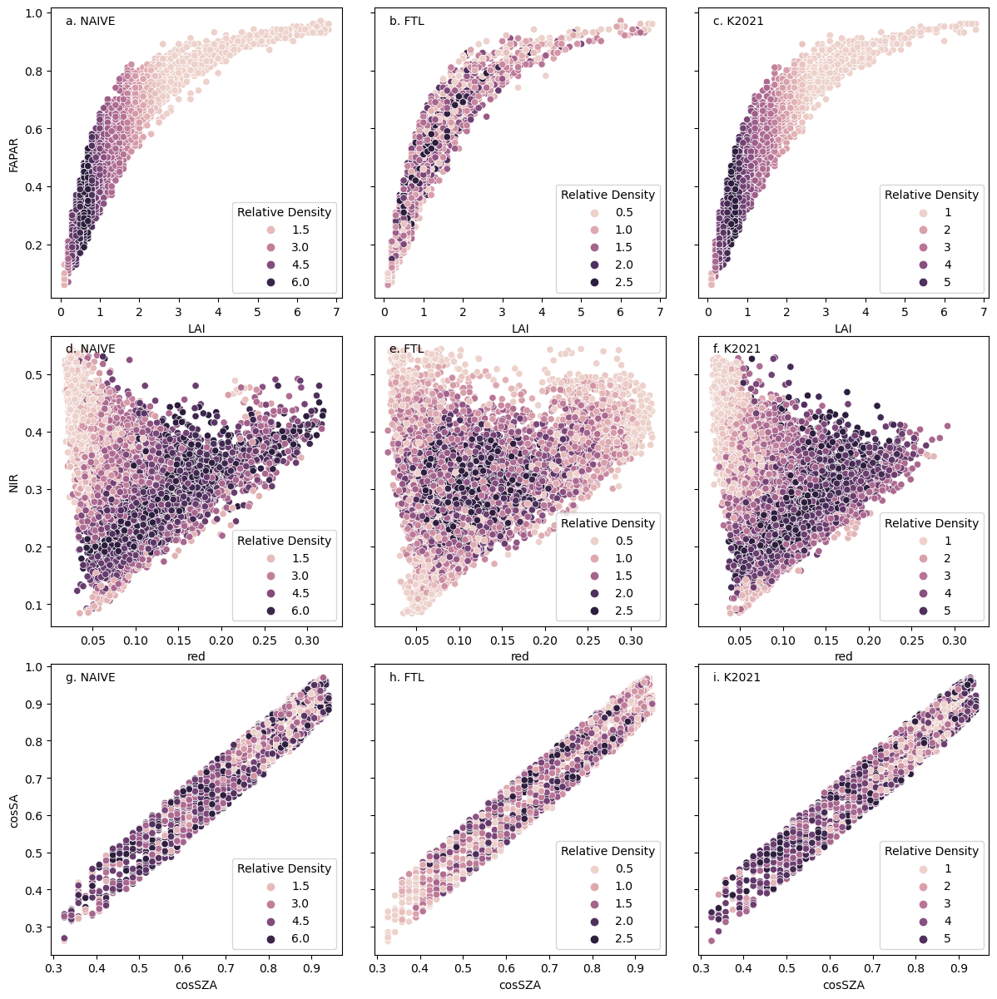

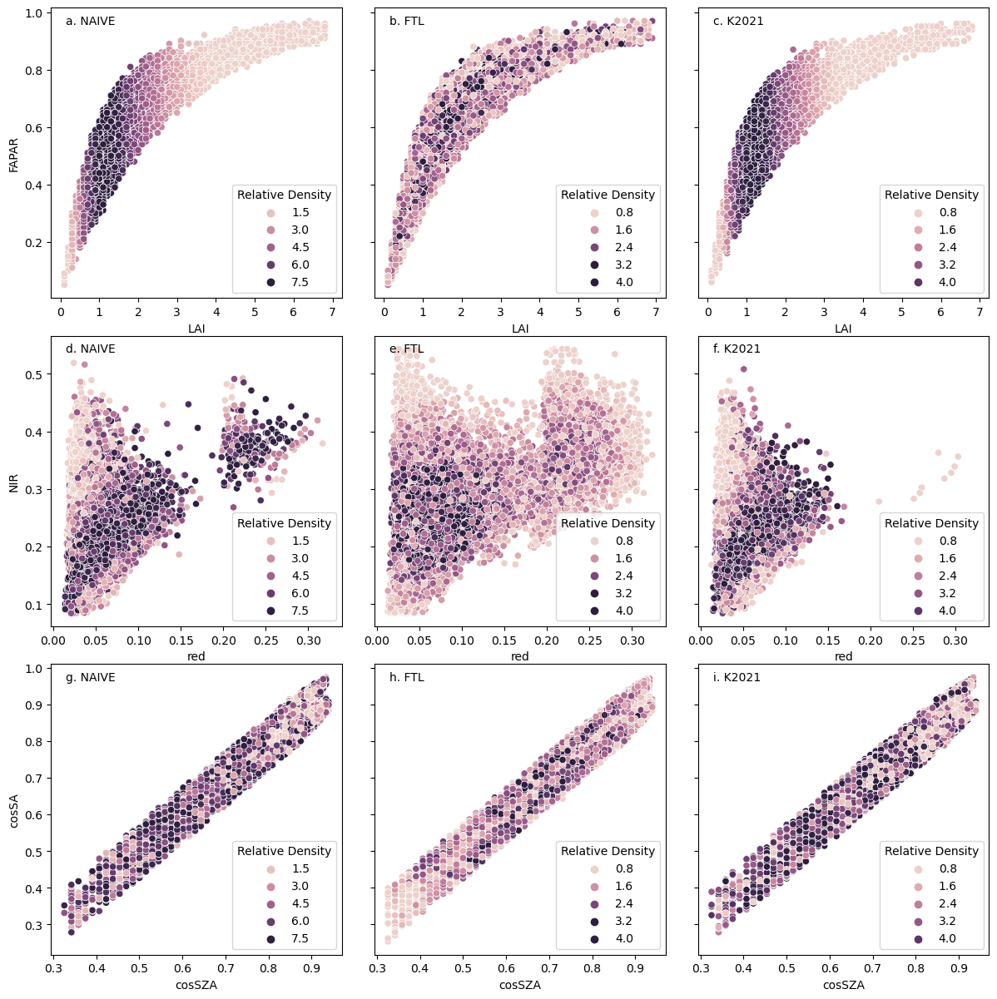

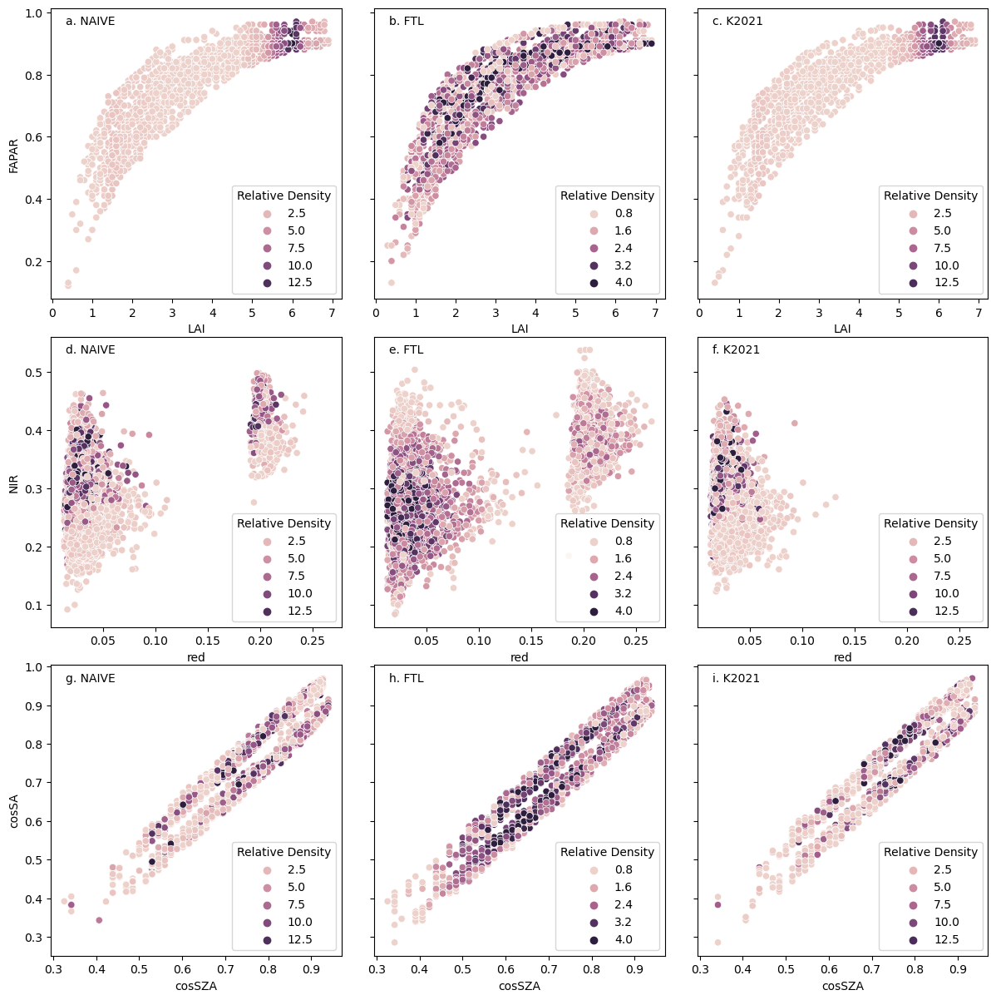

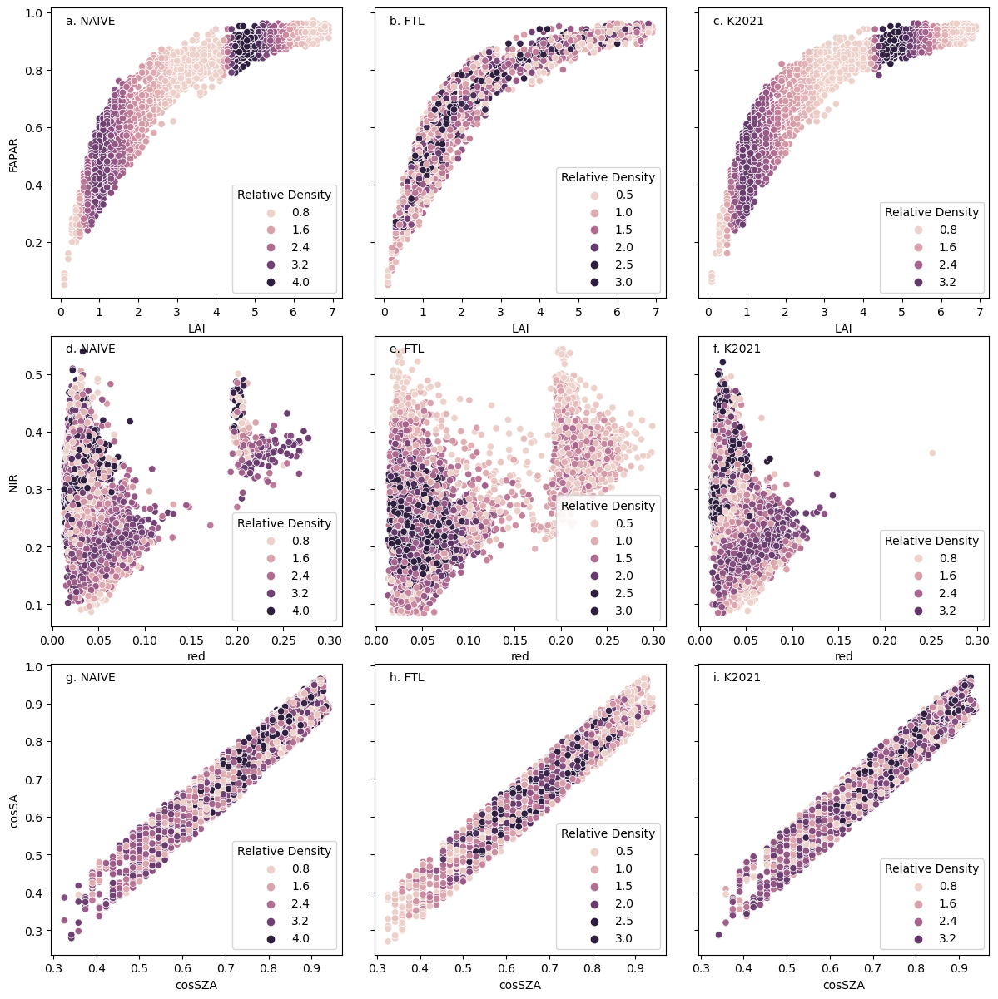

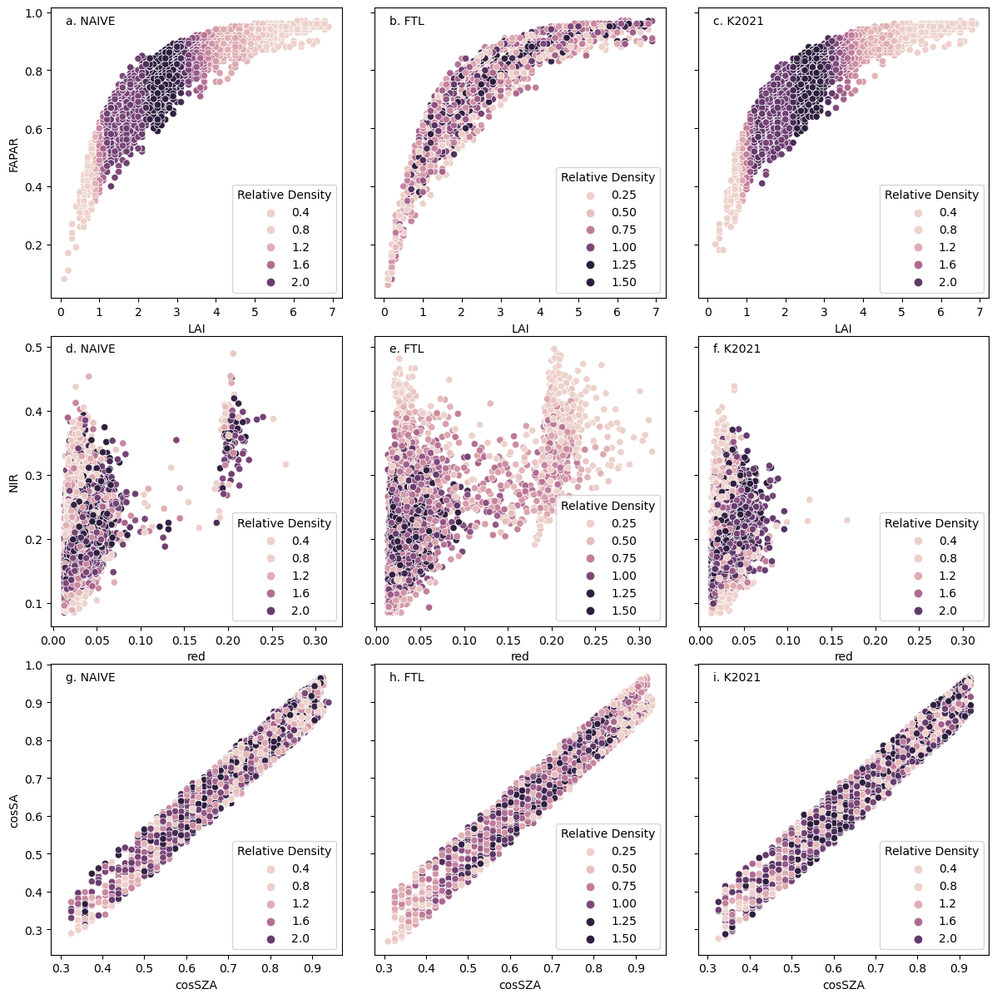

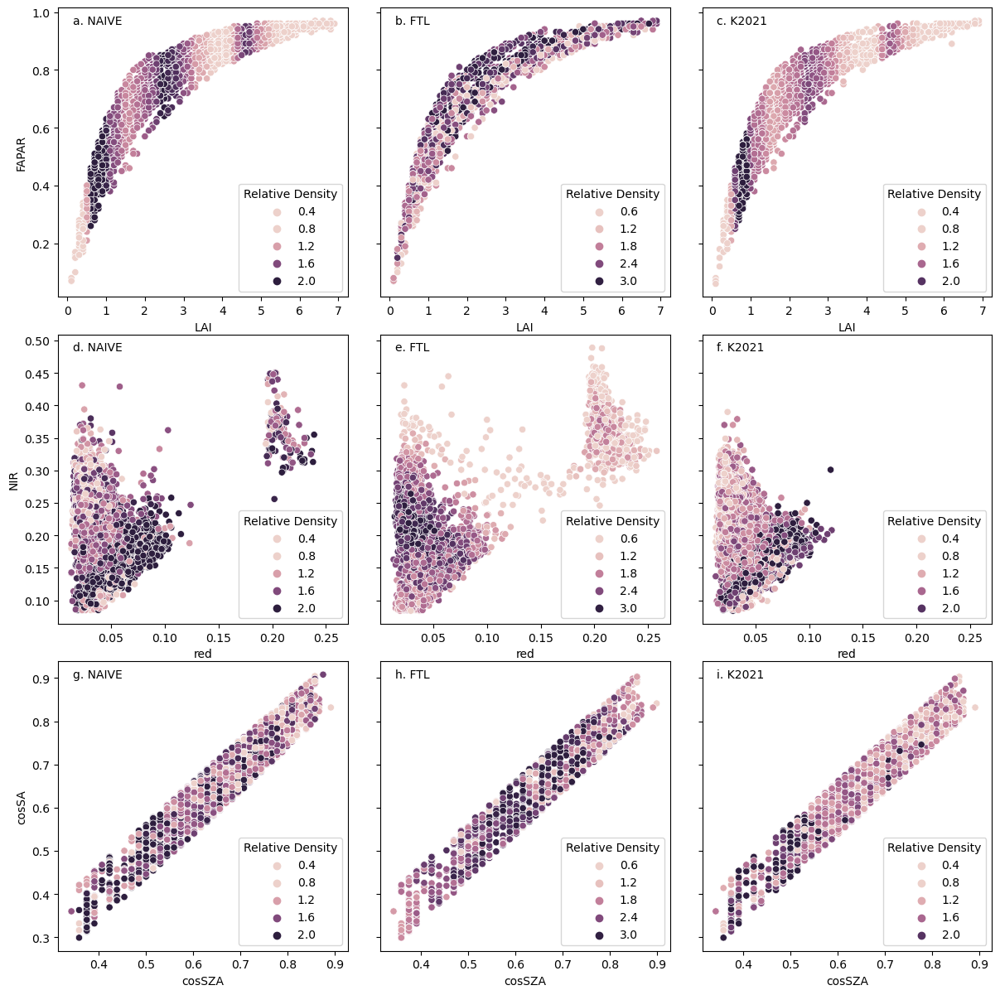

In [24]:
for biome in [1,2,3,4,5,6,7,8]:
    pairplotKDE(biome,'KDEbiome'+str(biome),nsam=10000)

### Figure 6.  Histograms of (a,b,c) LAI and (d,e,f) FAPAR per biome from calibration database samples for each method (columns).


(0.0, 1.4)

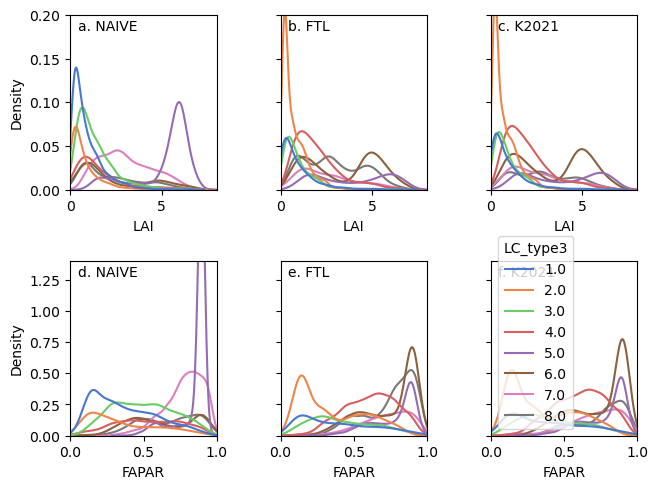

In [37]:
#histograms of LAI and fAPAR for each calibratiom database
fig,axs = plt.subplots(nrows=2,ncols=3,sharey='row')
fig.tight_layout(w_pad=3,h_pad=3)

#extract data for each calibration database for all biomes
df1 = pd.DataFrame()
df2 = pd.DataFrame()
df3 = pd.DataFrame()

for biome in [1,2,3,4,5,6,7,8]:
    df3 = pd.concat([df1,calbiomeDictLAI[biome]['DF'].sample(1000)])
    df1 = pd.concat([df2,calbiomeDictLAIFTL[biome]['DF'].sample(1000)])
    df2 = pd.concat([df3,calbiomeDictLAIKANG[biome]['DF'].sample(1000)])

#change scales of mapped variables
df1 = df1[['LAI','FAPAR','LC_type3']].divide([10,100,1])
df2 = df2[['LAI','FAPAR','LC_type3']].divide([10,100,1])
df3 = df3[['LAI','FAPAR','LC_type3']].divide([10,100,1])

sns.kdeplot(df1,ax=axs[0,0],x='LAI',hue="LC_type3",palette="muted",legend=False)
axs[0,0].text(0.05, 0.975, 'a. NAIVE', transform=axs[0,0].transAxes, fontsize=10,verticalalignment='top',color='k')
axs[0,0].set_xlim(0,8)
axs[0,0].set_ylim(0,0.2)

sns.kdeplot(df2,ax=axs[0,1],x='LAI',hue="LC_type3",palette="muted",legend=False)
axs[0,1].text(0.05, 0.975, 'b. FTL', transform=axs[0,1].transAxes, fontsize=10,verticalalignment='top',color='k')
axs[0,1].set_xlim(0,8)
axs[0,1].set_ylim(0,0.2)

sns.kdeplot(df3,ax=axs[0,2],x='LAI',hue="LC_type3",palette="muted",legend=False)
axs[0,2].text(0.05, 0.975, 'c. K2021', transform=axs[0,2].transAxes, fontsize=10,verticalalignment='top',color='k')
axs[0,2].set_xlim(0,8)
axs[0,2].set_ylim(0,0.2)

sns.kdeplot(df1,ax=axs[1,0],x='FAPAR',hue="LC_type3",palette="muted",legend=False)
axs[1,0].text(0.05, 0.975, 'd. NAIVE', transform=axs[1,0].transAxes, fontsize=10,verticalalignment='top',color='k')
axs[1,0].set_xlim(0,1)
axs[1,0].set_ylim(0,1.4)

sns.kdeplot(df2,ax=axs[1,1],x='FAPAR',hue="LC_type3",palette="muted",legend=False)
axs[1,1].text(0.05, 0.975, 'e. FTL', transform=axs[1,1].transAxes, fontsize=10,verticalalignment='top',color='k')
axs[1,1].set_xlim(0,1)
axs[1,1].set_ylim(0,1.4)

sns.kdeplot(df3,ax=axs[1,2],x='FAPAR',hue="LC_type3",palette="muted",legend=True)
axs[1,2].text(0.05, 0.975, 'f. K2021', transform=axs[1,2].transAxes, fontsize=10,verticalalignment='top',color='k')
axs[1,2].set_xlim(0,1)
axs[1,2].set_ylim(0,1.4)
# plt.savefig('Figure5.png', bbox_inches='tight')

Figure 6.  Cassidy please try and put the legend below the panels and name it "biome".  Please try to make the panels wider by reducing horizontal spacing.  Please use units of 1 on x axis for LAI


### Figure 7.  Kernel density contour plots of predicted versus MCD15 reference (a,b,c) LAI and (d,e,f) FAPAR for unsaturated (blue controus) and saturated (orange) valdiation samples for each method (columns).  ALso included are ordinary least squares line of best fit.

In [ ]:
method = 'NAIVE'
response= 'LAI'
df = pd.DataFrame()
# fig, axs = plt.subplots(nrows=1,ncols=1,sharey=True,figsize=(10,20))
for biome in [1,2,3,4,5,6,7,8]:
    df = pd.concat([df,valbiomeDictLAI[biome]['DF']])
    df[method+response+'residual']= df[method+response]-df[response]
    df[method+response+'residualdivstd'] = df[method+response+'residual'] / (df['stdLAI'].clip(lower=5))
    print(np.sqrt(np.average(np.power(np.array(df.loc[df[method+response]>4][method+response+'residual']),2))))

f0 = sns.displot(df,x=method+response,y=response,hue="LUT_satFlag",legend=False,kind='kde')
for ax in f0.axes:
    ax.plot([0,100],[0,100])
    ax.set_xlim([0,100])
    ax.set_ylim([0,100])  

Figure 7.  Cassid please make a 6 panel set of contour plots using subplot.  Use fixed contour levels corresponding to probabilities of 0.1 increments from 0.1 to 1.0.
I have provided you a sigle plot for NAIAVE LAI, you will need to tepeate for all 3 methods and two parameters,  Add r2, rmse, slope and offset of regression line.

### Figure 8. COmparions of Accuracy , Precision and UNcetrainty of each method for (a) LAI ad b(FAPAR) using 3rd order polynoial fit fo residuals for all biomes.  

Figure 8 . Cassidy, this should just be two panels (one LAI , onne fAPAR) where x axis is MCD15 LAI or FAPAR  and y axis is oredicted
versus MCD15 LAI or FAPAR.  Each panel should have 9 curves: 3 per method with one corresponding to accuracy, one to precision and one to uncertainty.  Accuracy is just  line fit to residuals.  Uncertaity is squrt of lie fit to squared residual  Precision is directly taken from Uncertainty^2 - Acccuracy^2.  You can use 3rd order polynomial fits


### Figure 9.  Kernel density controut plots of ratio of residual to MCD15 uncertainty for (a,b,c) LAI and (d,e,f) FAPAR for each method (columns) for validation database.


In [ ]:
Figure 9 - Cassidfy check my supplementary figures.  It should look like Fig 7 withput lines etc.

In [ ]:
### FIgure 10.  

## Data Exploration

Reading in all calibration data.

In [17]:
dfALL = pd.read_pickle('G:/cassidy/MODISLANDSAT/MODISLANDSATall.pkl')
dfALLtrim = pd.read_pickle('G:/cassidy/MODISLANDSAT/MODISLANDSATalltrim.pkl')
dfALLtrimKANG = pd.read_pickle('G:/cassidy/MODISLANDSAT/MODISLANDSATalltrimKANG.pkl')

FileNotFoundError: [Errno 2] No such file or directory: 'G:/cassidy/MODISLANDSAT/MODISLANDSATall.pkl'

## Supplementary Figures

In [ ]:
# Validation data for LAI and FAPAR
valbiomeDictLAI = pd.read_pickle('c:/users/rfernand/modisLandsat/code/valbiomeDictLAI.pkl')
valbiomeDictFAPAR = pd.read_pickle('c:/users/rfernand/modisLandsat/code/valbiomeDictFAPAR.pkl')

# Calibration data for LAI and FAPAR
calbiomeDictLAI = pd.read_pickle('c:/users/rfernand/modisLandsat/code/calbiomeDictLAI.pkl')
calbiomeDictFAPAR = pd.read_pickle('c:/users/rfernand/modisLandsat/code/calbiomeDictFAPAR.pkl')

# Kang's calibration data for LAI and FAPAR
calbiomeDictLAIKANG = pd.read_pickle('c:/users/rfernand/modisLandsat/code/calbiomeDictLAIKANG.pkl')
calbiomeDictFAPARKANG = pd.read_pickle('c:/users/rfernand/modisLandsat/code/calbiomeDictFAPARKANG.pkl')

# FTL  calibration data for LAI and FAPAR
calbiomeDictLAIFTL= pd.read_pickle('c:/users/rfernand/modisLandsat/code/calbiomeDictLAIFTL.pkl')
calbiomeDictFAPARFTL = pd.read_pickle('c:/users/rfernand/modisLandsat/code/calbiomeDictFAPARFTL.pkl')

# https://drive.google.com/drive/folders/1jVKwxWPlH7nYnpL1yJAUD2jFkXV3A1kf?usp=share_link

In [ ]:
method = 'NAIVE'
response= 'LAI'
df = pd.DataFrame()
# fig, axs = plt.subplots(nrows=1,ncols=1,sharey=True,figsize=(10,20))
for biome in [1,2,3,4,5,6,7,8]:
    df = pd.concat([df,valbiomeDictLAI[biome]['DF']])
    df[method+response+'residual']= df[method+response]-df[response]
    df[method+response+'residualdivstd'] = df[method+response+'residual'] / (df['stdLAI'].clip(lower=5))
    print(np.sqrt(np.average(np.power(np.array(df.loc[df[method+response]>4][method+response+'residual']),2))))

f0 = sns.displot(df,x=method+response,y=response,hue="LUT_satFlag",legend=False,col='LC_type3',kind='kde',col_wrap=4)
for ax in f0.axes:
    ax.plot([0,100],[0,100])
    ax.set_xlim([0,100])
    ax.set_ylim([0,100])    

# f1 = sns.displot(df,x=response,y=method+response+'residual',hue="LUT_satFlag",legend=False,col='LC_type3',kind='kde',col_wrap=4)
# for ax in f1.axes:
#     ax.plot([0,100],[0,0])
#     ax.set_xlim([0,100])
#     ax.set_ylim([-40,40])  
    
# f2 = sns.displot(df,x=response,y=method+response+'residualdivstd',hue="LUT_satFlag",legend=False,col='LC_type3',kind='kde',col_wrap=4)
# for ax in f2.axes:
#     ax.plot([0,100],[0,0])
#     ax.set_xlim([0,100])
#     ax.set_ylim([-10,10])  

In [ ]:
method = 'KANG'
response= 'LAI'
df = pd.DataFrame()
# fig, axs = plt.subplots(nrows=1,ncols=1,sharey=True,figsize=(10,20))
for biome in [1,2,3,4,5,6,7,8]:
    df = pd.concat([df,valbiomeDictLAI[biome]['DF']])
    df[method+response+'residual']= df[method+response]-df[response]
    df[method+response+'residualdivstd'] = df[method+response+'residual'] / (df['stdLAI'].clip(lower=5))
    print(np.sqrt(np.average(np.power(np.array(df.loc[df[method+response]>4][method+response+'residual']),2))))

f0 = sns.displot(df,x=method+response,y=response,hue="LUT_satFlag",legend=False,col='LC_type3',kind='kde',col_wrap=4)
for ax in f0.axes:
    ax.plot([0,100],[0,100])
    ax.set_xlim([0,100])
    ax.set_ylim([0,100])    

# f1 = sns.displot(df,x=response,y=method+response+'residual',hue="LUT_satFlag",legend=False,col='LC_type3',kind='kde',col_wrap=4)
# for ax in f1.axes:
#     ax.plot([0,100],[0,0])
#     ax.set_xlim([0,100])
#     ax.set_ylim([-40,40])  
    
# f2 = sns.displot(df,x=response,y=method+response+'residualdivstd',hue="LUT_satFlag",legend=False,col='LC_type3',kind='kde',col_wrap=4)
# for ax in f2.axes:
#     ax.plot([0,100],[0,0])
#     ax.set_xlim([0,100])
#     ax.set_ylim([-10,10])  

In [ ]:
method = 'FTL'
response= 'LAI'
# df = pd.DataFrame()
# # fig, axs = plt.subplots(nrows=1,ncols=1,sharey=True,figsize=(10,20))
# for biome in [1,2,3,4,5,6,7,8]:
#     df = pd.concat([df,valbiomeDictLAI[biome]['DF']])
#     df[method+response+'residual']= df[method+response]-df[response]

#     df[method+response+'residualdivstd'] = df[method+response+'residual'] / (df['stdLAI'].clip(lower=5))
#     print(np.sqrt(np.average(np.power(np.array(df.loc[df[method+response]>4][method+response+'residual']),2))))

# f0 = sns.displot(df,x=method+response,y=response,hue="LUT_satFlag",legend=False,col='LC_type3',kind='kde',col_wrap=4)
# for ax in f0.axes:
#     ax.plot([0,100],[0,100])
#     ax.set_xlim([0,100])
#     ax.set_ylim([0,100])    


f1 = sns.displot(df,x=response,y=method+response+'residual',hue="LUT_satFlag",legend=False,col='LC_type3',kind='kde',col_wrap=4)
for ax in f1.axes:
    ax.plot([0,100],[0,0])
    ax.set_xlim([0,100])
    ax.set_ylim([-40,40])  
    
# f2 = sns.displot(df,x=response,y=method+response+'residualdivstd',hue="LUT_satFlag",legend=False,col='LC_type3',kind='kde',col_wrap=4)
# for ax in f2.axes:
#     ax.plot([0,100],[0,0])
#     ax.set_xlim([0,100])
#     ax.set_ylim([-10,10])  

### Maps of samples

Figure S1. Spatial density of LAI sampling distributons.

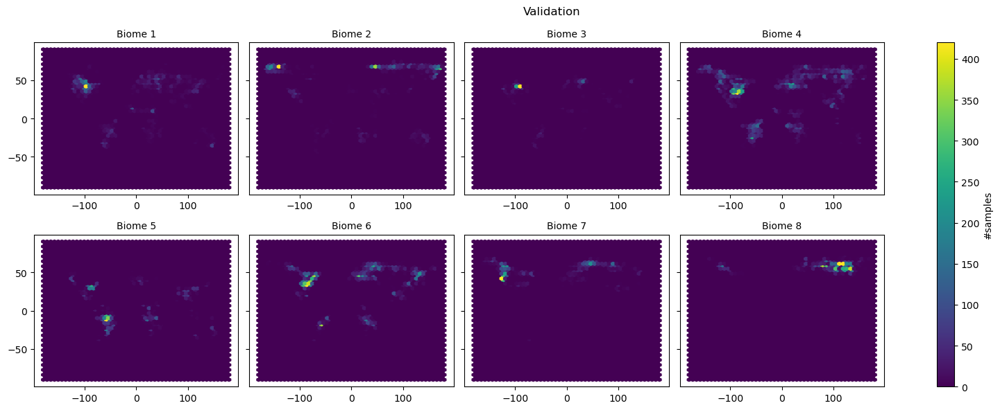

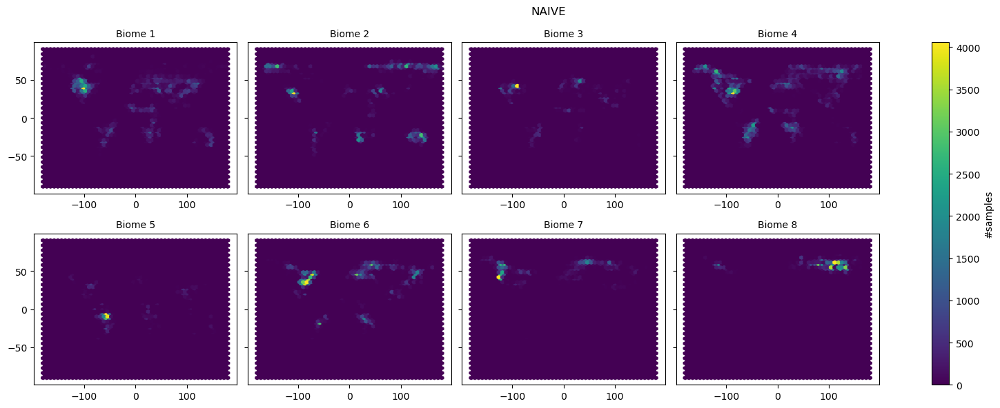

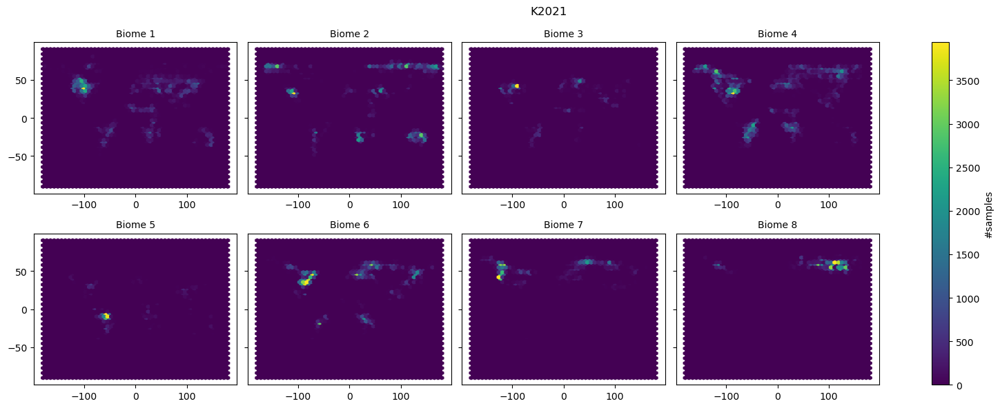

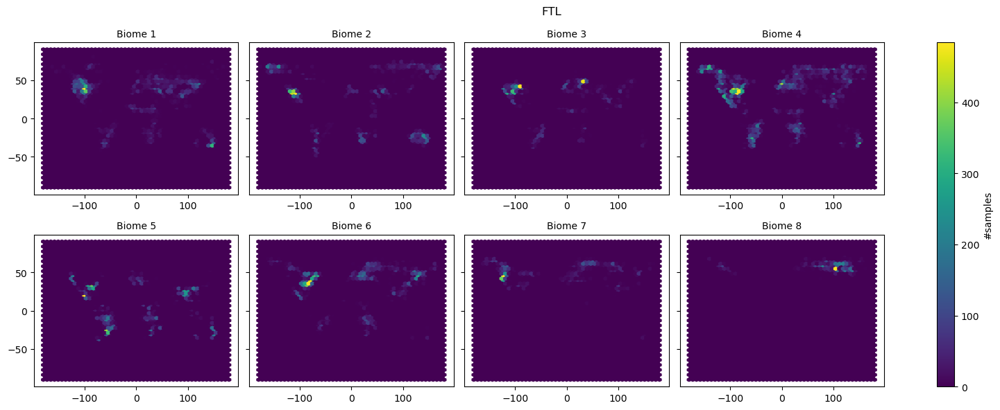

In [30]:
plotMaps(valbiomeDictLAI,'Validation')
plotMaps(calbiomeDictLAI,'NAIVE')
plotMaps(calbiomeDictLAIKANG,'K2021')
plotMaps(calbiomeDictLAIFTL,'FTL')

Figure S2. Spatial density of FAPAR sampling distributons.

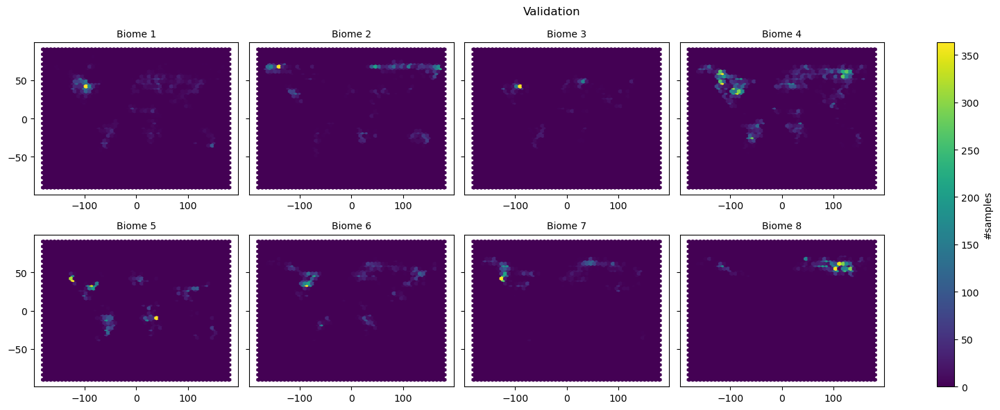

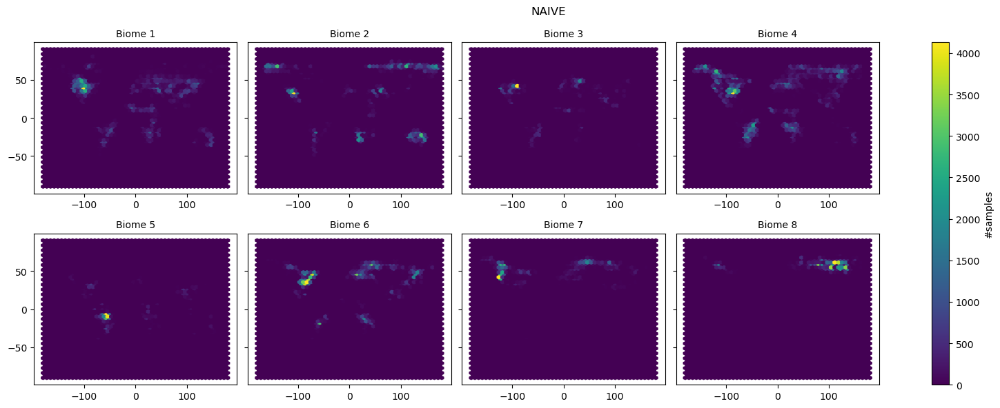

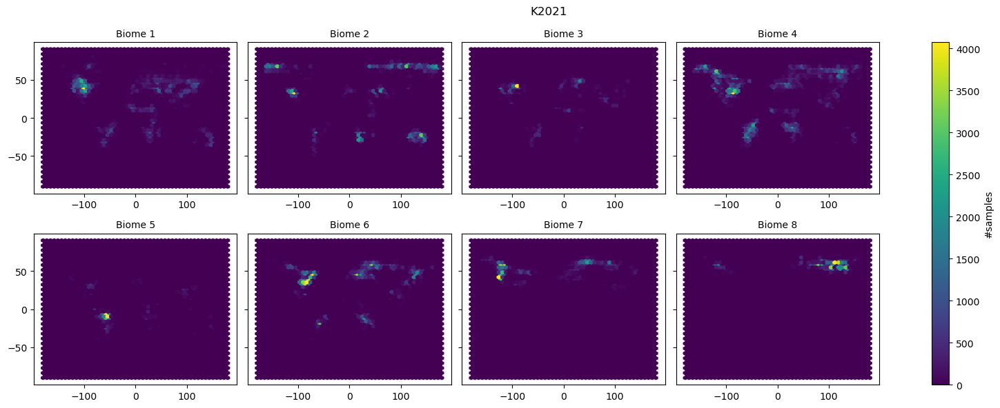

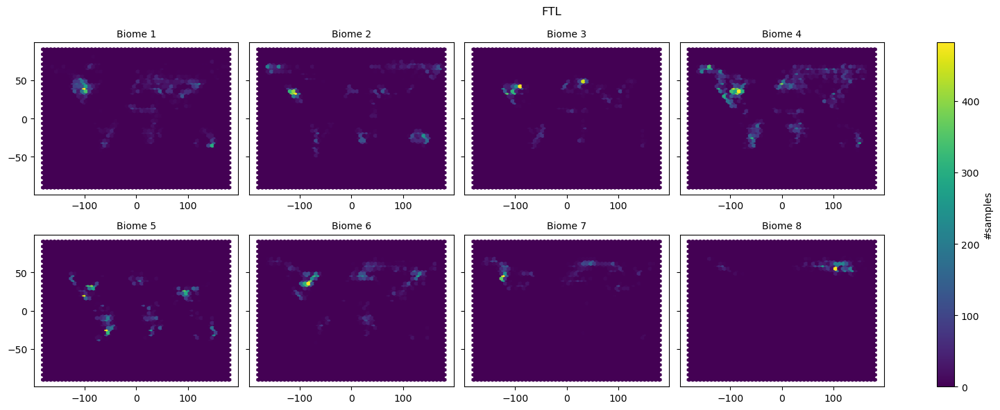

In [32]:
plotMaps(valbiomeDictFAPAR,'Validation')
plotMaps(calbiomeDictFAPAR,'NAIVE')
plotMaps(calbiomeDictFAPARKANG,'K2021')
plotMaps(calbiomeDictFAPARFTL,'FTL')

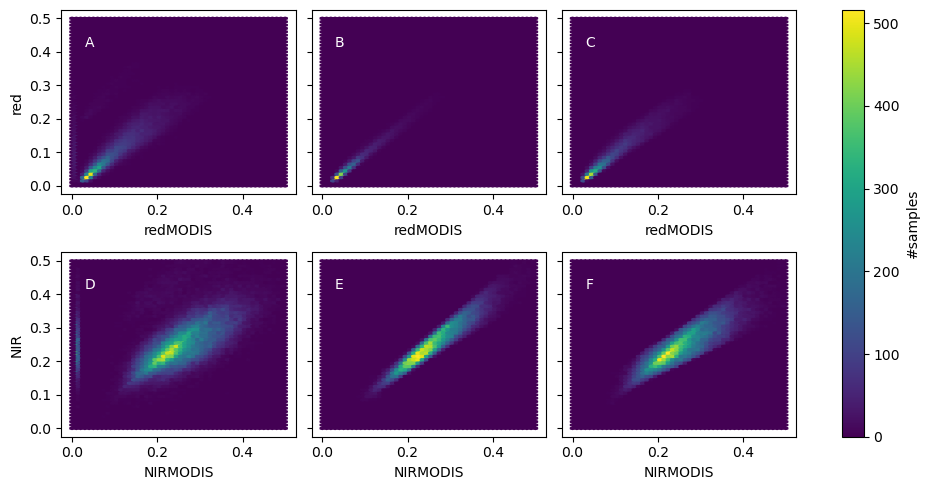

In [8]:
fig, axs = plt.subplots(nrows=2,ncols=3,sharey=True,figsize=(10,5))
dfA = dfALL.sample(100000) / 10000
axs[0,0].hexbin(dfA['redMODIS'],dfA['red'], gridsize=(50,50), extent=(0,0.5,0,0.5))
axs[0,0].set(xlabel='redMODIS', ylabel='red')
axs[1,0].hexbin(dfA['NIRMODIS'],dfA['NIR'], gridsize=(50,50), extent=(0,0.5,0,0.5))
axs[1,0].set(xlabel='NIRMODIS', ylabel='NIR')

dfT = dfALLtrim.sample(100000) / 10000
axs[0,1].hexbin(dfT['redMODIS'],dfT['red'], gridsize=(50,50), extent=(0,0.5,0,0.5))
axs[0,1].set(xlabel='redMODIS')
hb=axs[1,1].hexbin(dfT['NIRMODIS'],dfT['NIR'], gridsize=(50,50), extent=(0,0.5,0,0.5))
axs[1,1].set(xlabel='NIRMODIS')

dfK = dfALLtrimKANG.sample(100000) / 10000
axs[0,2].hexbin(dfK['redMODIS'],dfK['red'], gridsize=(50,50), extent=(0,0.5,0,0.5))
axs[0,2].set(xlabel='redMODIS')
hb=axs[1,2].hexbin(dfK['NIRMODIS'],dfK['NIR'], gridsize=(50,50), extent=(0,0.5,0,0.5))
axs[1,2].set(xlabel='NIRMODIS')

#Add colorbar
fig.tight_layout()
cb = fig.colorbar(hb, ax=axs)
cb.set_label('#samples')

#Add labels
axs[0,0].text(0.1, 0.8, 'A', size=10, color='white', transform=axs[0,0].transAxes)
axs[1,0].text(0.1, 0.8, 'D', size=10, color='white', transform=axs[1,0].transAxes)
axs[0,1].text(0.1, 0.8, 'B', size=10, color='white', transform=axs[0,1].transAxes)
axs[1,1].text(0.1, 0.8, 'E', size=10, color='white', transform=axs[1,1].transAxes)
axs[0,2].text(0.1, 0.8, 'C', size=10, color='white', transform=axs[0,2].transAxes)
axs[1,2].text(0.1, 0.8, 'F', size=10, color='white', transform=axs[1,2].transAxes)

plt.show()

Pairplots of sampled respose values by biome

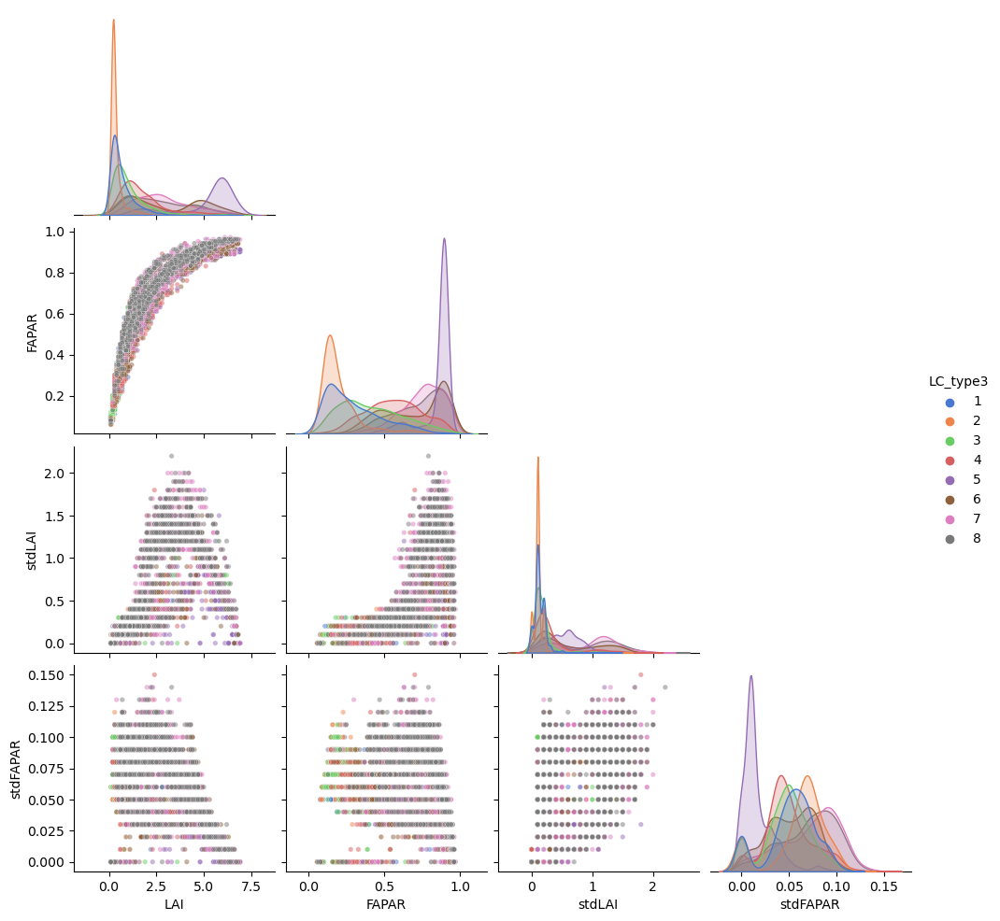

In [9]:
dfScaling = pd.DataFrame([[10., 100.,10.,100.,1]], columns=['LAI','FAPAR','stdLAI','stdFAPAR','LC_type3'])
dfPlot = dfALL.loc[dfALL['LC_type3']<9][['LAI','FAPAR','stdLAI','stdFAPAR','LC_type3']].groupby('LC_type3').sample(1000).div(dfScaling.iloc[0])
dfPlot['LC_type3'] = dfPlot['LC_type3'].astype(int)
pairplot = sns.pairplot(dfPlot,hue='LC_type3',palette='muted',plot_kws={"s": 15,'alpha':0.5},corner=True)
#pairplot.fig.savefig("Figure2.png", bbox_inches='tight') 

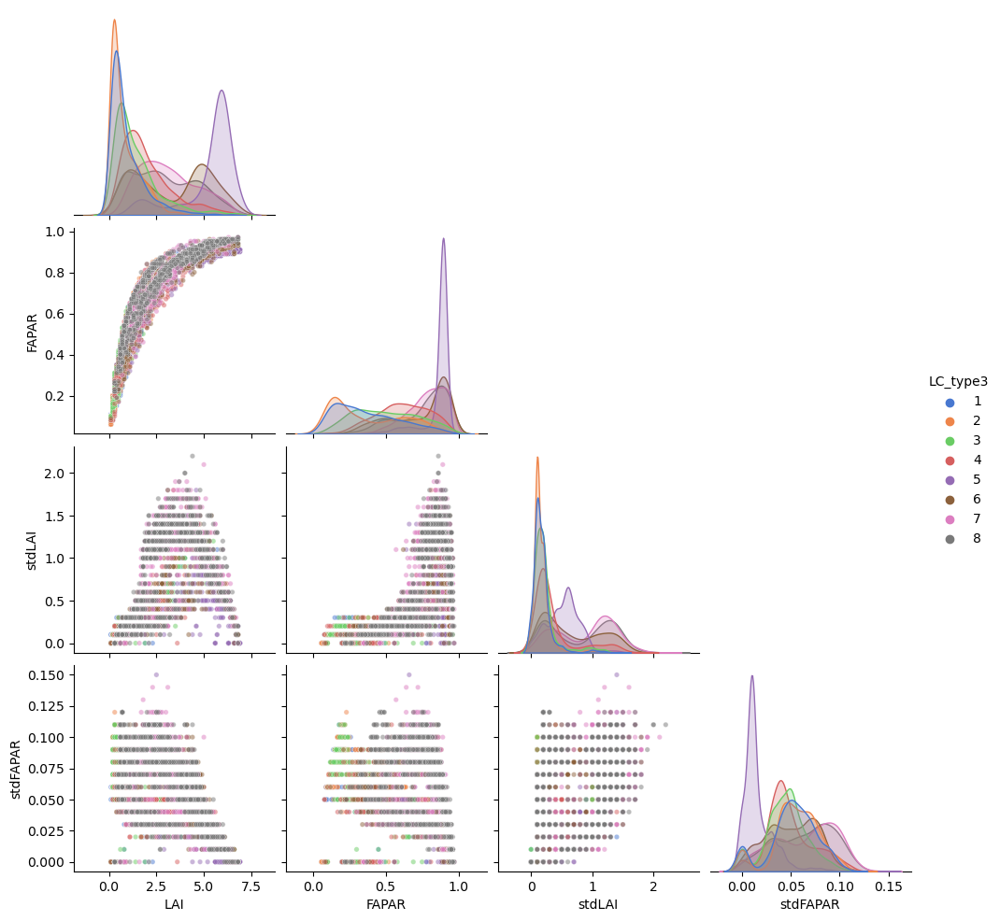

In [10]:
dfScaling = pd.DataFrame([[10., 100.,10.,100.,1]], columns=['LAI','FAPAR','stdLAI','stdFAPAR','LC_type3'])
dfPlot = dfALLtrim.loc[dfALLtrim['LC_type3']<9][['LAI','FAPAR','stdLAI','stdFAPAR','LC_type3']].groupby('LC_type3').sample(1000).div(dfScaling.iloc[0])
dfPlot['LC_type3'] = dfPlot['LC_type3'].astype(int)
pairplot = sns.pairplot(dfPlot,hue='LC_type3',palette='muted',plot_kws={"s": 15,'alpha':0.5},corner=True)
#pairplot.fig.savefig("Figure2.png", bbox_inches='tight') 

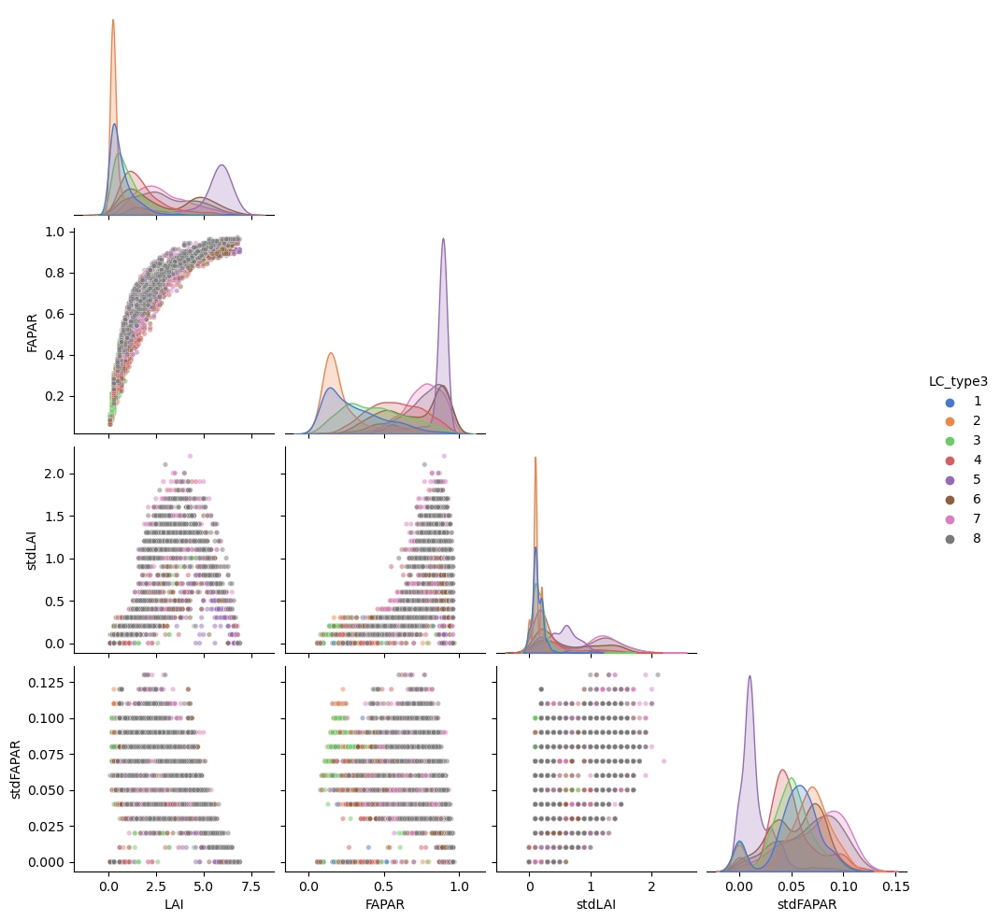

In [11]:
dfScaling = pd.DataFrame([[10., 100.,10.,100.,1]], columns=['LAI','FAPAR','stdLAI','stdFAPAR','LC_type3'])
dfPlot = dfALLtrimKANG.loc[dfALLtrimKANG['LC_type3']<9][['LAI','FAPAR','stdLAI','stdFAPAR','LC_type3']].groupby('LC_type3').sample(1000).div(dfScaling.iloc[0])
dfPlot['LC_type3'] = dfPlot['LC_type3'].astype(int)
pairplot = sns.pairplot(dfPlot,hue='LC_type3',palette='muted',plot_kws={"s": 15,'alpha':0.5},corner=True)
#pairplot.fig.savefig("Figure2.png", bbox_inches='tight') 

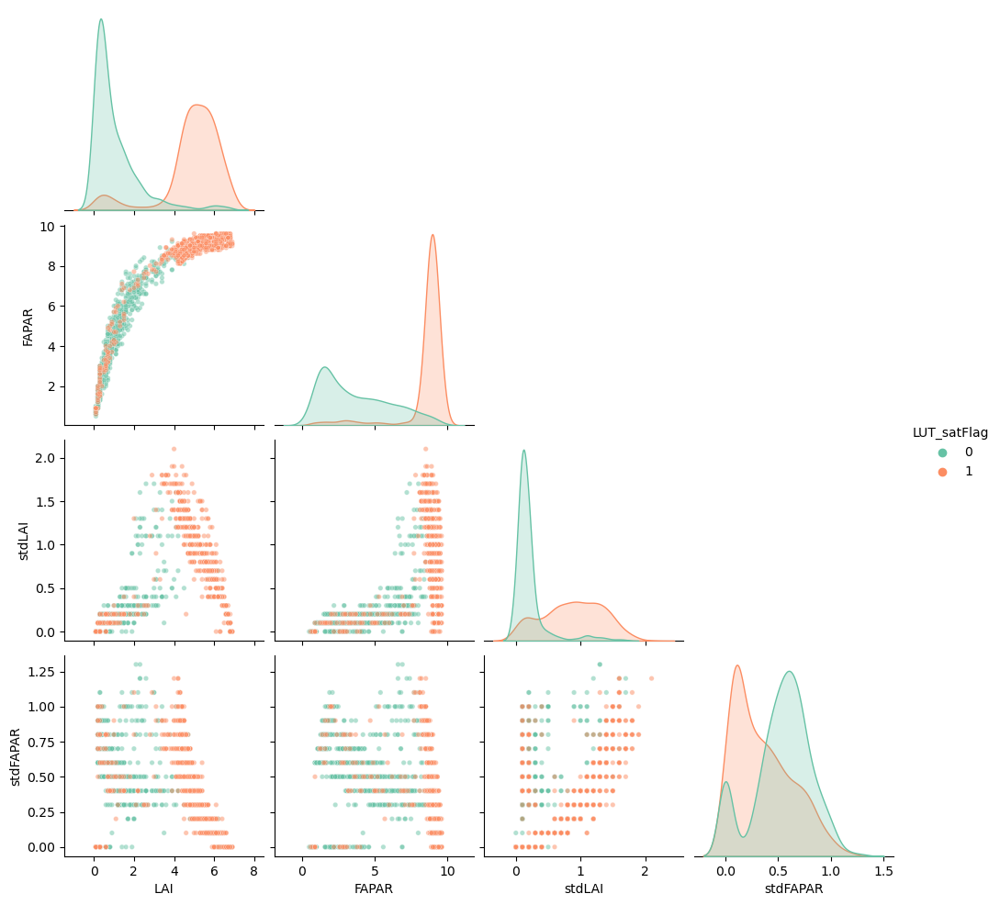

In [12]:
dfScaling = pd.DataFrame([[10., 10.,10.,10.,1]], columns=['LAI','FAPAR','stdLAI','stdFAPAR','LUT_satFlag'])
dfPlot = dfALL.loc[dfALL['LC_type3']<9][['LAI','FAPAR','stdLAI','stdFAPAR','LUT_satFlag']].groupby('LUT_satFlag').sample(1000).div(dfScaling.iloc[0])
dfPlot['LUT_satFlag'] = dfPlot['LUT_satFlag'].astype(int)
pairplot = sns.pairplot(dfPlot,hue='LUT_satFlag',palette='Set2',plot_kws={"s": 15,'alpha':0.5},corner=True)
#pairplot.fig.savefig("Figure3.png", bbox_inches='tight') 

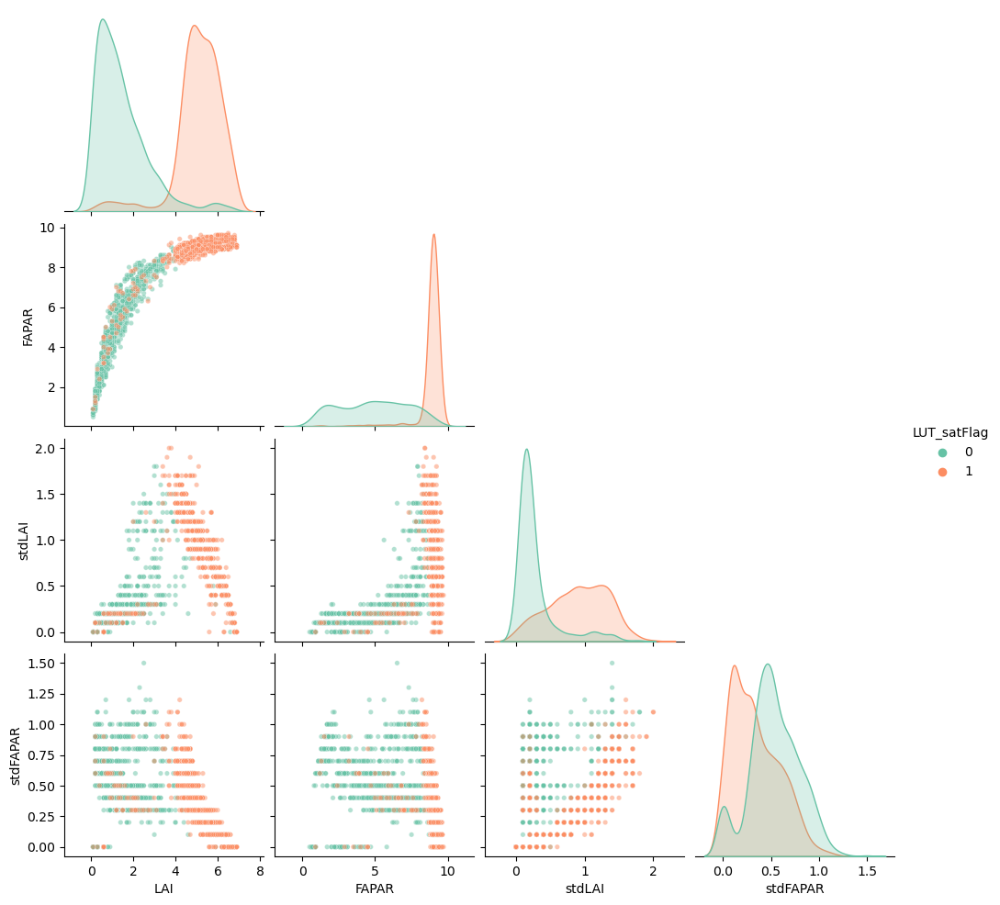

In [13]:
dfScaling = pd.DataFrame([[10., 10.,10.,10.,1]], columns=['LAI','FAPAR','stdLAI','stdFAPAR','LUT_satFlag'])
dfPlot = dfALLtrim.loc[dfALLtrim['LC_type3']<9][['LAI','FAPAR','stdLAI','stdFAPAR','LUT_satFlag']].groupby('LUT_satFlag').sample(1000).div(dfScaling.iloc[0])
dfPlot['LUT_satFlag'] = dfPlot['LUT_satFlag'].astype(int)
pairplot = sns.pairplot(dfPlot,hue='LUT_satFlag',palette='Set2',plot_kws={"s": 15,'alpha':0.5},corner=True)
#pairplot.fig.savefig("Figure3.png", bbox_inches='tight') 

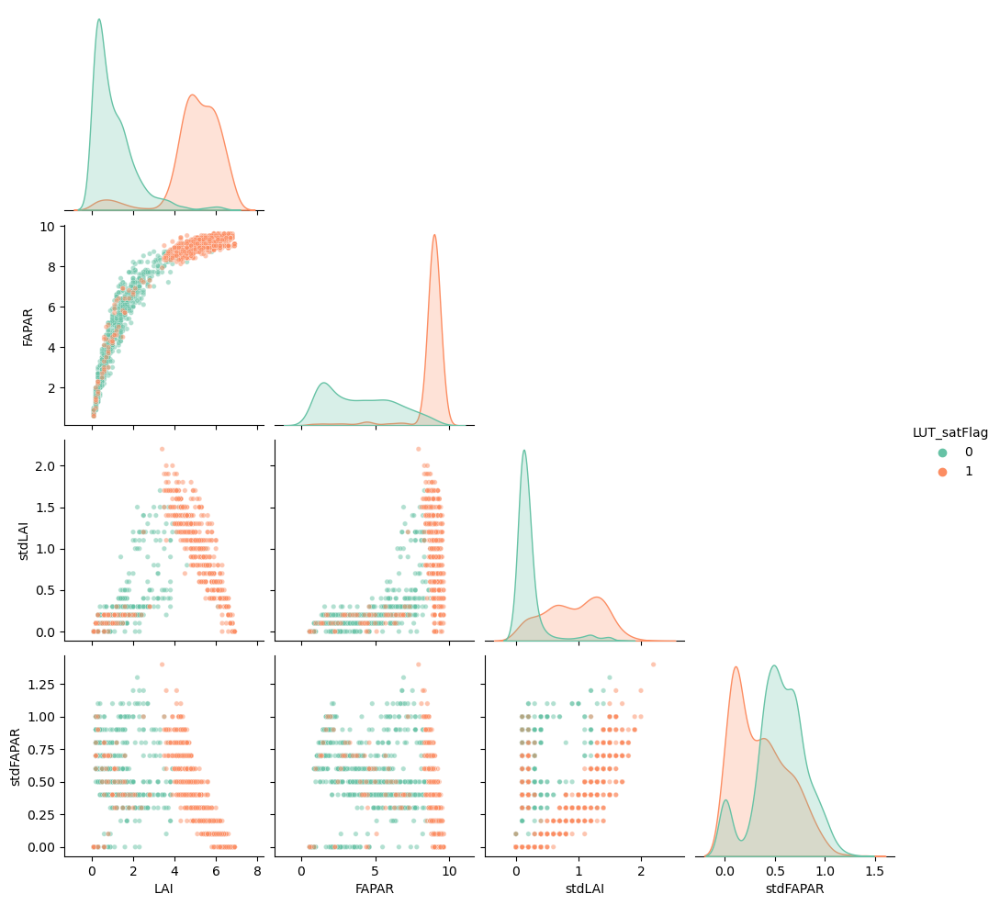

In [14]:
dfScaling = pd.DataFrame([[10., 10.,10.,10.,1]], columns=['LAI','FAPAR','stdLAI','stdFAPAR','LUT_satFlag'])
dfPlot = dfALLtrimKANG.loc[dfALLtrimKANG['LC_type3']<9][['LAI','FAPAR','stdLAI','stdFAPAR','LUT_satFlag']].groupby('LUT_satFlag').sample(1000).div(dfScaling.iloc[0])
dfPlot['LUT_satFlag'] = dfPlot['LUT_satFlag'].astype(int)
pairplot = sns.pairplot(dfPlot,hue='LUT_satFlag',palette='Set2',plot_kws={"s": 15,'alpha':0.5},corner=True)
#pairplot.fig.savefig("Figure3.png", bbox_inches='tight') 

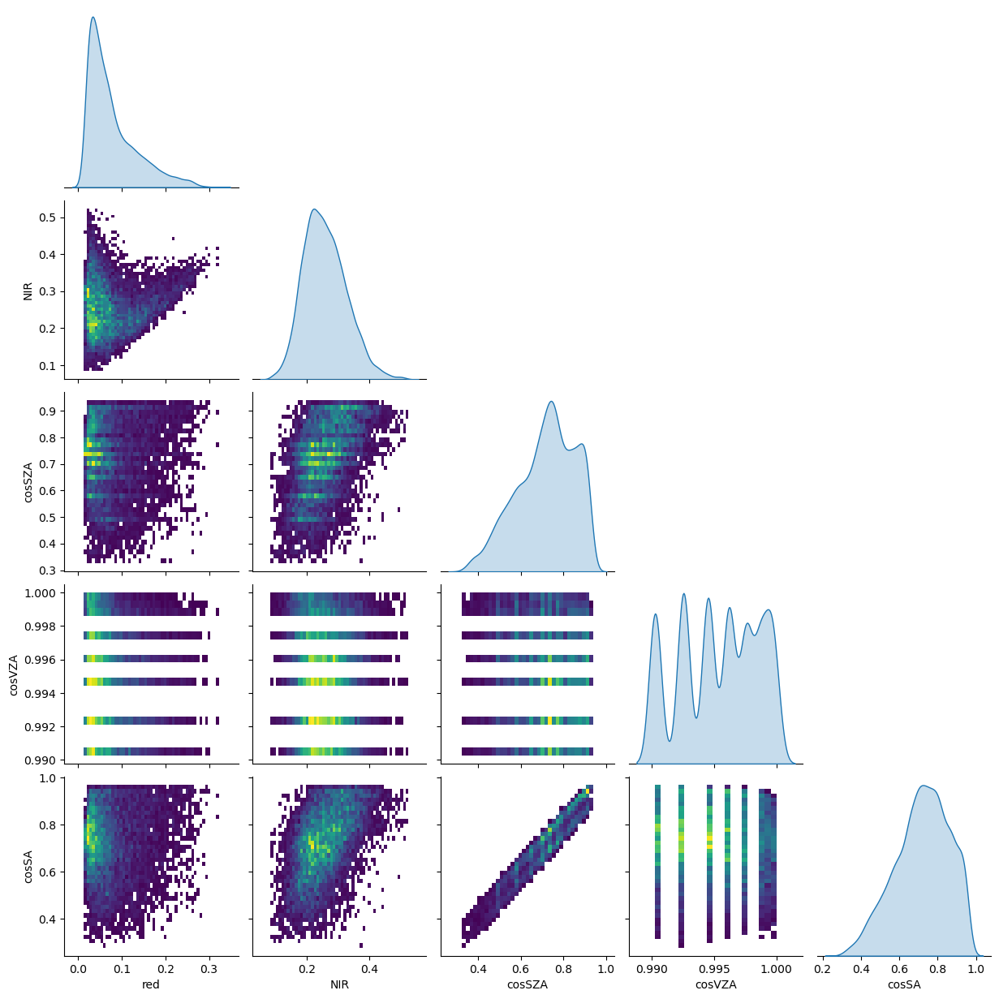

In [15]:
pairplot = sns.pairplot(dfALLtrim.loc[dfALLtrim['LC_type3']<9][['red','NIR','cosSZA','cosVZA','cosSA']].sample(10000).divide(10000),plot_kws={'cmap':'viridis'},kind='hist',diag_kind='kde',corner=True)
#pairplot.fig.savefig("Figure4.png", bbox_inches='tight') 

Graphs for dfALL

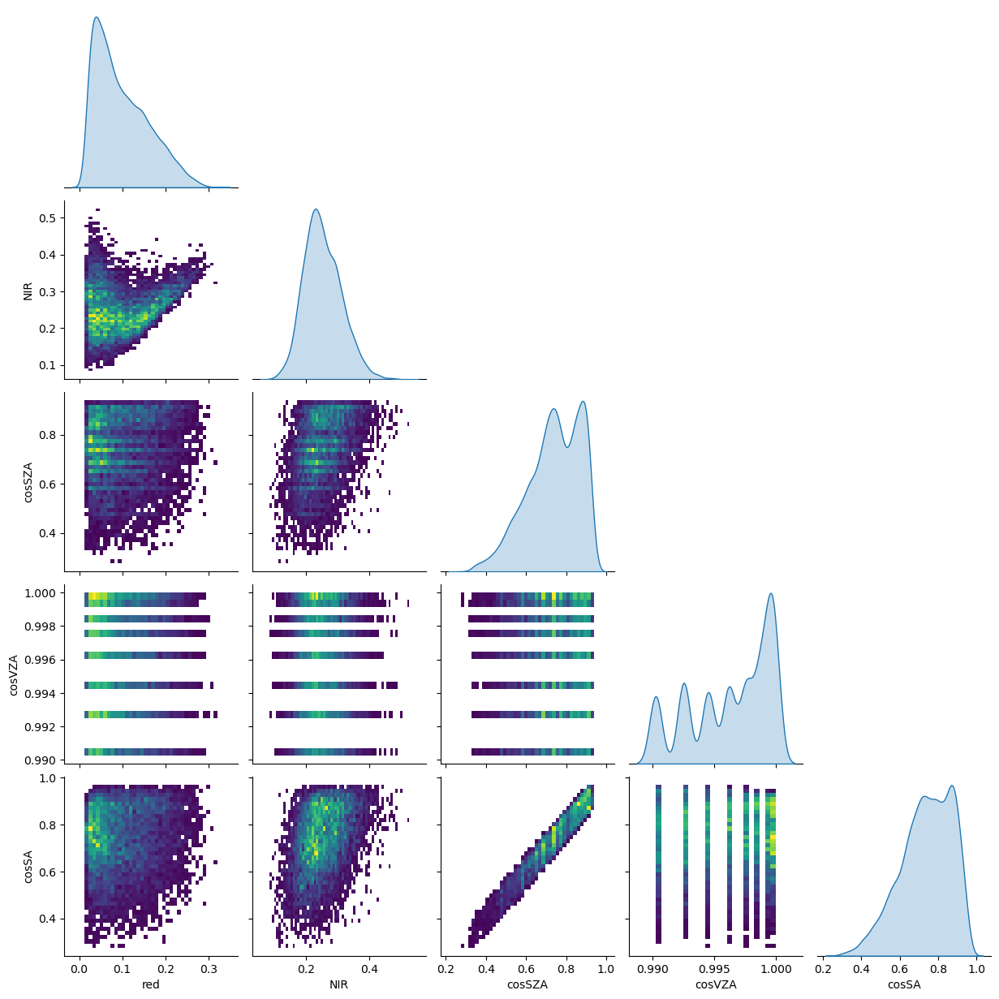

In [16]:
pairplot = sns.pairplot(dfALLtrimKANG.loc[dfALLtrimKANG['LC_type3']<9][['red','NIR','cosSZA','cosVZA','cosSA']].sample(10000).divide(10000),plot_kws={'cmap':'viridis'},kind='hist',diag_kind='kde',corner=True)
#pairplot.fig.savefig("Figure4.png", bbox_inches='tight')

## Production of Sampled Databases

In [ ]:
# read in all calibration data
dfALL = pd.read_pickle('c:/users/rfernand/modisLandsat/code/MODISLANDSATall.pkl')

In [26]:
# Validation data for LAI and FAPAR
valbiomeDictLAI = pd.read_pickle('c:/users/rfernand/modisLandsat/code/valbiomeDictLAI.pkl')
valbiomeDictFAPAR = pd.read_pickle('c:/users/rfernand/modisLandsat/code/valbiomeDictFAPAR.pkl')

# Calibration data for LAI and FAPAR
calbiomeDictLAI = pd.read_pickle('c:/users/rfernand/modisLandsat/code/calbiomeDictLAI.pkl')
calbiomeDictFAPAR = pd.read_pickle('c:/users/rfernand/modisLandsat/code/calbiomeDictFAPAR.pkl')

# Kang's calibration data for LAI and FAPAR
calbiomeDictLAIKANG = pd.read_pickle('c:/users/rfernand/modisLandsat/code/calbiomeDictLAIKANGv2.pkl')
calbiomeDictFAPARKANG = pd.read_pickle('c:/users/rfernand/modisLandsat/code/calbiomeDictFAPARKANGv2.pkl')

# FTL  calibration data for LAI and FAPAR
calbiomeDictLAIFTL= pd.read_pickle('c:/users/rfernand/modisLandsat/code/calbiomeDictLAIFTL.pkl')
calbiomeDictFAPARFTL = pd.read_pickle('c:/users/rfernand/modisLandsat/code/calbiomeDictFAPARFTL.pkl')

# https://drive.google.com/drive/folders/1jVKwxWPlH7nYnpL1yJAUD2jFkXV3A1kf?usp=share_link

### NAIVE AND FTL

In [ ]:
# trim outliers for NAIVE and FTL and make additional features
dfALLtrim = makeFeatures(trimMatchUps(dfALL,10))


# save calibration database before and after trimming
pd.to_pickle(dfALLtrim,'c:/users/rfernand/modisLandsat/code/MODISLANDSATalltrim.pkl')

In [ ]:
# extract validation data from dfALLtrim using uniform sampling of response
# save in dictionary of data frames, each data frame for one LC_Type3 
# and also remove from calibration data for NAIVE and save in dictionary of data frames, each data frame for one LC_Type3 

# LAI
calbiomeDictLAI = {}
valbiomeDictLAI = {}
features = ['LAI']
for biome in  dfALLtrim['LC_type3'].unique():
    dfBiome = dfALLtrim.loc[dfALLtrim['LC_type3']==biome]
    valDFBiome = resampleBiome(dfBiome,features,maxSamples=10000,percentilePairwiseDist=99,metricDist='manhattan',randSeed=10)
    calDFBiome = dfBiome.drop(valDFBiome.index)
    calbiomeDictLAI.update({biome: {'DF': calDFBiome}})
    valbiomeDictLAI.update({biome: {'DF': valDFBiome}})
    print('Biome',biome,' size',dfBiome.shape,' calibration size',calDFBiome.shape,' validation size', valDFBiome.shape)

# FAPAR
calbiomeDictFAPAR = {}
valbiomeDictFAPAR = {}
features = ['FAPAR']
for biome in dfALLtrim['LC_type3'].unique():
    dfBiome = dfALLtrim.loc[dfALLtrim['LC_type3']==biome]
    valDFBiome = resampleBiome(dfBiome,features,maxSamples=10000,percentilePairwiseDist=99,metricDist='manhattan',randSeed=10)
    calDFBiome = dfBiome.drop(valDFBiome.index)
    calbiomeDictFAPAR.update({biome: {'DF': calDFBiome}})
    valbiomeDictFAPAR.update({biome: {'DF': valDFBiome}})
    print('Biome',biome,' size',dfBiome.shape,' calibration size',calDFBiome.shape,' validation size', valDFBiome.shape)

In [21]:
for biome in [1,2,3,4,5,6,7,8]:
    print(calbiomeDictLAIFTL[biome]['DF'].shape[0])

50839
12307
5322
10138
4363
4251
3273
4469


In [ ]:
#create FTL calibration databases by uniform subsampling of response
#LAI
regressors = ['red','NIR','cosSZA','cosVZA','cosSA']
features=  regressors
calbiomeDictLAIFTL2 = resampleDict(calbiomeDictLAI,regressors,features,satFlag=-1,minSubSamples=2000,maxSamples=10000,percentileKDE=1)
calbiomeDictLAIFTL2 = resampleDict(calbiomeDictFTL2,regressors,features,satFlag=-1,minSubSamples=2000,maxSamples=10000,percentileKDE=50)



Biome 2  with  484803 samples.


In [32]:
pd.to_pickle(valbiomeDictLAI,'c:/users/rfernand/modisLandsat/code/valbiomeDictLAI.pkl')
pd.to_pickle(calbiomeDictLAI,'c:/users/rfernand/modisLandsat/code/calbiomeDictLAI.pkl')
pd.to_pickle(calbiomeDictLAIFTL,'c:/users/rfernand/modisLandsat/code/calbiomeDictLAIFTL.pkl')

pd.to_pickle(valbiomeDictFAPAR,'c:/users/rfernand/modisLandsat/code/valbiomeDictFAPAR.pkl')
pd.to_pickle(calbiomeDictFAPAR,'c:/users/rfernand/modisLandsat/code/calbiomeDictFAPAR.pkl')
pd.to_pickle(calbiomeDictFAPARFTL,'c:/users/rfernand/modisLandsat/code/calbiomeDictFAPARFTL.pkl')


### K2021

In [ ]:
#trim outliers for KANG
dfALLtrimKang = makeFeatures(trimMatchUps(dfALL,60))

#save calibration database after  trimming
pd.to_pickle(dfALLtrimKANG,'c:/users/rfernand/modisLandsat/code/MODISLANDSATalltrimKANG.pkl')

In [19]:
#save calibration database after trimming
dfALLtrimKANG = pd.read_pickle('c:/users/rfernand/modisLandsat/code/MODISLANDSATalltrimKANG.pkl')

# Validation data for LAI and FAPAR
valbiomeDictLAI = pd.read_pickle('c:/users/rfernand/modisLandsat/code/valbiomeDictLAI.pkl')
valbiomeDictFAPAR = pd.read_pickle('c:/users/rfernand/modisLandsat/code/valbiomeDictFAPAR.pkl')

# https://drive.google.com/drive/folders/1jVKwxWPlH7nYnpL1yJAUD2jFkXV3A1kf?usp=share_link

In [28]:
# subset data from dfALLKANG, screen for ND VI-LAI outliers and save in dictionary of data frames, each data frame for one LC_Type3 
# calbiomeDictLAIKANG = {}
regressors =  ['red','NIR','SWIR1','NDVI','NDWI','Lat','Lon','cosSZA','cosSA']
features = ['red','NIR','LAI']
# for biome in dfALLtrimKANG['LC_type3'].unique():
    
#     #subset samples for current biome
#     dfBiome = dfALLtrimKANG.loc[dfALLtrimKANG['LC_type3']==biome]

#     # drop validation samples
#     calDFBiome = dfBiome[~dfBiome.isin(valbiomeDictLAI[biome]['DF'])].dropna()

#     # trim by NDVI - LAI
#     calDFBiome = trimDFNumSample(calDFBiome,'LAI','NDVI',[5,95],10000)
    
#     #save to dictionary
#     calbiomeDictLAIKANG.update({biome: {'DF': calDFBiome}})
#     print('Biome',biome,' size',dfBiome.shape,' calibration size',calDFBiome.shape)

#Resample to increase uniformity with respect to features specified
#we use two passes 
# calbiomeDictLAIKANG = resampleDict(calbiomeDictLAIKANG,regressors,features,satFlag=-1,minSubSamples=2000,maxSamples=10000,percentileKDE=1)
calbiomeDictLAIKANG = resampleDict(calbiomeDictLAIKANG,regressors,features,satFlag=-1,minSubSamples=2000,maxSamples=10000,percentileKDE=50)

#Balance saturated and unsaturated assuming minimum of 10000 unsat samples
# for biome in  [1,2,3,4,5,6,7,8]:
    
#     #subset samples for current biome
#     dfBiome = calbiomeDictLAIKANG[biome]['DF']
    
#     #get sat and unsat samples
#     dfBiomeSat = dfBiome.loc[dfBiome['LUT_satFlag']==1]
#     dfBiomeUnSat = dfBiome.loc[dfBiome['LUT_satFlag']==0]
#     nSat = dfBiomeSat.shape[0]
#     nUnSat = dfBiomeUnSat.shape[0]
    
#     #keep all Sat samples if there are more sat than unsat
#     if ( nSat >= nUnSat) :
#         calbiomeDictLAIKANG[biome]['DF'] = pd.concat([dfBiomeSat.sample(nUnSat),dfBiomeUnSat])
#     else:
#         calbiomeDictLAIKANG[biome]['DF'] = pd.concat([dfBiomeSat,dfBiomeUnSat.sample(np.maximum(nSat,10000))])

#     # Extracting the dataframe from the calibration data for the LC_Type
#     df = calbiomeDictLAIKANG[biome]['DF']

#     # Fitting a Random Forest with min leaf size equal to 50
#     calbiomeDictLAIKANG[biome]['sat_class'] = RandomForestClassifier(n_estimators=100,min_samples_leaf=50,max_features=5,bootstrap=True,max_depth=20,max_samples=min(df.shape[0],100000),random_state=0,verbose=0,n_jobs=-1,max_leaf_nodes=10000)
#     calbiomeDictLAIKANG[biome]['sat_class'].fit(df[regressors], df['LUT_satFlag'])

#     # Predicting LUT_satFlag with the Random Forest using the validation data
#     df['predSatFlag'] = calbiomeDictLAIKANG[biome]['sat_class'].predict(df[regressors])
    
#     # Only keep data where the predicted satFlag matches the true satFlag
#     calbiomeDictLAIKANG[biome]['DF'] = df.loc[df['LUT_satFlag'] == df['predSatFlag']]
#     print('biome',biome,' input size ',df.shape[0],' final size ', calbiomeDictLAIKANG[biome]['DF'].shape[0])
# pd.to_pickle(calbiomeDictLAIKANG,'c:/users/rfernand/modisLandsat/code/calbiomeDictLAIKANGv4.pkl')
   
        

Biome 6  with  498264 samples.
Biome  6  using only  425425 of  498264  samples.
Biome 4  with  1627349 samples.
Biome  4  using only  1335983 of  1627349  samples.
Biome 7  with  344360 samples.
Biome  7  using only  297333 of  344360  samples.
Biome 9  with  18743 samples.
Biome  9  using only  16559 of  18743  samples.
Biome 2  with  450792 samples.
Biome  2  using only  404570 of  450792  samples.
Biome 1  with  2201438 samples.
Biome  1  using only  1837297 of  2201438  samples.
Biome 8  with  57740 samples.
Biome  8  using only  50111 of  57740  samples.
Biome 3  with  237106 samples.
Biome  3  using only  206356 of  237106  samples.
Biome 5  with  199390 samples.
Biome  5  using only  165932 of  199390  samples.
Biome 10  with  52471 samples.
Biome  10  using only  45426 of  52471  samples.


In [ ]:
# subset data from dfALLKANG, screen for ND VI-LAI outliers and save in dictionary of data frames, each data frame for one LC_Type3 
# calbiomeDictFAPARKANG = {}
regressors =  ['red','NIR','SWIR1','NDVI','NDWI','Lat','Lon','cosSZA','cosSA']
features = ['red','NIR','FAPAR']
# for biome in dfALLtrimKANG['LC_type3'].unique():
    
#     #subset samples for current biome
#     dfBiome = dfALLtrimKANG.loc[dfALLtrimKANG['LC_type3']==biome]

#     # drop validation samples
#     calDFBiome = dfBiome[~dfBiome.isin(valbiomeDictFAPAR[biome]['DF'])].dropna()

#     # trim by NDVI - FAPAR
#     calDFBiome = trimDFNumSample(calDFBiome,'FAPAR','NDVI',[5,95],10000)
    
#     #save to dictionary
#     calbiomeDictFAPARKANG.update({biome: {'DF': calDFBiome}})
#     print('Biome',biome,' size',dfBiome.shape,' calibration size',calDFBiome.shape)

#Resample to increase uniformity with respect to features specified
#we use two passes 
# calbiomeDictFAPARKANG = resampleDict(calbiomeDictFAPARKANG,regressors,features,satFlag=-1,minSubSamples=2000,maxSamples=10000,percentileKDE=1)
calbiomeDictFAPARKANG = resampleDict(calbiomeDictFAPARKANG,regressors,features,satFlag=-1,minSubSamples=2000,maxSamples=10000,percentileKDE=50)

#Balance saturated and unsaturated assuming minimum of 10000 unsat samples
# for biome in  [1,2,3,4,5,6,7,8]:
    
#     #subset samples for current biome
#     dfBiome = calbiomeDictFAPARKANG[biome]['DF']
    
#     #get sat and unsat samples
#     dfBiomeSat = dfBiome.loc[dfBiome['LUT_satFlag']==1]
#     dfBiomeUnSat = dfBiome.loc[dfBiome['LUT_satFlag']==0]
#     nSat = dfBiomeSat.shape[0]
#     nUnSat = dfBiomeUnSat.shape[0]
    
#     #keep all Sat samples if there are more sat than unsat
#     if ( nSat >= nUnSat) :
#         calbiomeDictFAPARKANG[biome]['DF'] = pd.concat([dfBiomeSat.sample(nUnSat),dfBiomeUnSat])
#     else:
#         calbiomeDictFAPARKANG[biome]['DF'] = pd.concat([dfBiomeSat,dfBiomeUnSat.sample(np.maximum(nSat,10000))])

#     # Extracting the dataframe from the calibration data for the LC_Type
#     df = calbiomeDictFAPARKANG[biome]['DF']

#     # Fitting a Random Forest with min leaf size equal to 50
#     calbiomeDictFAPARKANG[biome]['sat_class'] = RandomForestClassifier(n_estimators=100,min_samples_leaf=50,max_features=5,bootstrap=True,max_depth=20,max_samples=min(df.shape[0],100000),random_state=0,verbose=0,n_jobs=-1,max_leaf_nodes=10000)
#     calbiomeDictFAPARKANG[biome]['sat_class'].fit(df[regressors], df['LUT_satFlag'])

#     # Predicting LUT_satFlag with the Random Forest using the validation data
#     df['predSatFlag'] = calbiomeDictFAPARKANG[biome]['sat_class'].predict(df[regressors])
    
#     # Only keep data where the predicted satFlag matches the true satFlag
#     calbiomeDictFAPARKANG[biome]['DF'] = df.loc[df['LUT_satFlag'] == df['predSatFlag']]
#     print('biome',biome,' input size ',df.shape[0],' final size ', calbiomeDictFAPARKANG[biome]['DF'].shape[0])
# pd.to_pickle(calbiomeDictFAPARKANG,'c:/users/rfernand/modisLandsat/code/calbiomeDictFAPARKANGv3.pkl')
   


Biome 6  with  498264 samples.
Biome  6  using only  372756 of  498264  samples.
Biome 4  with  1627349 samples.
Biome  4  using only  1366461 of  1627349  samples.
Biome 7  with  344360 samples.
Biome  7  using only  293002 of  344360  samples.
Biome 9  with  18743 samples.
Biome  9  using only  16498 of  18743  samples.
Biome 2  with  450792 samples.
Biome  2  using only  401677 of  450792  samples.
Biome 1  with  2201438 samples.


Calibrate RF predictors of satFLAG for each biome 

Classification accuracy based on 10 fold cross validation

In [ ]:
# List of desired metrics and scoting to quantify the quality of the prediction
scores = ['accuracy','f1','precision','recall']

# Loop through all LC_type3 in the dictionary
for LC_Type3 in calbiomeDictLAIKANG:
    
    # Only take LC_Type 1 to 8
    if LC_Type3 <= 8:
        
        # Initializing clf to the desired estimator (RandomForestClassifier)
        clf = calbiomeDictLAIKANG[LC_Type3]['sat_class']
        # clf = RandomForestClassifier(n_estimators=100,min_samples_leaf=10,max_features=5,bootstrap=True,random_state=0,verbose=0,n_jobs=-1,max_leaf_nodes=10000)
        
        # Extracting the desired dataframe (subsampling to 10000 samples for faster results)
        df = calbiomeDictLAIKANG[LC_Type3]['DF'].sample(10000)
        
        # Cross validating the estimator with 10-fold cross validation
        cv_results = cross_validate(estimator=clf, X=df[regressors], y=df[satFlag], cv=10, scoring=scores)
        
        
        # print(LC_Type3, v)
        print(LC_Type3, cv_results.keys())
        for score in cv_results.keys():
            print('{0: <16} {1: <8}'.format(score, np.mean(cv_results[score])))

In [ ]:
# List of desired metrics and scoting to quantify the quality of the prediction
scores = ['accuracy','f1','precision','recall']

# Loop through all LC_type3 in the dictionary
for LC_Type3 in calbiomeDictFAPARKANG:
    
    # Only take LC_Type 1 to 8
    if LC_Type3 <= 8:
        
        # Initializing clf to the desired estimator (RandomForestClassifier)
        clf = calbiomeDictFAPARKANG[LC_Type3]['sat_class']
        # clf = RandomForestClassifier(n_estimators=100,min_samples_leaf=10,max_features=5,bootstrap=True,random_state=0,verbose=0,n_jobs=-1,max_leaf_nodes=10000)
        
        # Extracting the desired dataframe (subsampling to 10000 samples for faster results)
        df = calbiomeDictFAPARKANG[LC_Type3]['DF'].sample(10000)
        
        # Cross validating the estimator with 10-fold cross validation
        cv_results = cross_validate(estimator=clf, X=df[regressors], y=df[satFlag], cv=10, scoring=scores)
        
        
        # print(LC_Type3, v)
        print(LC_Type3, cv_results.keys())
        for score in cv_results.keys():
            print('{0: <16} {1: <8}'.format(score, np.mean(cv_results[score])))

## Random Forest

Reading in calibration and validation data.

In [22]:
# Validation data for LAI and FAPAR
valbiomeDictLAI = pd.read_pickle('c:/users/rfernand/modisLandsat/code/valbiomeDictLAI.pkl')
valbiomeDictFAPAR = pd.read_pickle('c:/users/rfernand/modisLandsat/code/valbiomeDictFAPAR.pkl')

# Calibration data for LAI and FAPAR
calbiomeDictLAI = pd.read_pickle('c:/users/rfernand/modisLandsat/code/calbiomeDictLAI.pkl')
calbiomeDictFAPAR = pd.read_pickle('c:/users/rfernand/modisLandsat/code/calbiomeDictFAPAR.pkl')

# Kang's calibration data for LAI and FAPAR
calbiomeDictLAIKANG = pd.read_pickle('c:/users/rfernand/modisLandsat/code/calbiomeDictLAIKANGv3.pkl')
calbiomeDictFAPARKANG = pd.read_pickle('c:/users/rfernand/modisLandsat/code/calbiomeDictFAPARKANGv3.pkl')

# FTL  calibration data for LAI and FAPAR
calbiomeDictLAIFTL= pd.read_pickle('c:/users/rfernand/modisLandsat/code/calbiomeDictLAIFTL.pkl')
calbiomeDictFAPARFTL = pd.read_pickle('c:/users/rfernand/modisLandsat/code/calbiomeDictFAPARFTL.pkl')


# https://drive.google.com/drive/folders/1jVKwxWPlH7nYnpL1yJAUD2jFkXV3A1kf?usp=share_link

### NAIVE RF

In [42]:
#NAIVE LAI
method='NAIVE'
regressors = ['red','NIR','cosSZA','cosVZA','cosSA']
response = 'FAPAR'
for LC_type3 in calbiomeDictFAPAR.keys():
    df = calbiomeDictFAPAR[LC_type3]['DF']
    calbiomeDictFAPAR[LC_type3][method+response+'regression']  = RandomForestRegressor(n_estimators=10,min_samples_leaf=100,max_features=5,bootstrap=True,random_state=0,verbose=0,n_jobs=-1,max_depth=20,max_samples=min(df.shape[0],1000000)).fit(df[regressors],np.array(df[response]).ravel())
    calbiomeDictFAPAR[LC_type3]['DF'][method+response] = calbiomeDictFAPAR[LC_type3][method+response+'regression'].predict(df[regressors])
    valbiomeDictFAPAR[LC_type3][method+response+'regression'] = calbiomeDictFAPAR[LC_type3][method+response+'regression']
    valbiomeDictFAPAR[LC_type3]['DF'][method+response] = calbiomeDictFAPAR[LC_type3][method+response+'regression'].predict(valbiomeDictFAPAR[LC_type3]['DF'][regressors])


#NAIVE FAPAR
method='NAIVE'
regressors = ['red','NIR','cosSZA','cosVZA','cosSA']
response = 'LAI'
for LC_type3 in calbiomeDictLAI.keys():
    df = calbiomeDictLAI[LC_type3]['DF']
    calbiomeDictLAI[LC_type3][method+response+'regression']  = RandomForestRegressor(n_estimators=100,min_samples_leaf=10,max_features=5,bootstrap=True,random_state=0,verbose=0,n_jobs=-1,max_depth=20).fit(df[regressors],np.array(df[response]).ravel())
    calbiomeDictLAI[LC_type3]['DF'][method+response] = calbiomeDictLAI[LC_type3][method+response+'regression'].predict(df[regressors])
    valbiomeDictLAI[LC_type3][method+response+'regression'] = calbiomeDictLAI[LC_type3][method+response+'regression']
    valbiomeDictLAI[LC_type3]['DF'][method+response] = calbiomeDictLAI[LC_type3][method+response+'regression'].predict(valbiomeDictLAI[LC_type3]['DF'][regressors])


### K2021

In [23]:
#K2021LAI
method='KANG'
regressors =  ['red','NIR','SWIR1','NDVI','NDWI','Lat','Lon','cosSZA','cosSA']
response = 'FAPAR'
for biome in calbiomeDictFAPARKANG.keys():
    df = calbiomeDictFAPARKANG[biome]['DF']
    calbiomeDictFAPARKANG[biome][method+response+'regression']  = RandomForestRegressor(n_estimators=100,min_samples_leaf=50,max_features=5,bootstrap=True,random_state=0,verbose=0,n_jobs=-1,max_depth=20,max_samples=min(df.shape[0],1000000)).fit(df[regressors],np.array(df[response]).ravel())
    calbiomeDictFAPARKANG[biome]['DF'][method+response] = calbiomeDictFAPARKANG[biome][method+response+'regression'].predict(df[regressors])
    valbiomeDictFAPAR[biome][method+response+'regression'] = calbiomeDictFAPARKANG[biome][method+response+'regression']
    valbiomeDictFAPAR[biome]['DF'][method+response] = calbiomeDictFAPARKANG[biome][method+response+'regression'].predict(valbiomeDictFAPAR[biome]['DF'][regressors])
    

#K2021 FAPAR
method='KANG'
regressors =  ['red','NIR','SWIR1','NDVI','NDWI','Lat','Lon','cosSZA','cosSA']
response = 'LAI'
for biome in calbiomeDictLAIKANG.keys():
    df = calbiomeDictLAIKANG[biome]['DF']
    calbiomeDictLAIKANG[biome][method+response+'regression']  = RandomForestRegressor(n_estimators=100,min_samples_leaf=50,max_features=5,bootstrap=True,random_state=0,verbose=0,n_jobs=-1,max_depth=20).fit(df[regressors],np.array(df[response]).ravel())
    calbiomeDictLAIKANG[biome]['DF'][method+response] = calbiomeDictLAIKANG[biome][method+response+'regression'].predict(df[regressors])
    valbiomeDictLAI[biome][method+response+'regression'] = calbiomeDictLAIKANG[biome][method+response+'regression']
    valbiomeDictLAI[biome]['DF'][method+response] = calbiomeDictLAIKANG[biome][method+response+'regression'].predict(valbiomeDictLAI[biome]['DF'][regressors])


In [48]:
# FTL LAI
# try this with small RF and then uncomment out the 28-29 and comment line 25-26
method = 'FTL'
regressors = ['red','NIR','cosSZA','cosVZA','cosSA']
response = ['LAI']

# Stuff for GEE
#Specify scaling and index for Domain, currently we only allow one digit per regressor
# Number of digits per regressor
domainIndex = [1,1,1,1,1]
# Sxaling per regressor
domainScaling = [ 10/10000, 10/10000,10/10000,10/10000,10/10000]
# Offset per regressor
domainOffset = [ 0,0,0,0,0]
#GEE regressor names
regressorsGEENames =  [ 'SR_B4', 'SR_B5','cosSZA','cosVZA','cosSA'] 


calbiomeDictLAIFTL= hierarchicalRF(calbiomeDictLAIFTL,calbiomeDictLAI,regressors,regressorsGEENames, response, domainScaling,domainOffset, maxDepthParent=20,maxDepthChild=20,minSamplesSplit=2,\
                             maxleafnodesParent=999,  minSamplesLeafParent=10,maxleafnodesChild= 999, minSamplesLeafChild=1,maxFeatures=5,nTrees = 100)

# calbiomeDictLAIFTL= hierarchicalRF(calbiomeDictLAIFTL,calbiomeDictLAI,regressorsNames,regressorsGEENames, response, domainScaling,domainOffset, maxDepth=10, minSamplesSplit=11,\
#                              maxleafnodesParent=999,  minSamplesLeafParent=10,maxleafnodesChild= 999, minSamplesLeafChild=10,maxFeatures=5,nTrees = 100)
calbiomeDictLAIFTL=  predictClassifier(calbiomeDictLAIFTL,calbiomeDictLAIFTL, 'FTL', regressors, ['LAI'])
valbiomeDictLAI=  predictClassifier(valbiomeDictLAI,calbiomeDictLAIFTL, 'FTL', regressors, ['LAI'])


biome: 2
Total size  (484803, 6)
Parent size  (12307, 6)
number children: 571
biome: 1
Total size  (2358489, 6)
Parent size  (50839, 6)
number children: 911
biome: 9
Total size  (19139, 6)
Parent size  (3494, 6)
number children: 71
biome: 4
Total size  (1767953, 6)
Parent size  (10138, 6)
number children: 633
biome: 6
Total size  (541659, 6)
Parent size  (4251, 6)
number children: 305
biome: 7
Total size  (376649, 6)
Parent size  (3273, 6)
number children: 240
biome: 8
Total size  (60520, 6)
Parent size  (4469, 6)
number children: 316
biome: 3
Total size  (260190, 6)
Parent size  (5322, 6)
number children: 337
biome: 5
Total size  (215478, 6)
Parent size  (4363, 6)
number children: 317
biome: 10
Total size  (2208, 6)
Parent size  (2208, 6)
number children: 151
biome: 2
biome: 1
biome: 9
biome: 4
biome: 6
biome: 7
biome: 8
biome: 3
biome: 5
biome: 10
biome: 2
biome: 1
biome: 9
biome: 4
biome: 6
biome: 7
biome: 8
biome: 3
biome: 5
biome: 10


### NAIVE LAI

Fitting a Random Forests for LAI using the NAIVE method

In [ ]:
# Empty arrays used later to concatenate dataframes of all LC_Types
dfsLAI = []
dfsLAI10 = []

# Looping through each LC_Type
for biome in calbiomeDictLAI:
    # Only fit Random Forests for LC_Types 1-8
    if biome <= 8:
        
        # Extracting the dataframe from the calibration and validation data for the LC_Type
        # Only 10000 samples are used from the calibration data
        dfcal = calbiomeDictLAI[biome]['DF'].sample(10000)
        dfval = valbiomeDictLAI[biome]['DF']
        
        # Fitting a Random Forest with min leaf size equal to 50
        calbiomeDictLAI[biome]['regr50'] = RandomForestRegressor(min_samples_leaf = 50)
        calbiomeDictLAI[biome]['regr50'].fit(dfcal[regressors], dfcal[LAI])
        
        # Fitting a Random Forest with min leaf size equal to 10
        calbiomeDictLAI[biome]['regr10'] = RandomForestRegressor(min_samples_leaf = 10)
        calbiomeDictLAI[biome]['regr10'].fit(dfcal[regressors], dfcal[LAI])
        
        trueLAI = dfval[LAI]
        
        # Predicting LAI with the Random Forest using the validation data
        predLAI50 = calbiomeDictLAI[biome]['regr50'].predict(dfval[regressors])
        predLAI10 = calbiomeDictLAI[biome]['regr10'].predict(dfval[regressors])
        
        # Determining the number of leaf nodes in each Random Forest
        n50 = 0
        for tree in calbiomeDictLAI[biome]['regr50'].estimators_:
            n50 += tree.get_n_leaves()
        n10 = 0
        for tree in calbiomeDictLAI[biome]['regr10'].estimators_:
            n10 += tree.get_n_leaves()
        
        # Inserting the new statistics as a dataframe into the dictionary
        valbiomeDictLAI[biome]['dfNAIVE50LAI'] = pd.DataFrame(data={
            'LAI': trueLAI,
            'Predicted LAI': predLAI50,
            'biome': biome,
            'R2': calbiomeDictLAI[biome]['regr50'].score(dfval[regressors], trueLAI),
            'RMSE': metrics.mean_squared_error(predLAI50, trueLAI, squared=False),
            'Nodes': n50})
        
        valbiomeDictLAI[biome]['dfNAIVE10LAI'] = pd.DataFrame(data={
            'LAI': trueLAI,
            'Predicted LAI': predLAI10,
            'biome': biome,
            'R2': calbiomeDictLAI[biome]['regr10'].score(dfval[regressors], trueLAI),
            'RMSE': metrics.mean_squared_error(predLAI10, trueLAI, squared=False),
            'Nodes': n10})
        
        # Merge two methods before sampling
        df = valbiomeDictLAI[biome]['dfNAIVE50LAI'].join(valbiomeDictLAI[biome]['dfNAIVE10LAI'], lsuffix='_50', rsuffix='_10')
        
        # Appending the dataframes to an array used to concatenate later
        dfsLAI.append(df.sample(1000))
        
# Concatenating the dataframes with the predicted LAI values for all LC_Types
dfcalbiomeLAI = pd.concat(dfsLAI)

In [43]:
for biome in valbiomeDictLAI:
    if biome <= 8:
        print(biome, valbiomeDictLAI[biome]['dfNAIVE50LAI']['Nodes'].unique()[0], valbiomeDictLAI[biome]['dfNAIVE10LAI']['Nodes'].unique()[0])

6 9688 49561
4 9610 49459
7 9692 49409
2 9575 44672
1 9662 47633
8 9708 49536
3 9702 49526
5 9780 49576


R^2 and RMSE values for LAI Random Forest with min 50 leaf samples

In [21]:
for biome in valbiomeDictLAI:
    if biome <= 8:
        df = valbiomeDictLAI[biome]['dfNAIVE50LAI'][['R2', 'RMSE']]
        print(biome, df['R2'].unique()[0], df['RMSE'].unique()[0])

6 0.8375823754031047 7.664674602257081
4 0.6297222206727742 11.774038469345003
7 0.6921153713092791 10.112314173411294
2 0.8173694936974024 5.276094480853483
1 0.5832116265989593 11.738023698269433
8 0.785306530458693 8.806633647153815
3 0.635009365524221 11.644550529794191
5 0.5930422986681588 11.26499008796877


R^2 and RMSE values for LAI Random Forest with min 10 leaf samples

In [22]:
for biome in valbiomeDictLAI:
    if biome <= 8:
        df = valbiomeDictLAI[biome]['dfNAIVE10LAI'][['R2', 'RMSE']]
        print(biome, df['R2'].unique()[0], df['RMSE'].unique()[0])

6 0.8499233301350095 7.36773058802951
4 0.6511748903272585 11.427875357620325
7 0.7141267730771822 9.744135004310182
2 0.8609015151787188 4.604549033627395
1 0.6332660094104847 11.010645147068141
8 0.8100566699800962 8.283474446086316
3 0.6828963125285643 10.853817515563996
5 0.6518728056905907 10.418978770732625


Scatterplotting True LAI vs Predicted LAI

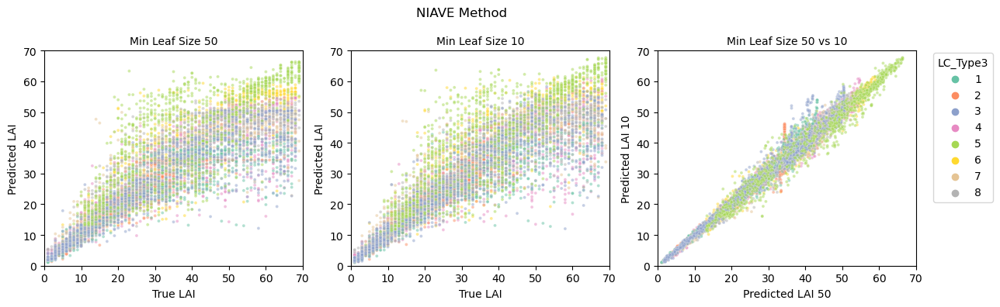

In [23]:
fig, axs = plt.subplots(1,3, figsize=(12, 4))
sns.scatterplot(dfcalbiomeLAI, x='LAI_50', y='Predicted LAI_50', ax=axs[0], hue='LC_Type3_50', palette='Set2', s=8, alpha=0.5, legend=0)
sns.scatterplot(dfcalbiomeLAI, x='LAI_10', y='Predicted LAI_10', ax=axs[1], hue='LC_Type3_50', palette='Set2', s=8, alpha=0.5)
sns.scatterplot(dfcalbiomeLAI, x='Predicted LAI_50', y='Predicted LAI_10', ax=axs[2], hue='LC_Type3_50', palette='Set2', s=8, alpha=0.5, legend=0)

fig.suptitle('NIAVE Method')
axs[0].set_title('Min Leaf Size 50', size=10)
axs[0].set(xlabel='True LAI', ylabel='Predicted LAI')
axs[0].set_xlim(0, 70)
axs[0].set_ylim(0, 70)

axs[1].set_title('Min Leaf Size 10', size=10)
axs[1].set(xlabel='True LAI', ylabel='Predicted LAI')
axs[1].set_xlim(0, 70)
axs[1].set_ylim(0, 70)

axs[2].set_title('Min Leaf Size 50 vs 10', size=10)
axs[2].set(xlabel='Predicted LAI 50', ylabel='Predicted LAI 10')
axs[2].set_xlim(0, 70)
axs[2].set_ylim(0, 70)

fig.tight_layout()

handles, labels = axs[1].get_legend_handles_labels()
fig.legend(handles, labels, loc="upper left", bbox_to_anchor=(1,0.85), title = "LC_Type3")
axs[1].get_legend().set_visible(False)

plt.show()

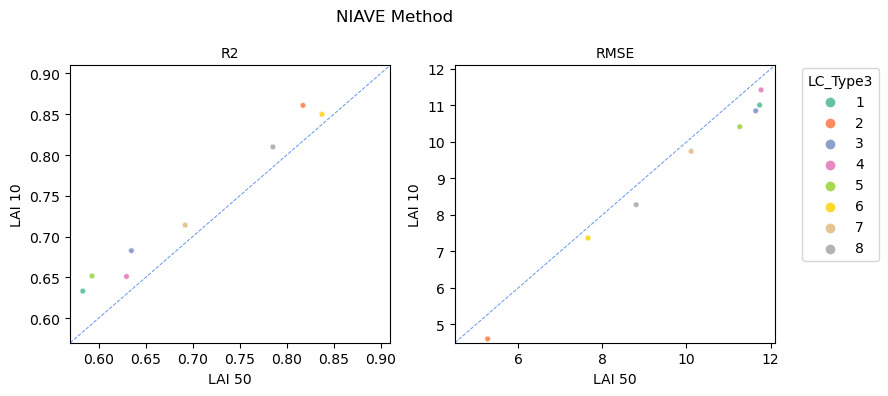

In [24]:
fig, axs = plt.subplots(1,2, figsize=(8, 4))
sns.scatterplot(dfcalbiomeLAI, x='R2_50', y='R2_10', ax=axs[0], hue='LC_Type3_50', palette='Set2', s=15, alpha=1, legend=0)
sns.scatterplot(dfcalbiomeLAI, x='RMSE_50', y='RMSE_10', ax=axs[1], hue='LC_Type3_50', palette='Set2', s=15, alpha=1)

fig.suptitle('NIAVE Method')

axs[0].set_title('R2', size=10)
axs[0].set(xlabel='LAI 50', ylabel='LAI 10')
axs[0].set_xlim(0.57, 0.91)
axs[0].set_ylim(0.57, 0.91)
axs[0].axline((0,0), slope=1, c='cornflowerblue', lw=0.7, ls='--')

axs[1].set_title('RMSE', size=10)
axs[1].set(xlabel='LAI 50', ylabel='LAI 10')
axs[1].set_xlim(4.5, 12.1)
axs[1].set_ylim(4.5, 12.1)
axs[1].axline((0,0), slope=1, c='cornflowerblue', lw=0.7, ls='--')

fig.tight_layout()

handles, labels = axs[1].get_legend_handles_labels()
fig.legend(handles, labels, loc="upper left", bbox_to_anchor=(1,0.85), title = "LC_Type3")
axs[1].get_legend().set_visible(False)

plt.show()

### NAIVE FAPAR

Fitting a Random Forests for FAPAR using the NAIVE method

In [44]:
# Empty arrays used later to concatenate dataframes of all LC_Types
dfsFAPAR = []

# Looping through each LC_Type
for LC_Type3 in calbiomeDictFAPAR:
    # Only fit Random Forests for LC_Types 1-8
    if LC_Type3 <= 8:
        
        # Extracting the dataframe from the calibration and validation data for the LC_Type
        # Only 10000 samples are used from the calibration data
        dfcal = calbiomeDictFAPAR[LC_Type3]['DF'].sample(10000)
        dfval = valbiomeDictFAPAR[LC_Type3]['DF']
        
        # Fitting a Random Forest with min leaf size equal to 50
        calbiomeDictFAPAR[LC_Type3]['regr50'] = RandomForestRegressor(min_samples_leaf = 50)
        calbiomeDictFAPAR[LC_Type3]['regr50'].fit(dfcal[regressors], dfcal[FAPAR])
        
        # Fitting a Random Forest with min leaf size equal to 10
        calbiomeDictFAPAR[LC_Type3]['regr10'] = RandomForestRegressor(min_samples_leaf = 10)
        calbiomeDictFAPAR[LC_Type3]['regr10'].fit(dfcal[regressors], dfcal[FAPAR])
        
        trueFAPAR = dfval[FAPAR]
        
        # Predicting FAPAR with the Random Forest using the validation data
        predFAPAR50 = calbiomeDictFAPAR[LC_Type3]['regr50'].predict(dfval[regressors])
        predFAPAR10 = calbiomeDictFAPAR[LC_Type3]['regr10'].predict(dfval[regressors])
        
        # Determining the number of leaf nodes in each Random Forest
        n50 = 0
        for tree in calbiomeDictFAPAR[LC_Type3]['regr50'].estimators_:
            n50 += tree.get_n_leaves()
        n10 = 0
        for tree in calbiomeDictFAPAR[LC_Type3]['regr10'].estimators_:
            n10 += tree.get_n_leaves()
        
        # Inserting the new statistics as a dataframe into the dictionary
        valbiomeDictFAPAR[LC_Type3]['dfNAIVE50FAPAR'] = pd.DataFrame(data={
            'FAPAR': trueFAPAR,
            'Predicted FAPAR': predFAPAR50,
            'LC_Type3': LC_Type3,
            'R2': calbiomeDictFAPAR[LC_Type3]['regr50'].score(dfval[regressors], trueFAPAR),
            'RMSE': metrics.mean_squared_error(predFAPAR50, trueFAPAR, squared=False),
            'Nodes': n50})
        
        valbiomeDictFAPAR[LC_Type3]['dfNAIVE10FAPAR'] = pd.DataFrame(data={
            'FAPAR': trueFAPAR,
            'Predicted FAPAR': predFAPAR10,
            'LC_Type3': LC_Type3,
            'R2': calbiomeDictFAPAR[LC_Type3]['regr10'].score(dfval[regressors], trueFAPAR),
            'RMSE': metrics.mean_squared_error(predFAPAR10, trueFAPAR, squared=False),
            'Nodes': n10})
        
        # Merge two methods before sampling
        df = valbiomeDictFAPAR[LC_Type3]['dfNAIVE50FAPAR'].join(valbiomeDictFAPAR[LC_Type3]['dfNAIVE10FAPAR'], lsuffix='_50', rsuffix='_10')
        
        # Appending the dataframes to an array used to concatenate later
        dfsFAPAR.append(df.sample(1000))
        
# Concatenating the dataframes with the predicted LAI values for all LC_Types
dfcalbiomeFAPAR = pd.concat(dfsFAPAR)

In [46]:
for LC_Type3 in valbiomeDictFAPAR:
    if LC_Type3 <= 8:
        print(LC_Type3, valbiomeDictFAPAR[LC_Type3]['dfNAIVE50FAPAR']['Nodes'].unique()[0], valbiomeDictFAPAR[LC_Type3]['dfNAIVE10FAPAR']['Nodes'].unique()[0])

6 9662 49491
4 9723 49484
7 9808 49586
2 9646 49445
1 9649 49573
8 9700 49663
3 9705 49480
5 9728 50107


R^2 and RMSE values for FAPAR Random Forest with min 50 leaf samples

In [26]:
for LC_Type3 in valbiomeDictFAPAR:
    if LC_Type3 <= 8:
        df = valbiomeDictFAPAR[LC_Type3]['dfNAIVE50FAPAR'][['R2', 'RMSE']]
        print(LC_Type3, df['R2'].unique()[0], df['RMSE'].unique()[0])

6 0.9162044456294989 5.4806029331582184
4 0.8170035382596892 7.543143444917641
7 0.6781280190053853 7.384184414837324
2 0.9741274685873995 3.7218762370990293
1 0.9406624368049086 5.2860709836389494
8 0.8608078638134479 6.269032655774966
3 0.9138724403862905 6.330239566409008
5 0.7195697809599197 5.020209440524842


R^2 and RMSE values for FAPAR Random Forest with min 10 leaf samples

In [27]:
for LC_Type3 in valbiomeDictFAPAR:
    if LC_Type3 <= 8:
        df = valbiomeDictFAPAR[LC_Type3]['dfNAIVE10FAPAR'][['R2', 'RMSE']]
        print(LC_Type3, df['R2'].unique()[0], df['RMSE'].unique()[0])

6 0.924869299075525 5.189512589180524
4 0.8376913996301987 7.103980924737075
7 0.70952735450413 7.014772131630042
2 0.977108767134908 3.500878654286819
1 0.9443528664067223 5.1190519432804935
8 0.8849549996715423 5.699372688779582
3 0.922400286783464 6.008680796694217
5 0.7709171751909851 4.537385672184148


Scatterplotting True FAPAR vs Predicted FAPAR with the NAIVE Method

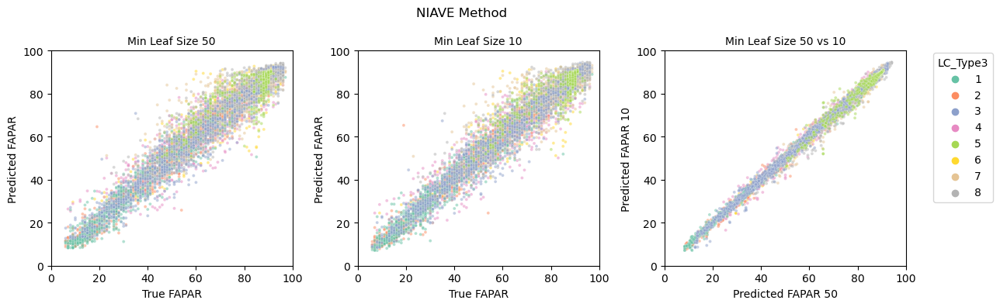

In [28]:
fig, axs = plt.subplots(1,3, figsize=(12, 4))
sns.scatterplot(dfcalbiomeFAPAR, x='FAPAR_50', y='Predicted FAPAR_50', ax=axs[0], hue='LC_Type3_50', palette='Set2', s=8, alpha=0.5, legend=0)
sns.scatterplot(dfcalbiomeFAPAR, x='FAPAR_10', y='Predicted FAPAR_10', ax=axs[1], hue='LC_Type3_50', palette='Set2', s=8, alpha=0.5)
sns.scatterplot(dfcalbiomeFAPAR, x='Predicted FAPAR_50', y='Predicted FAPAR_10', ax=axs[2], hue='LC_Type3_50', palette='Set2', s=8, alpha=0.5, legend=0)

fig.suptitle('NIAVE Method')
axs[0].set_title('Min Leaf Size 50', size=10)
axs[0].set(xlabel='True FAPAR', ylabel='Predicted FAPAR')
axs[0].set_xlim(0, 100)
axs[0].set_ylim(0, 100)

axs[1].set_title('Min Leaf Size 10', size=10)
axs[1].set(xlabel='True FAPAR', ylabel='Predicted FAPAR')
axs[1].set_xlim(0, 100)
axs[1].set_ylim(0, 100)

axs[2].set_title('Min Leaf Size 50 vs 10', size=10)
axs[2].set(xlabel='Predicted FAPAR 50', ylabel='Predicted FAPAR 10')
axs[2].set_xlim(0, 100)
axs[2].set_ylim(0, 100)

fig.tight_layout()

handles, labels = axs[1].get_legend_handles_labels()
fig.legend(handles, labels, loc="upper left", bbox_to_anchor=(1,0.85), title = "LC_Type3")
axs[1].get_legend().set_visible(False)

plt.show()

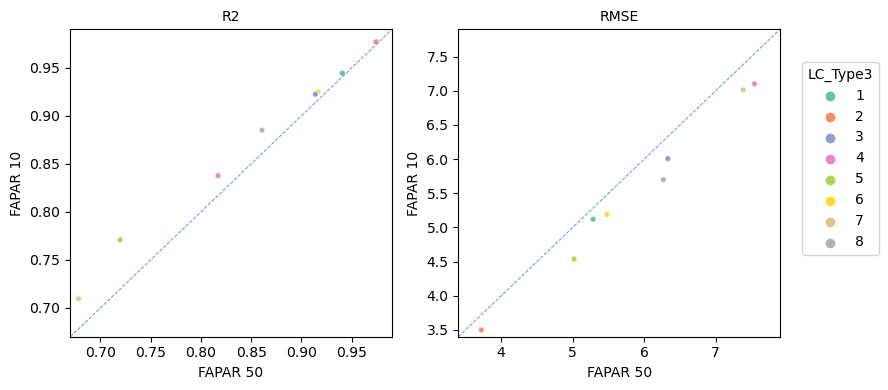

In [29]:
fig, axs = plt.subplots(1,2, figsize=(8, 4))
sns.scatterplot(dfcalbiomeFAPAR, x='R2_50', y='R2_10', ax=axs[0], hue='LC_Type3_50', palette='Set2', s=15, alpha=1, legend=0)
sns.scatterplot(dfcalbiomeFAPAR, x='RMSE_50', y='RMSE_10', ax=axs[1], hue='LC_Type3_50', palette='Set2', s=15, alpha=1)

axs[0].set_title('R2', size=10)
axs[0].set(xlabel='FAPAR 50', ylabel='FAPAR 10')
axs[0].set_xlim(0.67, 0.99)
axs[0].set_ylim(0.67, 0.99)
axs[0].axline((0,0), slope=1, c='cornflowerblue', lw=0.7, ls='--')

axs[1].set_title('RMSE', size=10)
axs[1].set(xlabel='FAPAR 50', ylabel='FAPAR 10')
axs[1].set_xlim(3.4, 7.9)
axs[1].set_ylim(3.4, 7.9)
axs[1].axline((0,0), slope=1, c='cornflowerblue', lw=0.7, ls='--')

fig.tight_layout()

handles, labels = axs[1].get_legend_handles_labels()
fig.legend(handles, labels, loc="upper left", bbox_to_anchor=(1,0.85), title = "LC_Type3")
axs[1].get_legend().set_visible(False)

plt.show()

### KANG LAI

Fitting a Random Forests for LAI using the KANG method

In [89]:
# Empty arrays used later to concatenate dataframes of all LC_Types
dfsLAI = []

# Looping through each LC_Type
for LC_Type3 in calbiomeDictLAIKANG:
    
    # Only fit Random Forests for LC_Types 1-8
    if LC_Type3 <= 8:
        
        # Extracting the dataframe from the calibration and validation data for the LC_Type
        # Only 10000 samples are used from the calibration data
        dfcal = calbiomeDictLAIKANG[LC_Type3]['DF'].sample(10000)
        dfval = valbiomeDictLAI[LC_Type3]['DF']
        
        # Fitting a Random Forest with min leaf size equal to 50
        calbiomeDictLAIKANG[LC_Type3]['regr50'] = RandomForestRegressor(min_samples_leaf = 50)
        calbiomeDictLAIKANG[LC_Type3]['regr50'].fit(dfcal[regressors], dfcal[LAI])
        
        # Fitting a Random Forest with min leaf size equal to 10
        calbiomeDictLAIKANG[LC_Type3]['regr10'] = RandomForestRegressor(min_samples_leaf = 10)
        calbiomeDictLAIKANG[LC_Type3]['regr10'].fit(dfcal[regressors], dfcal[LAI])
        
        trueLAI = dfval[LAI]
        
        # Predicting LAI with the Random Forest using the validation data
        predLAI50 = calbiomeDictLAIKANG[LC_Type3]['regr50'].predict(dfval[regressors])
        predLAI10 = calbiomeDictLAIKANG[LC_Type3]['regr10'].predict(dfval[regressors])
        
        # Determining the number of leaf nodes in each Random Forest
        n50 = 0
        for tree in calbiomeDictLAIKANG[LC_Type3]['regr50'].estimators_:
            n50 += tree.get_n_leaves()
        n10 = 0
        for tree in calbiomeDictLAIKANG[LC_Type3]['regr10'].estimators_:
            n10 += tree.get_n_leaves()
        
        # Inserting the new statistics as a dataframe into the dictionary
        valbiomeDictLAI[LC_Type3]['dfKANG50LAI'] = pd.DataFrame(data={
            'LAI': trueLAI,
            'Predicted LAI': predLAI50,
            'LC_Type3': LC_Type3,
            'R2': calbiomeDictLAIKANG[LC_Type3]['regr50'].score(dfval[regressors], trueLAI),
            'RMSE': metrics.mean_squared_error(predLAI50, trueLAI, squared=False),
            'Nodes': n50})
        
        valbiomeDictLAI[LC_Type3]['dfKANG10LAI'] = pd.DataFrame(data={
            'LAI': trueLAI,
            'Predicted LAI': predLAI10,
            'LC_Type3': LC_Type3,
            'R2': calbiomeDictLAIKANG[LC_Type3]['regr10'].score(dfval[regressors], trueLAI),
            'RMSE': metrics.mean_squared_error(predLAI10, trueLAI, squared=False),
            'Nodes': n10})
        
        # Merge two methods before sampling
        df = valbiomeDictLAI[LC_Type3]['dfKANG50LAI'].join(valbiomeDictLAI[LC_Type3]['dfKANG10LAI'], lsuffix='_50', rsuffix='_10')
        
        # Appending the dataframes to an array used to concatenate later
        dfsLAI.append(df.sample(1000))
        
# Concatenating the dataframes with the predicted LAI values for all LC_Types
dfcalbiomeLAIKANG = pd.concat(dfsLAI)

In [90]:
for LC_Type3 in valbiomeDictLAI:
    if LC_Type3 <= 8:
        print(LC_Type3, valbiomeDictLAI[LC_Type3]['dfKANG50LAI']['Nodes'].unique()[0], valbiomeDictLAI[LC_Type3]['dfKANG10LAI']['Nodes'].unique()[0])

6 9676 49518
4 9643 49414
7 9659 49419
2 9575 45976
1 9670 44636
8 9624 49436
3 9669 49309
5 9633 49489


R^2 and RMSE values for LAI Random Forest with min 50 leaf samples

In [91]:
for LC_Type3 in valbiomeDictLAI:
    if LC_Type3 <= 8:
        df = valbiomeDictLAI[LC_Type3]['dfKANG50LAI'][['R2', 'RMSE']]
        print(LC_Type3, df['R2'].unique()[0], df['RMSE'].unique()[0])

6 0.8587248709154578 7.289891254422329
4 0.7270650029739328 10.48540828872365
7 0.7183881293566321 9.552911628101885
2 0.8211643612774998 5.210842439637992
1 0.7351349288335409 9.828435811385225
8 0.7874663996041207 8.800140303932384
3 0.7013939718207727 10.902801715553663
5 0.6704823598839905 9.200221917120938


R^2 and RMSE values for LAI Random Forest with min 10 leaf samples

In [92]:
for LC_Type3 in valbiomeDictLAI:
    if LC_Type3 <= 8:
        df = valbiomeDictLAI[LC_Type3]['dfKANG10LAI'][['R2', 'RMSE']]
        print(LC_Type3, df['R2'].unique()[0], df['RMSE'].unique()[0])

6 0.8754147397550573 6.845757727648511
4 0.7596295387866177 9.840026796930797
7 0.7460115441036563 9.072297231791616
2 0.8515264382727953 4.7479427098420635
1 0.7662425344322105 9.233254485691806
8 0.8236717214728553 8.015613728259746
3 0.7393132890465223 10.187046175554062
5 0.800324440941893 7.1617873753587435


Scatterplotting True LAI vs Predicted LAI

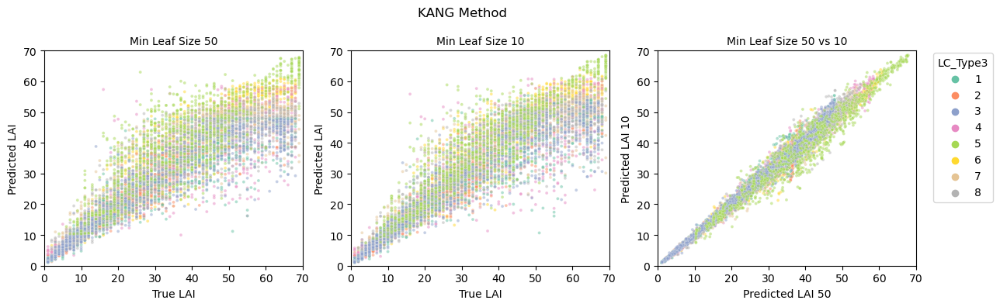

In [93]:
fig, axs = plt.subplots(1,3, figsize=(12, 4))
sns.scatterplot(dfcalbiomeLAIKANG, x='LAI_50', y='Predicted LAI_50', ax=axs[0], hue='LC_Type3_50', palette='Set2', s=8, alpha=0.5, legend=0)
sns.scatterplot(dfcalbiomeLAIKANG, x='LAI_10', y='Predicted LAI_10', ax=axs[1], hue='LC_Type3_50', palette='Set2', s=8, alpha=0.5)
sns.scatterplot(dfcalbiomeLAIKANG, x='Predicted LAI_50', y='Predicted LAI_10', ax=axs[2], hue='LC_Type3_50', palette='Set2', s=8, alpha=0.5, legend=0)

fig.suptitle('KANG Method')
axs[0].set_title('Min Leaf Size 50', size=10)
axs[0].set(xlabel='True LAI', ylabel='Predicted LAI')
axs[0].set_xlim(0, 70)
axs[0].set_ylim(0, 70)

axs[1].set_title('Min Leaf Size 10', size=10)
axs[1].set(xlabel='True LAI', ylabel='Predicted LAI')
axs[1].set_xlim(0, 70)
axs[1].set_ylim(0, 70)

axs[2].set_title('Min Leaf Size 50 vs 10', size=10)
axs[2].set(xlabel='Predicted LAI 50', ylabel='Predicted LAI 10')
axs[2].set_xlim(0, 70)
axs[2].set_ylim(0, 70)

fig.tight_layout()

handles, labels = axs[1].get_legend_handles_labels()
fig.legend(handles, labels, loc="upper left", bbox_to_anchor=(1,0.85), title = "LC_Type3")
axs[1].get_legend().set_visible(False)

plt.show()

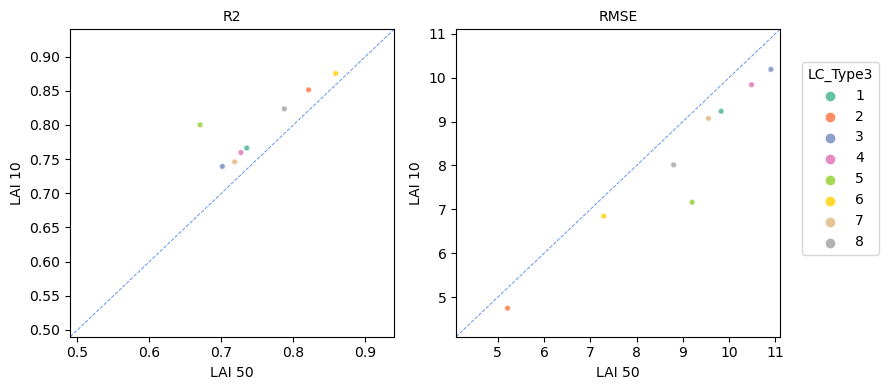

In [95]:
fig, axs = plt.subplots(1,2, figsize=(8, 4))
sns.scatterplot(dfcalbiomeLAIKANG, x='R2_50', y='R2_10', ax=axs[0], hue='LC_Type3_50', palette='Set2', s=15, alpha=1, legend=0)
sns.scatterplot(dfcalbiomeLAIKANG, x='RMSE_50', y='RMSE_10', ax=axs[1], hue='LC_Type3_50', palette='Set2', s=15, alpha=1)

axs[0].set_title('R2', size=10)
axs[0].set(xlabel='LAI 50', ylabel='LAI 10')
axs[0].set_xlim(0.49, 0.94)
axs[0].set_ylim(0.49, 0.94)
axs[0].axline((0,0), slope=1, c='cornflowerblue', lw=0.7, ls='--')

axs[1].set_title('RMSE', size=10)
axs[1].set(xlabel='LAI 50', ylabel='LAI 10')
axs[1].set_xlim(4.1, 11.1)
axs[1].set_ylim(4.1, 11.1)
axs[1].axline((0,0), slope=1, c='cornflowerblue', lw=0.7, ls='--')

fig.tight_layout()

handles, labels = axs[1].get_legend_handles_labels()
fig.legend(handles, labels, loc="upper left", bbox_to_anchor=(1,0.85), title = "LC_Type3")
axs[1].get_legend().set_visible(False)

plt.show()

### KANG FAPAR

Fitting a Random Forests for FAPAR using the KANG method

In [96]:
# Empty arrays used later to concatenate dataframes of all LC_Types
dfsFAPAR = []

# Looping through each LC_Type
for LC_Type3 in calbiomeDictFAPARKANG:
    
    # Only fit Random Forests for LC_Types 1-8
    if LC_Type3 <= 8:
        
        # Extracting the dataframe from the calibration and validation data for the LC_Type
        # Only 10000 samples are used from the calibration data
        dfcal = calbiomeDictFAPARKANG[LC_Type3]['DF'].sample(10000)
        dfval = valbiomeDictFAPAR[LC_Type3]['DF']
        
        # Fitting a Random Forest with min leaf size equal to 50
        calbiomeDictFAPARKANG[LC_Type3]['regr50'] = RandomForestRegressor(min_samples_leaf = 50)
        calbiomeDictFAPARKANG[LC_Type3]['regr50'].fit(dfcal[regressors], dfcal[FAPAR])
        
        # Fitting a Random Forest with min leaf size equal to 10
        calbiomeDictFAPARKANG[LC_Type3]['regr10'] = RandomForestRegressor(min_samples_leaf = 10)
        calbiomeDictFAPARKANG[LC_Type3]['regr10'].fit(dfcal[regressors], dfcal[FAPAR])
        
        trueFAPAR = dfval[FAPAR]
        
        # Predicting FAPAR with the Random Forest using the validation data 
        predFAPAR50 = calbiomeDictFAPARKANG[LC_Type3]['regr50'].predict(dfval[regressors])
        predFAPAR10 = calbiomeDictFAPARKANG[LC_Type3]['regr10'].predict(dfval[regressors])
        
        # Determining the number of leaf nodes in each Random Forest
        n50 = 0
        for tree in calbiomeDictFAPARKANG[LC_Type3]['regr50'].estimators_:
            n50 += tree.get_n_leaves()
        n10 = 0
        for tree in calbiomeDictFAPARKANG[LC_Type3]['regr10'].estimators_:
            n10 += tree.get_n_leaves()
        
        # Inserting the new statistics as a dataframe into the dictionary
        valbiomeDictFAPAR[LC_Type3]['dfKANG50FAPAR'] = pd.DataFrame(data={
            'FAPAR': trueFAPAR,
            'Predicted FAPAR': predFAPAR50,
            'LC_Type3': LC_Type3,
            'R2': calbiomeDictFAPARKANG[LC_Type3]['regr50'].score(dfval[regressors], trueFAPAR),
            'RMSE': metrics.mean_squared_error(predFAPAR50, trueFAPAR, squared=False),
            'Nodes': n50})
        
        valbiomeDictFAPAR[LC_Type3]['dfKANG10FAPAR'] = pd.DataFrame(data={
            'FAPAR': trueFAPAR,
            'Predicted FAPAR': predFAPAR10,
            'LC_Type3': LC_Type3,
            'R2': calbiomeDictFAPARKANG[LC_Type3]['regr10'].score(dfval[regressors], trueFAPAR),
            'RMSE': metrics.mean_squared_error(predFAPAR10, trueFAPAR, squared=False),
            'Nodes': n10})
        
        # Merge two methods before sampling
        df = valbiomeDictFAPAR[LC_Type3]['dfKANG50FAPAR'].join(valbiomeDictFAPAR[LC_Type3]['dfKANG10FAPAR'], lsuffix='_50', rsuffix='_10')
        
        # Appending the dataframes to an array used to concatenate later
        dfsFAPAR.append(df.sample(1000))
        
# Concatenating the dataframes with the predicted LAI values for all LC_Types
dfcalbiomeFAPARKANG = pd.concat(dfsFAPAR)

In [97]:
for LC_Type3 in valbiomeDictFAPAR:
    if LC_Type3 <= 8:
        print(LC_Type3, valbiomeDictFAPAR[LC_Type3]['dfKANG50FAPAR']['Nodes'].unique()[0], valbiomeDictFAPAR[LC_Type3]['dfKANG10FAPAR']['Nodes'].unique()[0])

6 9644 49514
4 9694 49398
7 9724 49453
2 9668 49571
1 9674 49470
8 9736 49538
3 9669 49470
5 9767 50028


R^2 and RMSE values for FAPAR Random Forest with min 50 leaf samples

In [98]:
for LC_Type3 in valbiomeDictFAPAR:
    if LC_Type3 <= 8:
        df = valbiomeDictFAPAR[LC_Type3]['dfKANG50FAPAR'][['R2', 'RMSE']]
        print(LC_Type3, df['R2'].unique()[0], df['RMSE'].unique()[0])

6 0.8895961634153909 8.01619807306172
4 0.8511560094699371 8.782935309439322
7 0.6812708412565895 9.651201848006236
2 0.9615494860313998 4.602952657415126
1 0.9514127754453227 6.318406649538214
8 0.8278043646438789 8.398438546446755
3 0.9465498751084456 6.339752066672066
5 0.5791910083679311 8.589678341115318


R^2 and RMSE values for FAPAR Random Forest with min 10 leaf samples

In [99]:
for LC_Type3 in valbiomeDictFAPAR:
    if LC_Type3 <= 8:
        df = valbiomeDictFAPAR[LC_Type3]['dfKANG10FAPAR'][['R2', 'RMSE']]
        print(LC_Type3, df['R2'].unique()[0], df['RMSE'].unique()[0])

6 0.909337981532143 7.2642210084073815
4 0.8726922792867869 8.12271850355119
7 0.7371242270393 8.76487610998797
2 0.9657013275808521 4.347344819062169
1 0.9532631297843388 6.196926436278395
8 0.8758775467213797 7.130379657958731
3 0.9540623543681169 5.877359803345082
5 0.6806895315426265 7.482400907345284


Scatterplotting True FAPAR vs Predicted FAPAR

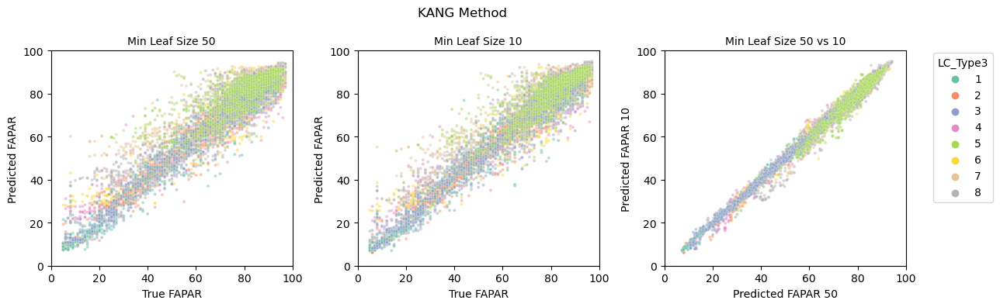

In [100]:
fig, axs = plt.subplots(1,3, figsize=(12, 4))
sns.scatterplot(dfcalbiomeFAPARKANG, x='FAPAR_50', y='Predicted FAPAR_50', ax=axs[0], hue='LC_Type3_50', palette='Set2', s=8, alpha=0.5, legend=0)
sns.scatterplot(dfcalbiomeFAPARKANG, x='FAPAR_10', y='Predicted FAPAR_10', ax=axs[1], hue='LC_Type3_50', palette='Set2', s=8, alpha=0.5)
sns.scatterplot(dfcalbiomeFAPARKANG, x='Predicted FAPAR_50', y='Predicted FAPAR_10', ax=axs[2], hue='LC_Type3_50', palette='Set2', s=8, alpha=0.5, legend=0)

fig.suptitle('KANG Method')
axs[0].set_title('Min Leaf Size 50', size=10)
axs[0].set(xlabel='True FAPAR', ylabel='Predicted FAPAR')
axs[0].set_xlim(0, 100)
axs[0].set_ylim(0, 100)

axs[1].set_title('Min Leaf Size 10', size=10)
axs[1].set(xlabel='True FAPAR', ylabel='Predicted FAPAR')
axs[1].set_xlim(0, 100)
axs[1].set_ylim(0, 100)

axs[2].set_title('Min Leaf Size 50 vs 10', size=10)
axs[2].set(xlabel='Predicted FAPAR 50', ylabel='Predicted FAPAR 10')
axs[2].set_xlim(0, 100)
axs[2].set_ylim(0, 100)

fig.tight_layout()

handles, labels = axs[1].get_legend_handles_labels()
fig.legend(handles, labels, loc="upper left", bbox_to_anchor=(1,0.85), title = "LC_Type3")
axs[1].get_legend().set_visible(False)

plt.show()

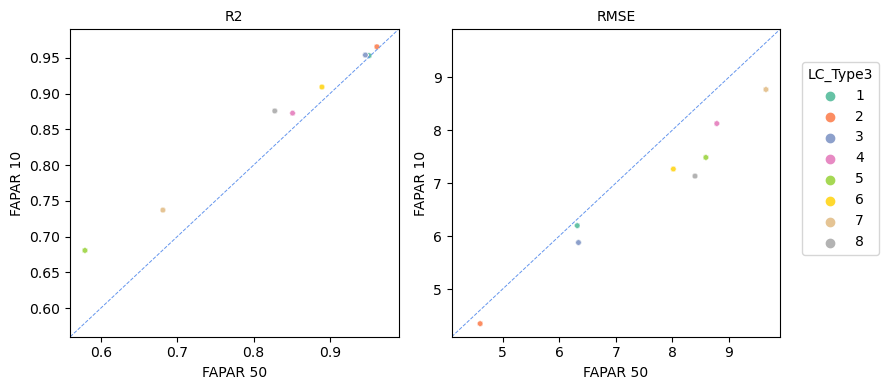

In [102]:
fig, axs = plt.subplots(1,2, figsize=(8, 4))
sns.scatterplot(dfcalbiomeFAPARKANG, x='R2_50', y='R2_10', ax=axs[0], hue='LC_Type3_50', palette='Set2', s=15, alpha=1, legend=0)
sns.scatterplot(dfcalbiomeFAPARKANG, x='RMSE_50', y='RMSE_10', ax=axs[1], hue='LC_Type3_50', palette='Set2', s=15, alpha=1)

axs[0].set_title('R2', size=10)
axs[0].set(xlabel='FAPAR 50', ylabel='FAPAR 10')
axs[0].set_xlim(0.56, 0.99)
axs[0].set_ylim(0.56, 0.99)
axs[0].axline((0,0), slope=1, c='cornflowerblue', lw=0.7, ls='--')

axs[1].set_title('RMSE', size=10)
axs[1].set(xlabel='FAPAR 50', ylabel='FAPAR 10')
axs[1].set_xlim(4.1, 9.9)
axs[1].set_ylim(4.1, 9.9)
axs[1].axline((0,0), slope=1, c='cornflowerblue', lw=0.7, ls='--')

fig.tight_layout()

handles, labels = axs[1].get_legend_handles_labels()
fig.legend(handles, labels, loc="upper left", bbox_to_anchor=(1,0.85), title = "LC_Type3")
axs[1].get_legend().set_visible(False)

plt.show()

## North America

### Random Forests

Reading in calibration and validation data dictionaries

In [ ]:
# Validation data for LAI and FAPAR
valbiomeDictLAI = pd.read_pickle('G:/cassidy/MODISLANDSAT_new/valbiomeDictLAI.pkl')
valbiomeDictFAPAR = pd.read_pickle('G:/cassidy/MODISLANDSAT_new/valbiomeDictFAPAR.pkl')

# Calibration data for LAI and FAPAR
calbiomeDictLAI = pd.read_pickle('G:/cassidy/MODISLANDSAT_new/calbiomeDictLAI.pkl')
calbiomeDictFAPAR = pd.read_pickle('G:/cassidy/MODISLANDSAT_new/calbiomeDictFAPAR.pkl')

# Kang's calibration data for LAI and FAPAR
calbiomeDictLAIKANG = pd.read_pickle('G:/cassidy/MODISLANDSAT_new/calbiomeDictLAIKANG.pkl')
calbiomeDictFAPARKANG = pd.read_pickle('G:/cassidy/MODISLANDSAT_new/calbiomeDictFAPARKANG.pkl')

# Calibration data for LAI and FAPAR
calbiomeDictLAIFTL = pd.read_pickle('G:/cassidy/MODISLANDSAT_new/calbiomeDictLAIFTL.pkl')
calbiomeDictFAPARFTL = pd.read_pickle('G:/cassidy/MODISLANDSAT_new/calbiomeDictFAPARFTL.pkl')

# https://drive.google.com/drive/folders/1jVKwxWPlH7nYnpL1yJAUD2jFkXV3A1kf?usp=share_link

Making copies of dictionaries to subsample North American samples

In [ ]:
# Copy of validation data for LAI and FAPAR
NAvalbiomeDictLAI = copy.deepcopy(valbiomeDictLAI)
NAvalbiomeDictFAPAR = copy.deepcopy(valbiomeDictFAPAR)

# copy of calibration data for LAI and FAPAR
NAcalbiomeDictLAI = copy.deepcopy(calbiomeDictLAI)
NAcalbiomeDictFAPAR = copy.deepcopy(calbiomeDictFAPAR)

Subsampling data to North America only

In [ ]:
for LC_Type3 in valbiomeDictLAI:
    # Validation data for LAI and FAPAR in North America
    df = NAvalbiomeDictLAI[LC_Type3]['DF']
    NAvalbiomeDictLAI[LC_Type3]['DF'] = df.loc[(df['Lat'] >= 7) & (df['Lat'] <= 85) & (df['Lon'] >= -180) & (df['Lon'] <= -20)]
    
    df = NAvalbiomeDictFAPAR[LC_Type3]['DF']
    NAvalbiomeDictFAPAR[LC_Type3]['DF'] = df.loc[(df['Lat'] >= 7) & (df['Lat'] <= 85) & (df['Lon'] >= -180) & (df['Lon'] <= -20)]

    # Calibration data for LAI and FAPAR in North America
    df = NAcalbiomeDictLAI[LC_Type3]['DF']
    NAcalbiomeDictLAI[LC_Type3]['DF'] = df.loc[(df['Lat'] >= 7) & (df['Lat'] <= 85) & (df['Lon'] >= -180) & (df['Lon'] <= -20)]
    
    df = NAcalbiomeDictFAPAR[LC_Type3]['DF']
    NAcalbiomeDictFAPAR[LC_Type3]['DF'] = df.loc[(df['Lat'] >= 7) & (df['Lat'] <= 85) & (df['Lon'] >= -180) & (df['Lon'] <= -20)]

Fitting a Random Forest on the global calibration data using the NAIVE method

In [ ]:
# NAIVE LAI
method='NAIVE'
regressors = ['red','NIR','cosSZA','cosVZA','cosSA']
response = 'LAI'
valbiomeDFLAI = pd.DataFrame()
for LC_type3 in calbiomeDictLAI.keys():
    df = calbiomeDictLAI[LC_type3]['DF']
    calbiomeDictLAI[LC_type3][method+response+'regression']  = RandomForestRegressor(n_estimators=100,min_samples_leaf=10,max_features=5,bootstrap=True,random_state=0,verbose=0,n_jobs=-1,max_leaf_nodes=10000).fit(df[regressors],np.array(df[response]).ravel())
    calbiomeDictLAI[LC_type3]['DF'][method+response] = calbiomeDictLAI[LC_type3][method+response+'regression'].predict(df[regressors])
    valbiomeDictLAI[LC_type3][method+response+'regression'] = calbiomeDictLAI[LC_type3][method+response+'regression']
    valbiomeDictLAI[LC_type3]['DF'][method+response] = valbiomeDictLAI[LC_type3][method+response+'regression'].predict(valbiomeDictLAI[LC_type3]['DF'][regressors])
    valbiomeDFLAI = pd.concat([valbiomeDFLAI,valbiomeDictLAI[LC_type3]['DF']])
sns.scatterplot(valbiomeDFLAI.sample(10000),y=response,x=method+response,hue='LC_type3',s=8,alpha=0.5,palette='muted')

Fitting a Random Forest on the North America calibration data using the NAIVE method

In [ ]:
# NAIVE LAI
method='NA_NAIVE'
regressors = ['red','NIR','cosSZA','cosVZA','cosSA']
response = 'LAI'
NAvalbiomeDFLAI = pd.DataFrame()
for LC_type3 in NAcalbiomeDictLAI.keys():
    df = NAcalbiomeDictLAI[LC_type3]['DF']
    NAcalbiomeDictLAI[LC_type3][method+response+'regression']  = RandomForestRegressor(n_estimators=100,min_samples_leaf=10,max_features=5,bootstrap=True,random_state=0,verbose=0,n_jobs=-1,max_leaf_nodes=10000).fit(df[regressors],np.array(df[response]).ravel())
    NAcalbiomeDictLAI[LC_type3]['DF'][method+response] = NAcalbiomeDictLAI[LC_type3][method+response+'regression'].predict(df[regressors])
    NAvalbiomeDictLAI[LC_type3][method+response+'regression'] = NAcalbiomeDictLAI[LC_type3][method+response+'regression']
    NAvalbiomeDictLAI[LC_type3]['DF'][method+response] = NAvalbiomeDictLAI[LC_type3][method+response+'regression'].predict(NAvalbiomeDictLAI[LC_type3]['DF'][regressors])
    NAvalbiomeDFLAI = pd.concat([NAvalbiomeDFLAI,NAvalbiomeDictLAI[LC_type3]['DF']])
sns.scatterplot(NAvalbiomeDFLAI.sample(10000),y=response,x=method+response,hue='LC_type3',s=8,alpha=0.5,palette='muted')

### Results

Number of samples in each biome for the North American and global calibration dataset

In [ ]:
for LC_Type3 in NAcalbiomeDictLAI:
    print('{0: <3} {1: <8} {2}'.format(LC_Type3, len(NAcalbiomeDictLAI[LC_Type3]['DF']), len(calbiomeDictLAI[LC_Type3]['DF'])))

Number of leaf nodes for each biome for the fitted Random Forests

In [ ]:
for LC_Type3 in NAvalbiomeDictLAI:
    if LC_Type3 <= 8:
        NAnodes = 0
        nodes = 0
        for tree in NAvalbiomeDictLAI[LC_Type3]['NA_NAIVELAIregression'].estimators_:
            NAnodes += tree.get_n_leaves()
        for tree in valbiomeDictLAI[LC_Type3]['NAIVELAIregression'].estimators_:
            nodes += tree.get_n_leaves()
        print('{0: <2} {1: <8} {2}'.format(LC_Type3, NAnodes, nodes))

Calculate the R^2 for the NAIVE method fitted with the North America and Global calibration dataset

In [ ]:
regressors = ['red','NIR','cosSZA','cosVZA','cosSA']
dfR2 = pd.DataFrame()
for LC_Type3 in NAvalbiomeDictLAI:
    if LC_Type3 <= 8:
        R2_NA = NAcalbiomeDictLAI[LC_Type3]['NA_NAIVELAIregression'].score(NAcalbiomeDictLAI[LC_Type3]['DF'][regressors], NAcalbiomeDictLAI[LC_Type3]['DF']['LAI'])
        R2 = calbiomeDictLAI[LC_Type3]['NAIVELAIregression'].score(calbiomeDictLAI[LC_Type3]['DF'][regressors], calbiomeDictLAI[LC_Type3]['DF']['LAI'])
        d = {'LC_Type3': [LC_Type3], 'R2_Global':[R2], 'R2_NA': [R2_NA]}
        df = pd.DataFrame(data=d)
        dfR2 = pd.concat([dfR2, df])
        print('{0: <4} {1: <20} {2}'.format(LC_Type3, R2_NA, R2))

Calculate the RMSE for the NAIVE method fitted with the North America and Global calibration dataset

In [ ]:
dfRMSE = pd.DataFrame()
for LC_Type3 in NAvalbiomeDictLAI:
    if LC_Type3 <= 8:
        RMSE_NA = metrics.mean_squared_error(NAcalbiomeDictLAI[LC_Type3]['DF']['NA_NAIVELAI'], NAcalbiomeDictLAI[LC_Type3]['DF']['LAI'], squared=False)
        RMSE = metrics.mean_squared_error(calbiomeDictLAI[LC_Type3]['DF']['NAIVELAI'], calbiomeDictLAI[LC_Type3]['DF']['LAI'], squared=False)
        d = {'LC_Type3': [LC_Type3], 'RMSE_Global':[RMSE], 'RMSE_NA': [RMSE_NA]}
        df = pd.DataFrame(data=d)
        dfRMSE = pd.concat([dfRMSE, df])
        print('{0: <4} {1: <20} {2}'.format(LC_Type3, RMSE_NA, RMSE))

Scatterplot of the R^2 and RMSE comparing the two datasets

In [ ]:
fig, axs = plt.subplots(1,2, figsize=(8, 4))
sns.scatterplot(dfR2, x='R2_Global', y='R2_NA', ax=axs[0], hue='LC_Type3', palette='Set2', s=15, alpha=1, legend=0)
sns.scatterplot(dfRMSE, x='RMSE_Global', y='RMSE_NA', ax=axs[1], hue='LC_Type3', palette='Set2', s=15, alpha=1)

axs[0].set_title('R2', size=10)
axs[0].set(xlabel='Global', ylabel='North America')
axs[0].set_xlim(0.76, 0.99)
axs[0].set_ylim(0.76, 0.99)
axs[0].axline((0,0), slope=1, c='cornflowerblue', lw=0.7, ls='--')

axs[1].set_title('RMSE', size=10)
axs[1].set(xlabel='Global', ylabel='North America')
axs[1].set_xlim(1.1, 6.9)
axs[1].set_ylim(1.1, 6.9)
axs[1].axline((0,0), slope=1, c='cornflowerblue', lw=0.7, ls='--')

fig.tight_layout()

handles, labels = axs[1].get_legend_handles_labels()
fig.legend(handles, labels, loc="upper left", bbox_to_anchor=(1,0.85), title = "LC_Type3")
axs[1].get_legend().set_visible(False)

plt.show()

Scatterplot of both datasets comparing the predicted LAI and true LAI

In [ ]:
fig, axs = plt.subplots(1,2, figsize=(8, 4))
sns.scatterplot(valbiomeDFLAI.sample(10000), x='LAI', y='NAIVELAI', ax=axs[0], hue='LC_type3', palette='Set2', s=8, alpha=0.5, legend=0)
sns.scatterplot(NAvalbiomeDFLAI.sample(10000), x='LAI', y='NA_NAIVELAI', ax=axs[1], hue='LC_type3', palette='Set2', s=8, alpha=0.5)

fig.suptitle('NAIVE Method')
axs[0].set_title('Global', size=10)
axs[0].set(xlabel='True LAI', ylabel='Predicted LAI')
axs[0].set_xlim(0, 70)
axs[0].set_ylim(0, 70)

axs[1].set_title('North America', size=10)
axs[1].set(xlabel='True LAI', ylabel='Predicted LAI')
axs[1].set_xlim(0, 70)
axs[1].set_ylim(0, 70)

fig.tight_layout()

handles, labels = axs[1].get_legend_handles_labels()
fig.legend(handles, labels, loc="upper left", bbox_to_anchor=(1,0.85), title = "LC_Type3")
axs[1].get_legend().set_visible(False)

plt.show()

## LUT_satFlag Filter

In [210]:
# Kang's calibration data for LAI and FAPAR
calbiomeDictLAIKANG = pd.read_pickle('G:/cassidy/MODISLANDSAT/calbiomeDictLAIKANG.pkl')
calbiomeDictFAPARKANG = pd.read_pickle('G:/cassidy/MODISLANDSAT/calbiomeDictFAPARKANG.pkl')

# https://drive.google.com/drive/folders/1jVKwxWPlH7nYnpL1yJAUD2jFkXV3A1kf?usp=share_link

In [211]:
# Regressors used in fitting the Random Forests
regressors = ['Lat','Lon','red','green','NIR','SWIR1','NDVI','NDWI','cosSZA','cosSA']

# Responses in the Random Forests
satFlag = 'LUT_satFlag'

Concatenate all biome types into one dataframe

In [212]:
dfs = []
for LC_Type3 in calbiomeDictLAIKANG:
    if LC_Type3 <= 8:
        dfs.append(calbiomeDictLAIKANG[LC_Type3]['DF'])
dfKANGLAI = pd.concat(dfs)

Fitting a Random Forest Classifier to predict LUT_satFlag

In [213]:
# Empty arrays used later to concatenate dataframes of all LC_Types
dfs = []

# Looping through each LC_Type
for LC_Type3 in calbiomeDictLAIKANG:
    
    # Only fit Random Forests for LC_Types 1-8
    if LC_Type3 <= 8:
        
        # Extracting the dataframe from the calibration data for the LC_Type
        # Only 10000 samples are used from the calibration data
        dfcal = calbiomeDictLAIKANG[LC_Type3]['DF'].sample(10000)
        dfval = calbiomeDictLAIKANG[LC_Type3]['DF']
        
        # Fitting a Random Forest with min leaf size equal to 10
        calbiomeDictLAIKANG[LC_Type3]['sat_class'] = RandomForestClassifier(n_estimators=100,min_samples_leaf=10,max_features=5,bootstrap=True,random_state=0,verbose=0,n_jobs=-1,max_leaf_nodes=10000)
        calbiomeDictLAIKANG[LC_Type3]['sat_class'].fit(dfcal[regressors], dfcal[satFlag])
        
        # Predicting LUT_satFlag with the Random Forest using the validation data
        predSatFlag = calbiomeDictLAIKANG[LC_Type3]['sat_class'].predict(dfval[regressors])
        
        # Inserting the new statistics as a column into the dataframe
        calbiomeDictLAIKANG[LC_Type3]['DF']['predSatFlag'] = predSatFlag

Filter out all data where the predicted LUT_satFlag and true LUT_satFlag differ

In [214]:
for LC_Type3 in calbiomeDictLAIKANG:
    if LC_Type3 <= 8:
        df = calbiomeDictLAIKANG[LC_Type3]['DF']
        
        # Only keep data where the predicted satFlag matches the true satFlag
        calbiomeDictLAIKANG[LC_Type3]['DF'] = df.loc[df['LUT_satFlag'] == df['predSatFlag']]

In [215]:
# Prints dataframe for biome 1 where predicted LUT_satFlag and true LUT_satFlag differ to check filtering worked
df = calbiomeDictLAIKANG[1]['DF']
df.loc[(df['LUT_satFlag'] != df['predSatFlag']) & (df['LUT_satFlag'] == 0)]

,year,month,day,path,row,Lat,Lon,input36,input45,inputMOD09,...,stdFAPAR,LUT_satFlag,LUT_snowFlag,cosSZA,cosVZA,cosSA,NDVI,NDWI,kde,predSatFlag


Number of samples in each biome type after filtering

In [216]:
for LC_Type3 in calbiomeDictLAIKANG:
    print('{0: <3} {1: <8}'.format(LC_Type3, len(calbiomeDictLAIKANG[LC_Type3]['DF'])))

6   428077  
4   1525431 
7   287518  
9   18743   
2   448124  
1   2170150 
8   50130   
3   231392  
5   176187  
10  2087    


Saturation classification accuracy based on 10-fold cross-validation

6 dict_keys(['fit_time', 'score_time', 'test_accuracy', 'test_f1', 'test_precision', 'test_recall'])
fit_time         4.523362398147583
score_time       0.12764806747436525
test_accuracy    0.9782  
test_f1          0.9748827765701327
test_precision   0.9675914053768485
test_recall      0.9823460853612473
4 dict_keys(['fit_time', 'score_time', 'test_accuracy', 'test_f1', 'test_precision', 'test_recall'])
fit_time         0.33437845706939695
score_time       0.11965720653533936
test_accuracy    0.9921  
test_f1          0.81886589035136
test_precision   0.8976312725353646
test_recall      0.7603260869565218
7 dict_keys(['fit_time', 'score_time', 'test_accuracy', 'test_f1', 'test_precision', 'test_recall'])
fit_time         0.32887897491455076
score_time       0.1146615982055664
test_accuracy    0.9693999999999999
test_f1          0.9013436614558866
test_precision   0.9195260452459724
test_recall      0.8844399331263435


C:\Users\casli\Anaconda3\envs\cassidy\lib\site-packages\sklearn\metrics\_classification.py:1609: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, "true nor predicted", "F-score is", len(true_sum))
C:\Users\casli\Anaconda3\envs\cassidy\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\casli\Anaconda3\envs\cassidy\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\casli\Anaconda3\envs\cassidy\lib\site-packages\sklearn

2 dict_keys(['fit_time', 'score_time', 'test_accuracy', 'test_f1', 'test_precision', 'test_recall'])
fit_time         0.31321532726287843
score_time       0.12353203296661378
test_accuracy    1.0     
test_f1          0.0     
test_precision   0.0     
test_recall      0.0     


C:\Users\casli\Anaconda3\envs\cassidy\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\casli\Anaconda3\envs\cassidy\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\casli\Anaconda3\envs\cassidy\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\casli\Anaconda3\envs\cassidy\lib\site-packages\sklearn\metrics\_classi

1 dict_keys(['fit_time', 'score_time', 'test_accuracy', 'test_f1', 'test_precision', 'test_recall'])
fit_time         0.3296877384185791
score_time       0.1304492712020874
test_accuracy    0.999   
test_f1          0.0     
test_precision   0.0     
test_recall      0.0     
8 dict_keys(['fit_time', 'score_time', 'test_accuracy', 'test_f1', 'test_precision', 'test_recall'])
fit_time         0.3273958444595337
score_time       0.10634889602661132
test_accuracy    0.9671  
test_f1          0.9270254942600321
test_precision   0.922812775598663
test_recall      0.931390873015873
3 dict_keys(['fit_time', 'score_time', 'test_accuracy', 'test_f1', 'test_precision', 'test_recall'])
fit_time         0.31469550132751467
score_time       0.11622653007507325
test_accuracy    0.9967999999999998
test_f1          0.6684887334887335
test_precision   0.8564285714285715
test_recall      0.5766666666666665
5 dict_keys(['fit_time', 'score_time', 'test_accuracy', 'test_f1', 'test_precision', 'test_recall'